In [105]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [106]:
#df = pd.read_csv("Data_Processed/Recommendation.csv")
df = pd.read_csv("Data/Crop_production 2.csv")
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99849 entries, 0 to 99848
Data columns (total 13 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Unnamed: 0          99849 non-null  int64  
 1   State_Name          99849 non-null  object 
 2   Crop_Type           99849 non-null  object 
 3   Crop                99849 non-null  object 
 4   N                   99849 non-null  int64  
 5   P                   99849 non-null  int64  
 6   K                   99849 non-null  int64  
 7   pH                  99849 non-null  float64
 8   rainfall            99849 non-null  float64
 9   temperature         99849 non-null  float64
 10  Area_in_hectares    99849 non-null  float64
 11  Production_in_tons  99849 non-null  float64
 12  Yield_ton_per_hec   99849 non-null  float64
dtypes: float64(6), int64(4), object(3)
memory usage: 9.9+ MB


In [107]:
df = df.drop(["Unnamed: 0"],axis=1)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99849 entries, 0 to 99848
Data columns (total 12 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   State_Name          99849 non-null  object 
 1   Crop_Type           99849 non-null  object 
 2   Crop                99849 non-null  object 
 3   N                   99849 non-null  int64  
 4   P                   99849 non-null  int64  
 5   K                   99849 non-null  int64  
 6   pH                  99849 non-null  float64
 7   rainfall            99849 non-null  float64
 8   temperature         99849 non-null  float64
 9   Area_in_hectares    99849 non-null  float64
 10  Production_in_tons  99849 non-null  float64
 11  Yield_ton_per_hec   99849 non-null  float64
dtypes: float64(6), int64(3), object(3)
memory usage: 9.1+ MB


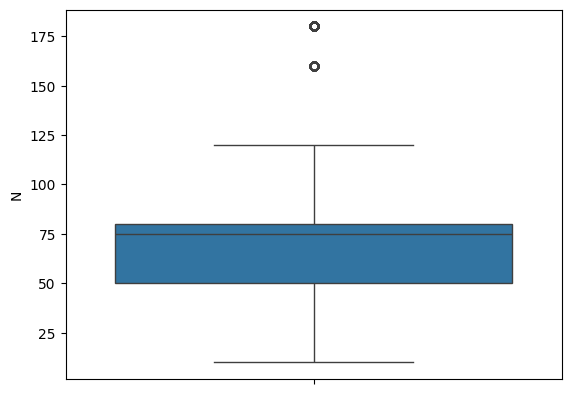

Outlier counter and percentage for N: (5441, 5.449228334785526)


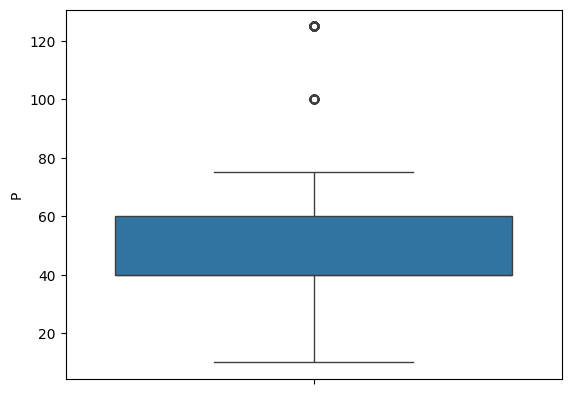

Outlier counter and percentage for P: (152, 0.15222986709931996)


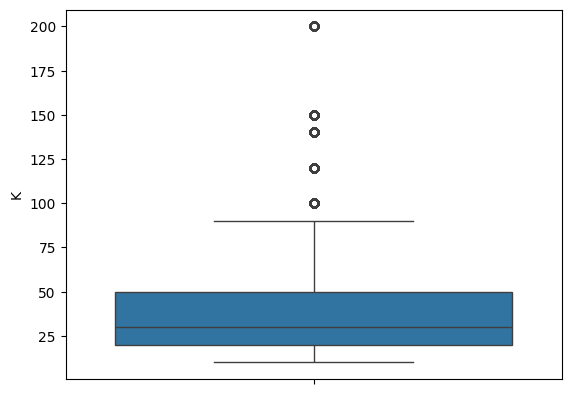

Outlier counter and percentage for K: (7090, 7.100722090356439)


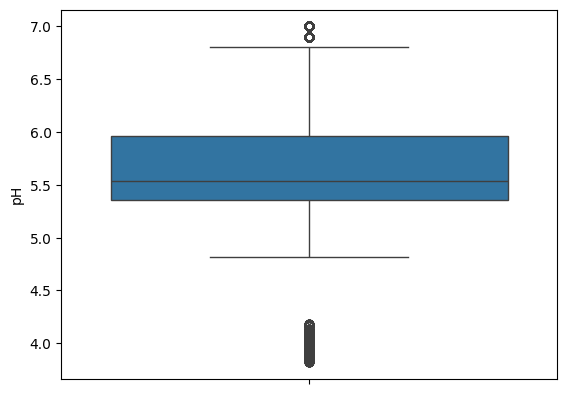

Outlier counter and percentage for pH: (1355, 1.3570491442077537)


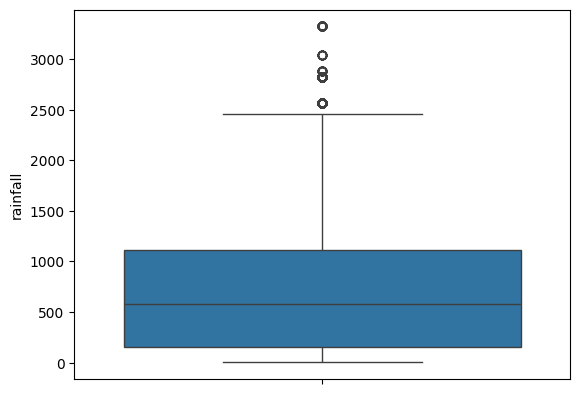

Outlier counter and percentage for rainfall: (1952, 1.9549519774860038)


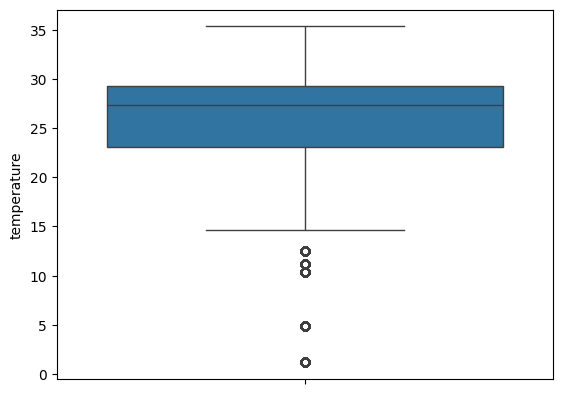

Outlier counter and percentage for temperature: (1596, 1.5984136045428599)


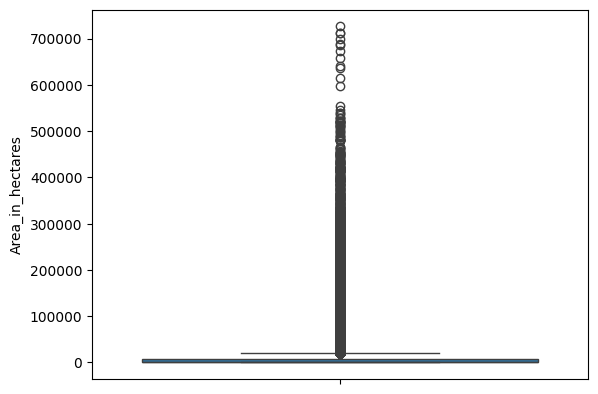

Outlier counter and percentage for Area_in_hectares: (16668, 16.693206742180696)


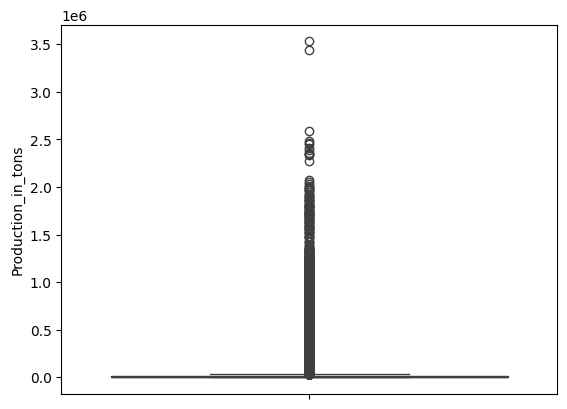

Outlier counter and percentage for Production_in_tons: (16912, 16.93757573936644)


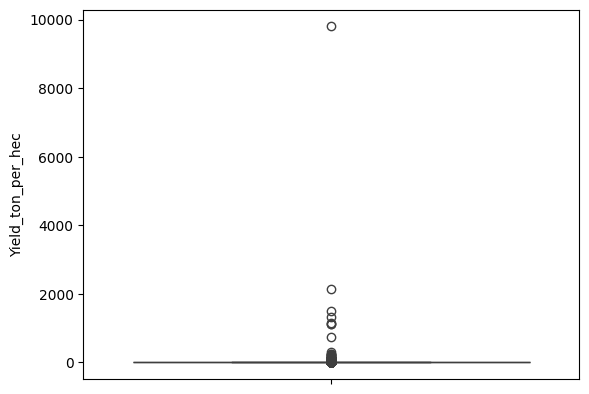

Outlier counter and percentage for Yield_ton_per_hec: (14792, 14.814369698244349)


In [108]:
def outlier_info(df, column):
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1

    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    outliers = df[(df[column] < lower_bound) | (df[column] > upper_bound)]
    outlier_count = outliers.shape[0]
    total_count = df.shape[0]
    outlier_percentage = (outlier_count / total_count) * 100

    return outlier_count, outlier_percentage

def outlier_remover(df,column):
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1

    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    
    df.loc[df[column] < lower_bound, column] = lower_bound
    df.loc[df[column] > upper_bound, column] = upper_bound
    return df
for i in df.columns:
    if df[i].dtype != "object":
        sns.boxplot(df[i])
        plt.show()
        print(f"Outlier counter and percentage for {i}: {outlier_info(df, i)}")


c:\Users\shyam\OneDrive\Desktop\DL_prac\PyTorch_Tut\.myenv\lib\site-packages\pandas\core\arraylike.py:396: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


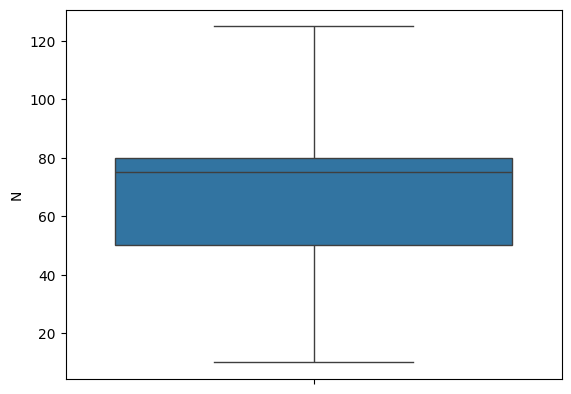

Outlier counter and percentage for N: (0, 0.0)


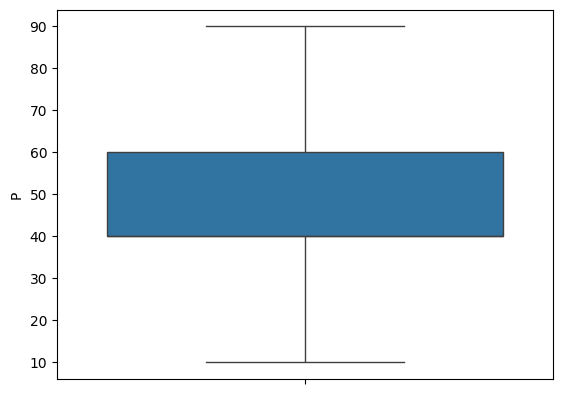

Outlier counter and percentage for P: (0, 0.0)


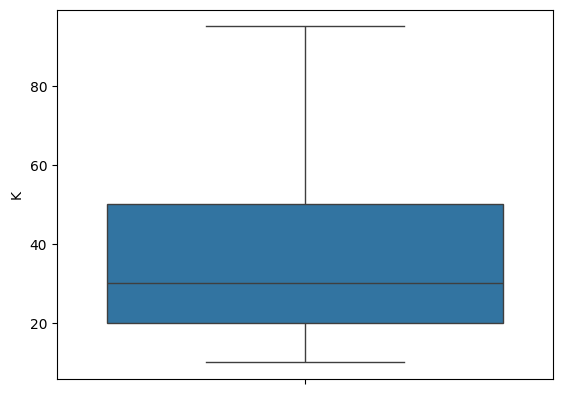

Outlier counter and percentage for K: (0, 0.0)


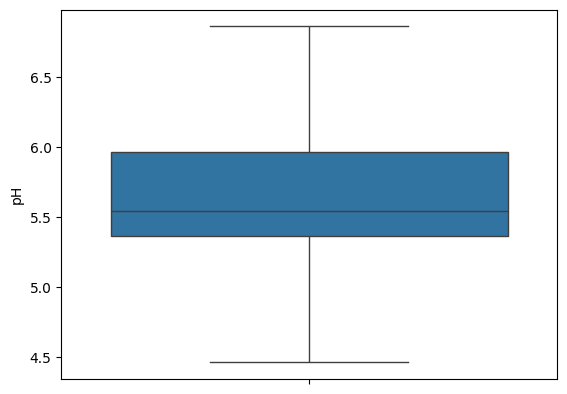

Outlier counter and percentage for pH: (0, 0.0)


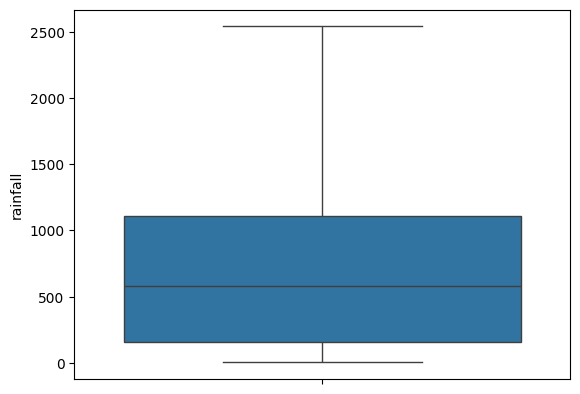

Outlier counter and percentage for rainfall: (0, 0.0)


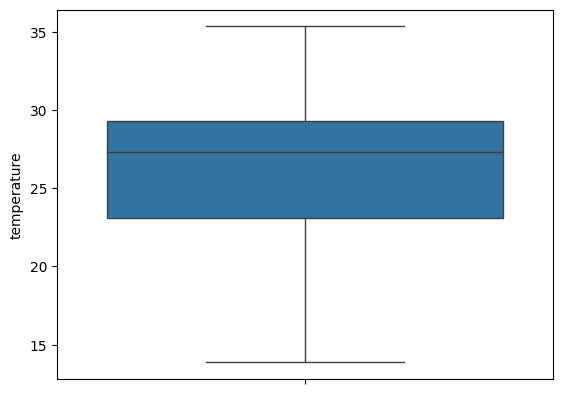

Outlier counter and percentage for temperature: (0, 0.0)


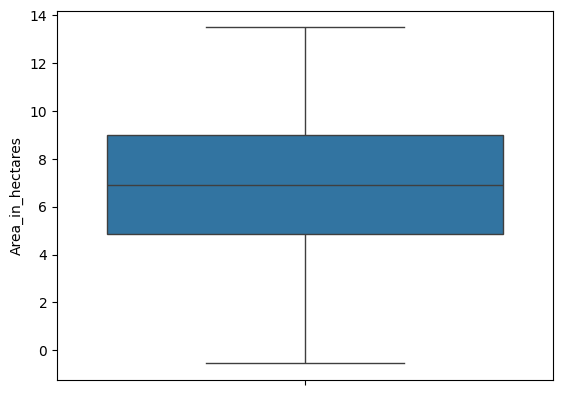

Outlier counter and percentage for Area_in_hectares: (0, 0.0)


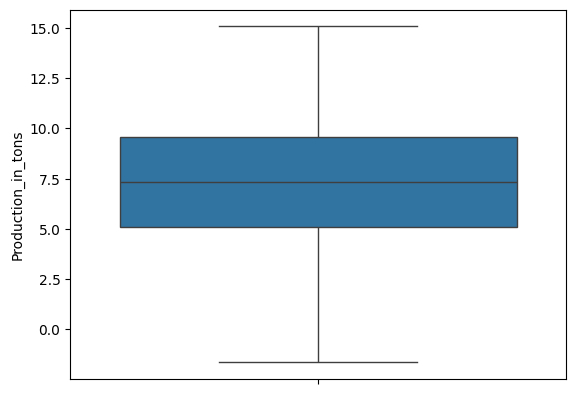

Outlier counter and percentage for Production_in_tons: (0, 0.0)


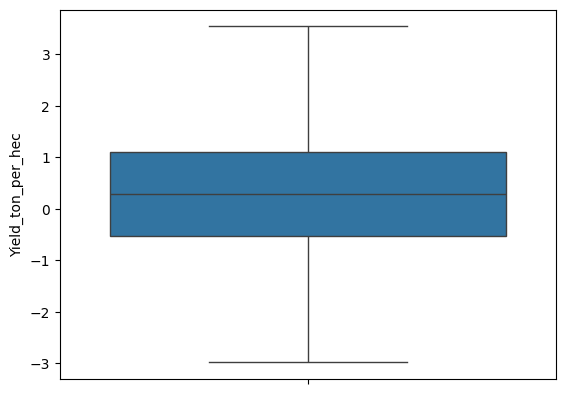

Outlier counter and percentage for Yield_ton_per_hec: (0, 0.0)


In [109]:
df["Area_in_hectares"] = np.log(df["Area_in_hectares"])
df["Production_in_tons"] = np.log(df["Production_in_tons"])
df["Yield_ton_per_hec"] = np.log(df["Yield_ton_per_hec"])


df = outlier_remover(df,"N")
df = outlier_remover(df,"P")
df = outlier_remover(df,"K")
df = outlier_remover(df,"pH")
df = outlier_remover(df,"rainfall")
df = outlier_remover(df,"temperature")
df = outlier_remover(df,"Area_in_hectares")
df = outlier_remover(df,"Production_in_tons")
df = outlier_remover(df,"Yield_ton_per_hec")

for i in df.columns:
    if df[i].dtype != "object":
        sns.boxplot(df[i])
        plt.show()
        print(f"Outlier counter and percentage for {i}: {outlier_info(df, i)}")


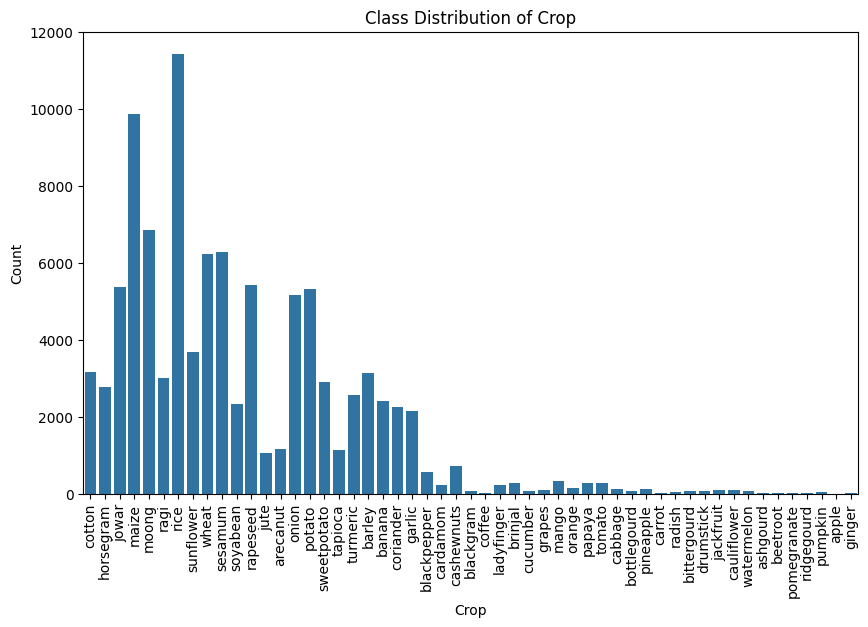

In [110]:

# Plotting the class distribution
plt.figure(figsize=(10, 6))
sns.countplot(x=df['Crop'])
plt.title('Class Distribution of Crop')
plt.xlabel('Crop')
plt.ylabel('Count')
plt.xticks(rotation=90)
plt.show()

In [111]:
tt = df["Crop"].value_counts()
print(tt)
df = df[df["Crop"] != "apple"]
df = df[df["Crop"] != "coffee"]
tt = df["Crop"].value_counts()
print(tt)

Crop
rice           11430
maize           9857
moong           6855
sesamum         6291
wheat           6225
rapeseed        5413
jowar           5369
potato          5324
onion           5164
sunflower       3682
cotton          3157
barley          3139
ragi            2995
sweetpotato     2899
horsegram       2784
turmeric        2562
banana          2409
soyabean        2325
coriander       2253
garlic          2138
arecanut        1154
tapioca         1134
jute            1058
cashewnuts       732
blackpepper      571
mango            330
tomato           284
brinjal          282
papaya           281
cardamom         237
ladyfinger       217
orange           146
cabbage          125
pineapple        117
cauliflower      105
grapes           104
jackfruit         90
drumstick         73
cucumber          72
bittergourd       67
watermelon        59
blackgram         58
bottlegourd       58
radish            45
pumpkin           37
carrot            28
ashgourd          28
pomegran

Encoding and Scaling

In [112]:
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import LabelEncoder

C = ["State_Name","Crop_Type","Crop"]
le_D = {}
for i in C:
    le_D[i] = LabelEncoder()
    df[i] = le_D[i].fit_transform(df[i])

bulk_scaler = StandardScaler()
features_to_scale = ["State_Name","Crop_Type","N","P","K","pH","rainfall","temperature","Area_in_hectares","Production_in_tons","Yield_ton_per_hec"]
#features_to_scale = ["N","P","K","pH","rainfall","temperature","Area_in_hectares","Yield_ton_per_hec"]
df[features_to_scale] = bulk_scaler.fit_transform(df[features_to_scale])

df.info()
df.nunique()

<class 'pandas.core.frame.DataFrame'>
Index: 99840 entries, 0 to 99848
Data columns (total 12 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   State_Name          99840 non-null  float64
 1   Crop_Type           99840 non-null  float64
 2   Crop                99840 non-null  int32  
 3   N                   99840 non-null  float64
 4   P                   99840 non-null  float64
 5   K                   99840 non-null  float64
 6   pH                  99840 non-null  float64
 7   rainfall            99840 non-null  float64
 8   temperature         99840 non-null  float64
 9   Area_in_hectares    99840 non-null  float64
 10  Production_in_tons  99840 non-null  float64
 11  Yield_ton_per_hec   99840 non-null  float64
dtypes: float64(11), int32(1)
memory usage: 9.5 MB


State_Name               33
Crop_Type                 4
Crop                     51
N                        14
P                        12
K                        12
pH                       82
rainfall                107
temperature             105
Area_in_hectares      26342
Production_in_tons    33212
Yield_ton_per_hec     71528
dtype: int64

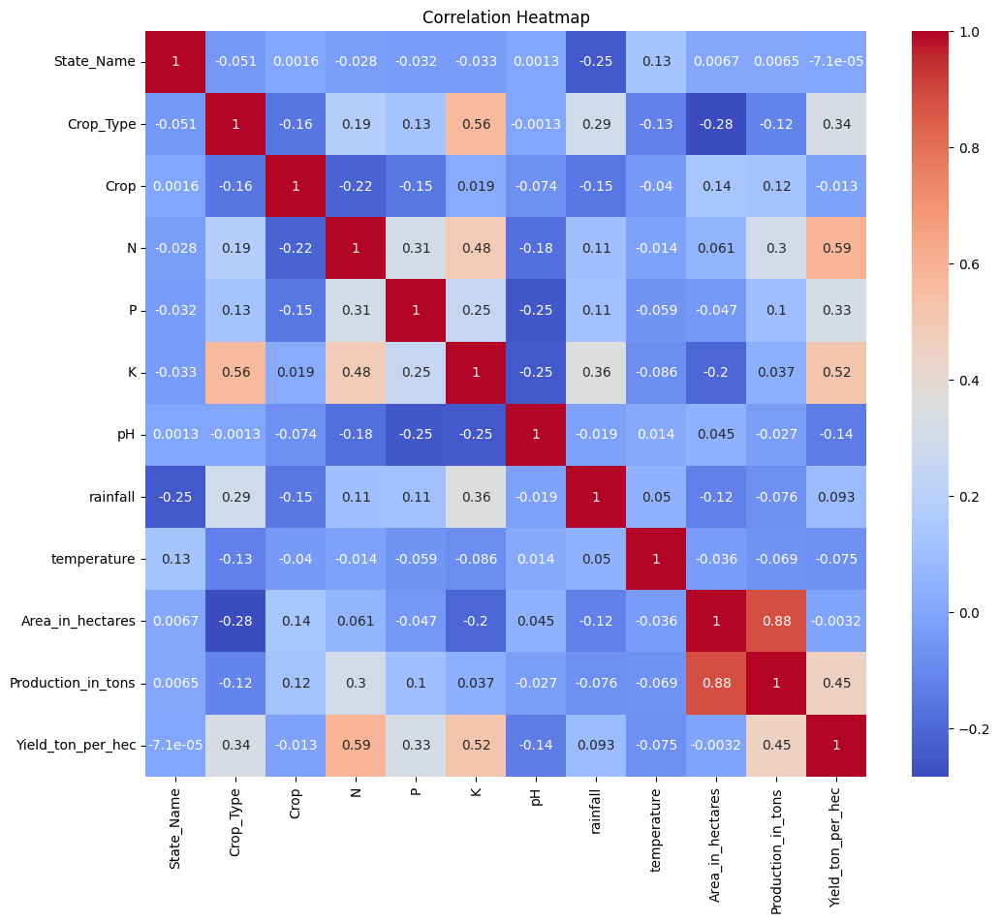

In [113]:
plt.figure(figsize=(12, 10))
correlation_matrix = df.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Heatmap')
plt.show()

In [114]:
from sklearn.decomposition import PCA

t = df[["Production_in_tons","Area_in_hectares"]].values
pca = PCA(n_components=1)
X_pca = pca.fit_transform(t)

df = df.drop(["Production_in_tons","Area_in_hectares","Yield_ton_per_hec"],axis=1)
df["PCA"] = X_pca

df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 99840 entries, 0 to 99848
Data columns (total 10 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   State_Name   99840 non-null  float64
 1   Crop_Type    99840 non-null  float64
 2   Crop         99840 non-null  int32  
 3   N            99840 non-null  float64
 4   P            99840 non-null  float64
 5   K            99840 non-null  float64
 6   pH           99840 non-null  float64
 7   rainfall     99840 non-null  float64
 8   temperature  99840 non-null  float64
 9   PCA          99840 non-null  float64
dtypes: float64(9), int32(1)
memory usage: 8.0 MB


In [115]:
import torch
from torch.utils.data import Dataset, DataLoader, random_split,TensorDataset
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
import torch.nn as nn
import torch.optim as optim
from collections import Counter
from imblearn.over_sampling import *
data = df

In [116]:
class CropRecommendationModel(nn.Module):
    def __init__(self, input_size, hidden_size, num_classes):
        super(CropRecommendationModel, self).__init__()
        self.fc1 = nn.Linear(input_size, 128)
        self.relu = nn.ReLU()
        self.fc2 = nn.Linear(128,64)
        self.fc3 = nn.Linear(64,32)
        self.sigmoid = nn.Sigmoid()
        self.fc4 = nn.Linear(32, num_classes)
    
    def forward(self, x):
        x = self.relu(self.fc1(x))
        x = self.relu(self.fc2(x))
        x = self.relu(self.fc3(x))
        x = self.fc4(x)
        return x

In [117]:
class CropRecommendationModel(nn.Module):
    def __init__(self, input_size, hidden_size, num_classes):
        super(CropRecommendationModel, self).__init__()
        self.fc1 = nn.Linear(input_size, hidden_size)
        self.relu = nn.ReLU()
        self.fc2 = nn.Linear(hidden_size, num_classes)
    
    def forward(self, x):
        x = self.relu(self.fc1(x))
        x = self.fc2(x)
        return x

In [118]:
from sklearn.datasets import make_classification
from sklearn.decomposition import PCA,IncrementalPCA
from matplotlib.colors import ListedColormap
from sklearn.metrics import confusion_matrix, roc_curve, auc, precision_recall_curve
from sklearn.model_selection import KFold
import seaborn as sns
from sklearn.metrics import confusion_matrix, roc_curve, auc, precision_recall_curve
from sklearn.model_selection import KFold
import seaborn as sns
from sklearn.manifold import TSNE
import shap
from sklearn.metrics import precision_recall_fscore_support
import matplotlib.pyplot as plt
import seaborn as sns
import torch
import torch.nn as nn
import torch.optim as optim
import pandas as pd
from sklearn.metrics import confusion_matrix, precision_recall_curve, roc_curve, auc
from sklearn.preprocessing import LabelEncoder
import numpy as np
from sklearn.calibration import calibration_curve

def plot_tsne_pca(features, targets, target_names, sample_size=2000):
    # Subsample the data for faster computation
    if len(features) > sample_size:
        idx = np.random.choice(len(features), sample_size, replace=False)
        features_sampled = features[idx]
        targets_sampled = targets[idx]
    else:
        features_sampled = features
        targets_sampled = targets

    # TSNE
    tsne = TSNE(n_components=2, random_state=42, n_jobs=-1)
    tsne_results = tsne.fit_transform(features_sampled)
    
 
    for i, target_name in enumerate(target_names):
        plt.scatter(tsne_results[targets_sampled == i, 0], tsne_results[targets_sampled == i, 1], label=le_D["Crop"].inverse_transform([target_name])[0], s=10)
    plt.title("t-SNE")
    plt.legend(loc="center left", bbox_to_anchor=(1, 0.5))
    plt.show()
    
    # PCA
    pca = IncrementalPCA(n_components=2)
    pca_results = pca.fit_transform(features_sampled)
    
    for i, target_name in enumerate(target_names):
        plt.scatter(pca_results[targets_sampled == i, 0], pca_results[targets_sampled == i, 1], label=le_D["Crop"].inverse_transform([target_name])[0], s=10)
    plt.title("PCA")
    plt.legend(loc="center left", bbox_to_anchor=(1, 0.5))
    plt.show()
def plot_radar_chart(metrics_df):
    labels = metrics_df['Class']
    num_vars = len(labels)

    angles = np.linspace(0, 2 * np.pi, num_vars, endpoint=False).tolist()
    angles += angles[:1]

    fig, ax = plt.subplots(figsize=(8, 8), subplot_kw=dict(polar=True))
    ax.set_theta_offset(np.pi / 2)
    ax.set_theta_direction(-1)

    for metric in metrics_df.columns[1:]:
        values = metrics_df[metric].tolist()
        values += values[:1]
        ax.plot(angles, values, label=metric)
        ax.fill(angles, values, alpha=0.1)

    ax.set_yticklabels([])
    ax.set_xticks(angles[:-1])
    ax.set_xticklabels(labels)
    ax.legend(loc='upper right', bbox_to_anchor=(0.1, 0.1))
    plt.title('Metrics Radar Chart')
    plt.show()
    
def compute_metrics(val_target, val_predicted, num_classes):
    precision, recall, f1, _ = precision_recall_fscore_support(val_target, val_predicted, average=None, labels=range(num_classes),zero_division=1)
    metrics = {
        'Class': range(num_classes),
        'Precision': precision,
        'Recall': recall,
        'F1-Score': f1
    }
    return pd.DataFrame(metrics)

# def train_validation(train_features, test_features, train_target, test_target):

#     input_size = train_features.shape[1]
#     hidden_size = 64
#     num_classes = len(data['Crop'].unique())

#     model = CropRecommendationModel(input_size, hidden_size, num_classes).to("cuda")
#     num_epochs = 1100
#     learning_rate = 0.001
#     criterion = nn.CrossEntropyLoss()
#     optimizer = optim.Adam(model.parameters(), lr=learning_rate)

#     train_losses = []
#     test_losses = []
#     train_accuracies = []
#     test_accuracies = []
#     for epoch in range(num_epochs):
#         model.train()
#         outputs = model(train_features)
#         loss = criterion(outputs, train_target)
#         optimizer.zero_grad()
#         loss.backward()
#         optimizer.step()
        
#         train_losses.append(loss.item())
#         # if (epoch+1) % 2 == 0:
#         #     print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}')
#         model.eval()
#         with torch.no_grad():
#             test_outputs = model(test_features)
#             test_loss = criterion(test_outputs, test_target)
#             _, test_predicted = torch.max(test_outputs.data, 1)
#             test_correct = (test_predicted == test_target).sum().item()
#             test_accuracy = test_correct / test_target.size(0)
#             test_losses.append(test_loss.item())
#             test_accuracies.append(test_accuracy)

#             train_outputs = model(train_features)
#             _, train_predicted = torch.max(train_outputs.data, 1)
#             train_correct = (train_predicted == train_target).sum().item()
#             train_accuracy = train_correct / train_target.size(0)
#             train_accuracies.append(train_accuracy)

#     # Plot the losses and accuracies
#     plt.figure(figsize=(12,6))
#     plt.subplot(1, 2, 1)
#     plt.plot(range(num_epochs), train_losses, label='Train Loss',color="orange")
#     plt.grid()
#     plt.xlabel("Epochs")
#     plt.ylabel("Loss")
#     plt.title(" Training Epoch vs Loss Plot")
#     plt.legend()
#     plt.subplot(1, 2, 2)
#     plt.plot(range(num_epochs), test_losses, label='Val Loss')
#     plt.grid()
#     plt.xlabel("Epochs")
#     plt.ylabel("Loss")
#     plt.title("Validation Epoch vs Loss Plot")
#     plt.legend()
#     plt.tight_layout()
#     plt.show()
    
#     plt.figure(figsize=(12,6))
#     plt.subplot(1, 2, 1)
#     plt.plot(range(num_epochs), train_accuracies, label='Train Accuracy',color="orange")
#     plt.grid()
#     plt.xlabel("Epochs")
#     plt.ylabel("Accuracy")
#     plt.title("Training Epoch vs Accuracy Plot")
#     plt.legend()
#     plt.subplot(1, 2, 2)
#     plt.plot(range(num_epochs), test_accuracies, label='Val Accuracy')
#     plt.grid()
#     plt.xlabel("Epochs")
#     plt.ylabel("Accuracy")
#     plt.title("Validation Epoch vs Accuracy Plot")
#     plt.legend()
#     plt.tight_layout()
#     plt.show()

#     model.eval()
#     with torch.no_grad():
#         outputs = model(test_features)
#         _, predicted = torch.max(outputs.data, 1)
#         accuracy = (predicted == test_target).sum().item() / test_target.size(0)

#     print(f'Test Accuracy: {accuracy * 100:.2f}%')
#     all_metrics = []
#     fold_metrics = compute_metrics(test_target.cpu().numpy(), test_predicted.cpu().numpy(), num_classes)
#     all_metrics.append(fold_metrics)
#     avg_metrics = pd.concat(all_metrics).groupby('Class').mean().reset_index()
#     avg_metrics['Class'] = le_D['Crop'].inverse_transform(avg_metrics['Class'].astype(int))
#     plot_radar_chart(avg_metrics)
#     val_target_onehot = nn.functional.one_hot(test_target, num_classes=num_classes).cpu().numpy()
#     roc_auc_dict = {}
    
#     plt.figure(figsize=(10, 6))
#     for i in range(num_classes):
#         fpr, tpr, _ = roc_curve(val_target_onehot[:, i], test_outputs.cpu().numpy()[:, i])
#         roc_auc_dict[i] = auc(fpr, tpr)
#         plt.plot(fpr, tpr, lw=2, label=f'Class {le_D["Crop"].inverse_transform([i])[0]} (area = {roc_auc_dict[i]:0.2f})')
#     plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
#     plt.grid()
#     plt.xlabel('False Positive Rate')
#     plt.ylabel('True Positive Rate')
#     plt.title('ROC Curve')
#     plt.legend(loc="center left", bbox_to_anchor=(1, 0.5))
#     plt.tight_layout()
#     plt.show()
    
   
#     # plot_tsne_pca(train_features.cpu(), train_target.cpu(), target_names=data['Crop'].unique())
#     # plot_tsne_pca(test_features.cpu(), test_target.cpu(), target_names=data['Crop'].unique())
#     return model,criterion

# from sklearn.model_selection import KFold

def train_validation(train_features, test_features, train_target, test_target):

    input_size = train_features.shape[1]
    hidden_size = 64
    num_classes = len(data['Crop'].unique())

    model = CropRecommendationModel(input_size, hidden_size, num_classes).to("cuda")
    num_epochs = 1100
    learning_rate = 0.001
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)

    train_losses = []
    test_losses = []
    train_accuracies = []
    test_accuracies = []
    for epoch in range(num_epochs):
        model.train()
        outputs = model(train_features)
        loss = criterion(outputs, train_target)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        
        train_losses.append(loss.item())

        model.eval()
        with torch.no_grad():
            test_outputs = model(test_features)
            test_loss = criterion(test_outputs, test_target)
            _, test_predicted = torch.max(test_outputs.data, 1)
            test_correct = (test_predicted == test_target).sum().item()
            test_accuracy = test_correct / test_target.size(0)
            test_losses.append(test_loss.item())
            test_accuracies.append(test_accuracy)

            train_outputs = model(train_features)
            _, train_predicted = torch.max(train_outputs.data, 1)
            train_correct = (train_predicted == train_target).sum().item()
            train_accuracy = train_correct / train_target.size(0)
            train_accuracies.append(train_accuracy)

    # Plotting all graphs in a single figure
    
    # Loss and Accuracy Graphs
    plt.plot(range(num_epochs), train_losses, label='Train Loss', color="orange")
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.title("Training Epoch vs Loss Plot")
    plt.legend()
    plt.grid()
    plt.show()

    plt.plot(range(num_epochs), test_losses, label='Val Loss')
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.title("Validation Epoch vs Loss Plot")
    plt.legend()
    plt.grid()
    plt.show()

    plt.plot(range(num_epochs), train_accuracies, label='Train Accuracy', color="orange")
    plt.xlabel("Epochs")
    plt.ylabel("Accuracy")
    plt.title("Training Epoch vs Accuracy Plot")
    plt.legend()
    plt.grid()
    plt.show()

    plt.plot(range(num_epochs), test_accuracies, label='Val Accuracy')
    plt.xlabel("Epochs")
    plt.ylabel("Accuracy")
    plt.title("Validation Epoch vs Accuracy Plot")
    plt.legend()
    plt.grid()
    plt.show()

    model.eval()
    with torch.no_grad():
        outputs = model(test_features)
        _, predicted = torch.max(outputs.data, 1)
        accuracy = (predicted == test_target).sum().item() / test_target.size(0)

    print(f'Test Accuracy: {accuracy * 100:.2f}%')
    all_metrics = []
    fold_metrics = compute_metrics(test_target.cpu().numpy(), test_predicted.cpu().numpy(), num_classes)
    all_metrics.append(fold_metrics)
    avg_metrics = pd.concat(all_metrics).groupby('Class').mean().reset_index()
    avg_metrics['Class'] = le_D['Crop'].inverse_transform(avg_metrics['Class'].astype(int))
    plot_radar_chart(avg_metrics)
    
    # Precision-Recall Curve
    precisions, recalls, _ = precision_recall_curve(test_target.cpu().numpy(), test_predicted.cpu().numpy(), pos_label=1)
    plt.plot(recalls, precisions, lw=2)
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title('Precision-Recall Curve')
    plt.grid()
    plt.show()

    # ROC Curve
    val_target_onehot = nn.functional.one_hot(test_target, num_classes=num_classes).cpu().numpy()
    roc_auc_dict = {}
    
    for i in range(num_classes):
        fpr, tpr, _ = roc_curve(val_target_onehot[:, i], test_outputs.cpu().numpy()[:, i])
        roc_auc_dict[i] = auc(fpr, tpr)
        plt.plot(fpr, tpr, lw=2, label=f'Class {le_D["Crop"].inverse_transform([i])[0]} (area = {roc_auc_dict[i]:0.2f})')
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve')
    plt.legend(loc="center left", bbox_to_anchor=(1, 0.5))
    plt.grid()
    plt.show()

    # Class Distribution Graph
    plt.figure(figsize=(10, 6))
    class_counts = pd.Series(train_target.cpu().numpy()).value_counts().sort_index()
    class_names = le_D['Crop'].inverse_transform(class_counts.index)
    plt.bar(class_names, class_counts)
    plt.xlabel('Class')
    plt.ylabel('Count')
    plt.title('Class Distribution')
    plt.grid()
    plt.show()

    # Lift Chart
    # For the lift chart, we need predicted probabilities
    probs = nn.functional.softmax(test_outputs, dim=1).cpu().numpy()
    gains = []
    lift = []
    thresholds = np.linspace(0, 1, 101)
    for threshold in thresholds:
        selected = probs[:, 1] >= threshold
        gain = np.sum(test_target.cpu().numpy()[selected]) / np.sum(test_target.cpu().numpy())
        lift.append(gain / threshold)
        gains.append(gain)
    
    plt.plot(thresholds, lift)
    plt.xlabel('Threshold')
    plt.ylabel('Lift')
    plt.title('Lift Chart')
    plt.grid()
    plt.show()

    # Gain Chart
    plt.plot(thresholds, gains)
    plt.xlabel('Threshold')
    plt.ylabel('Gain')
    plt.title('Gain Chart')
    plt.grid()
    plt.show()


    plot_tsne_pca(train_features.cpu(), train_target.cpu(), target_names=data['Crop'].unique())
    return model, criterion

def cross_check(features, target,k=5):
   
    #model_class = CropRecommendationModel(input_size, hidden_size, num_classes).to("cuda")
    num_epochs = 1100
    learning_rate = 0.001
    #criterion = nn.CrossEntropyLoss()
    #optimizer = optim.Adam(model.parameters(), lr=learning_rate)
    kf = KFold(n_splits=k, shuffle=True, random_state=42)
    fold_results = []

    for fold, (train_idx, val_idx) in enumerate(kf.split(features)):
        train_features, val_features = features[train_idx], features[val_idx]
        train_target, val_target = target[train_idx], target[val_idx]
        input_size = train_features.shape[1]
        hidden_size = 64
        num_classes = len(data['Crop'].unique())

        model = CropRecommendationModel(input_size, hidden_size, num_classes).to("cuda")
        criterion = nn.CrossEntropyLoss()
        optimizer = optim.Adam(model.parameters(), lr=learning_rate)
        
        xt = []
        yt = []
        for epoch in range(num_epochs):
            model.train()
            outputs = model(train_features)
            loss = criterion(outputs, train_target)
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            xt.append(epoch)
            yt.append(loss.item())

        if fold == 0:
            xt = np.array(xt)
            yt = np.array(yt)
            plt.plot(xt, yt, label=f'Fold {fold+1}')
            plt.xlabel("Epochs")
            plt.grid()
            plt.ylabel("Avg_Epoch_Loss per Epoch")
            plt.title("Epoch vs Loss Plot for Fold 1")
            plt.legend()
            plt.show()
            print(f'Epoch [{xt[-1]+1}/{num_epochs}], Loss: {yt[-1]:.4f}')

        model.eval()
        with torch.no_grad():
            val_outputs = model(val_features)
            val_loss = criterion(val_outputs, val_target)
            _, predicted = torch.max(val_outputs.data, 1)
            correct = (predicted == val_target).sum().item()
            accuracy = correct / val_target.size(0)

        fold_results.append({'fold': fold, 'val_loss': val_loss.item(), 'accuracy': accuracy})
        print(f'Fold {fold+1}, Validation Loss: {val_loss.item()}, Accuracy: {accuracy*100:.2f}%')

    # Visualization of k-fold cross-validation results
    val_losses = [result['val_loss'] for result in fold_results]
    accuracies = [result['accuracy'] for result in fold_results]

    avg_val_loss = np.mean(val_losses)
    avg_accuracy = np.mean(accuracies)

    # Plotting validation loss for each fold
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.plot(range(1, k + 1), val_losses, marker='o', linestyle='-', color='b')
    plt.xlabel("Fold")
    plt.ylabel("Validation Loss")
    plt.title("Validation Loss per Fold")
    plt.grid()

    # Plotting accuracy for each fold
    plt.subplot(1, 2, 2)
    plt.plot(range(1, k + 1), accuracies, marker='o', linestyle='-', color='g')
    plt.xlabel("Fold")
    plt.ylabel("Accuracy")
    plt.title("Accuracy per Fold")
    plt.grid()

    plt.suptitle("K-Fold Cross-Validation Results")
    plt.show()

    print(f'Average Validation Loss: {avg_val_loss:.4f}, Average Accuracy: {avg_accuracy*100:.2f}%')




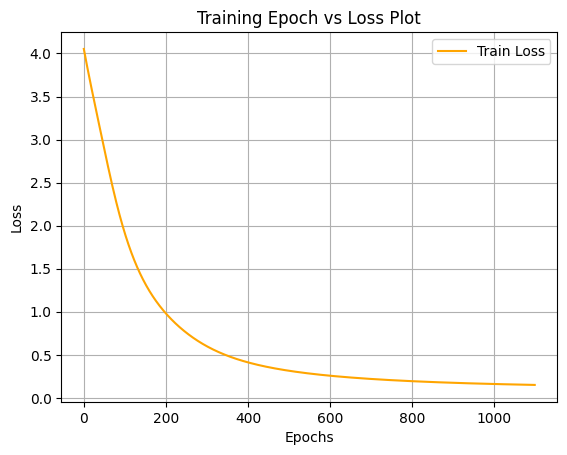

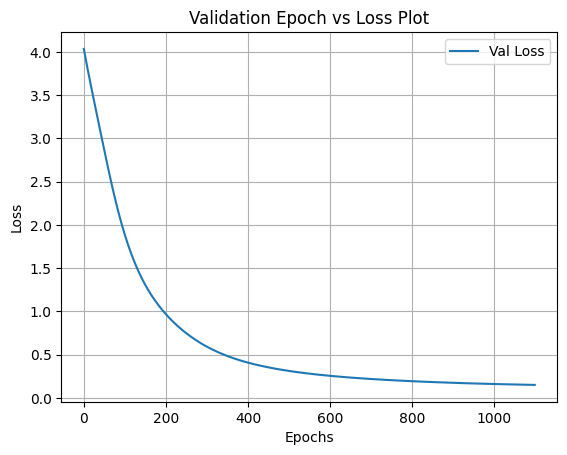

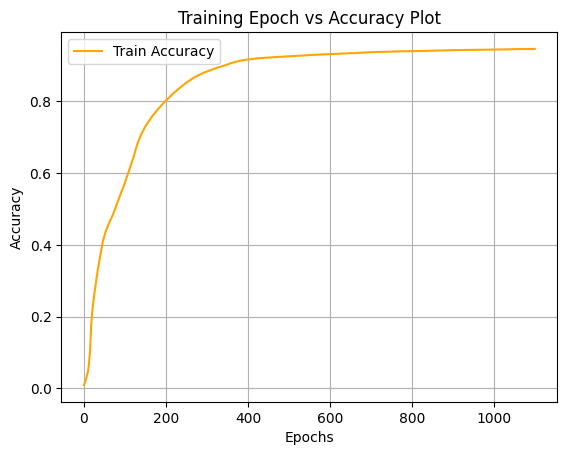

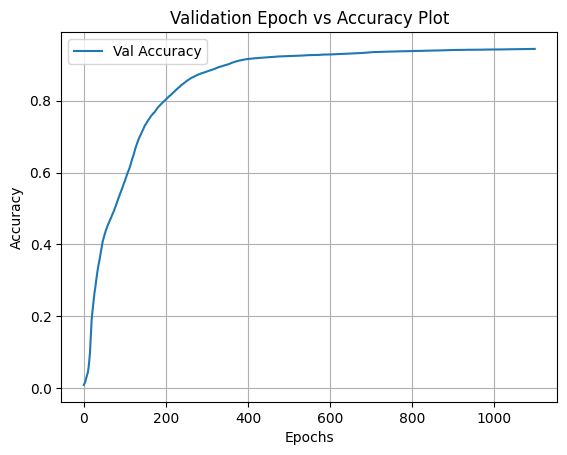

Test Accuracy: 94.42%


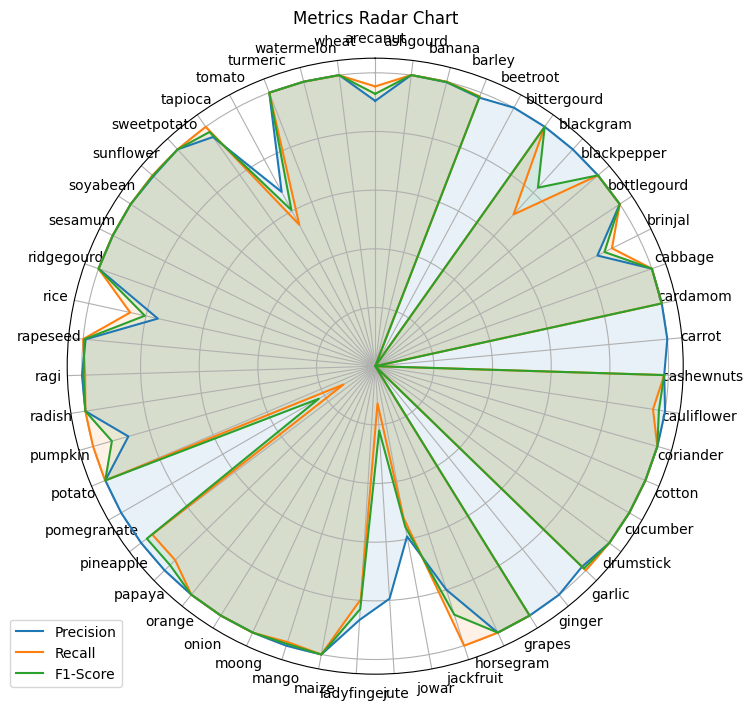

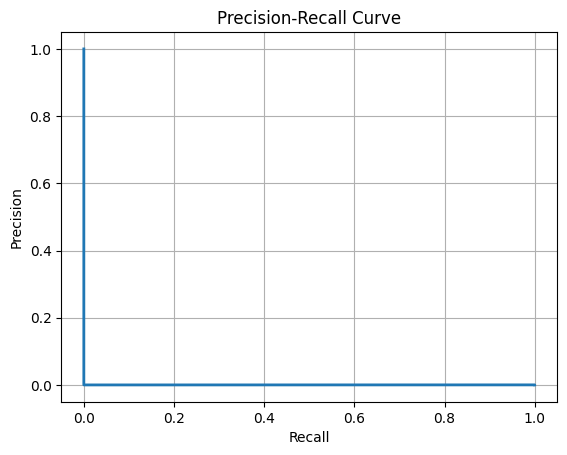

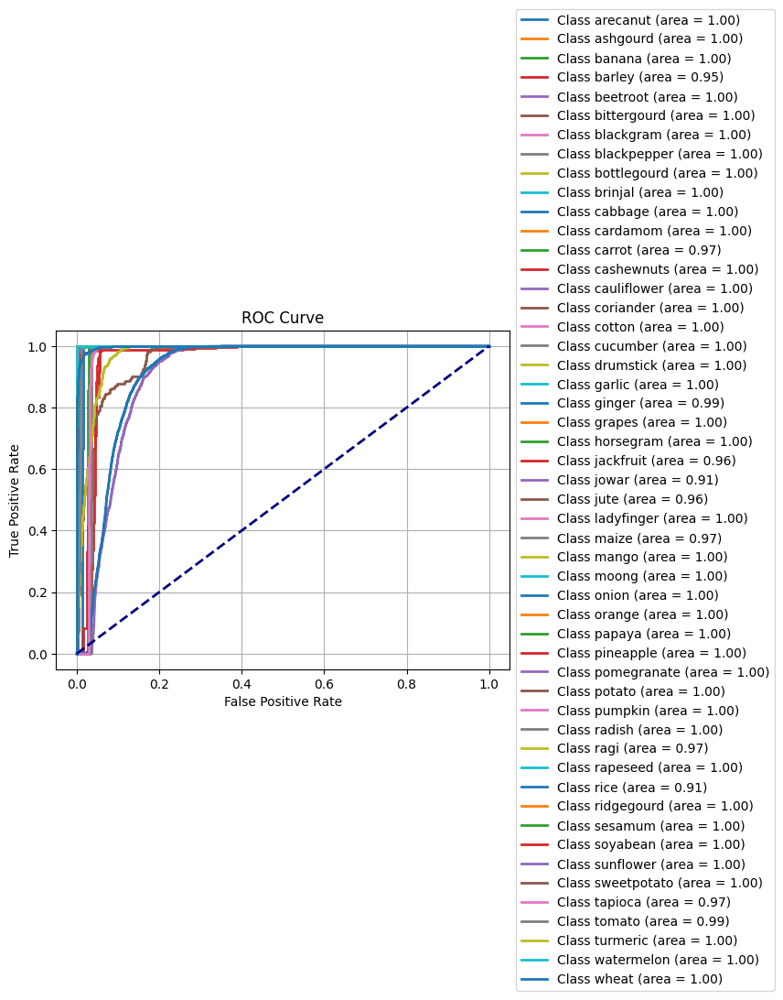

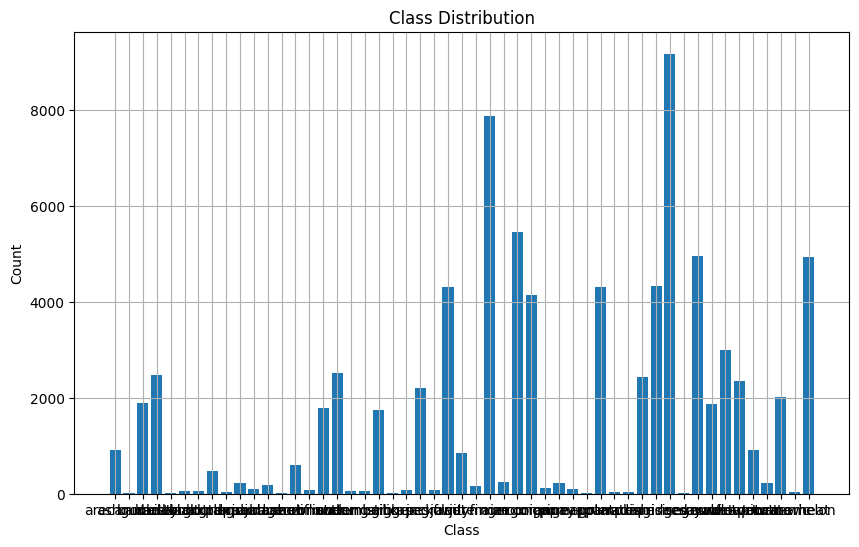

C:\Users\shyam\AppData\Local\Temp\ipykernel_18268\3034830407.py:341: RuntimeWarning: divide by zero encountered in double_scalars
  lift.append(gain / threshold)


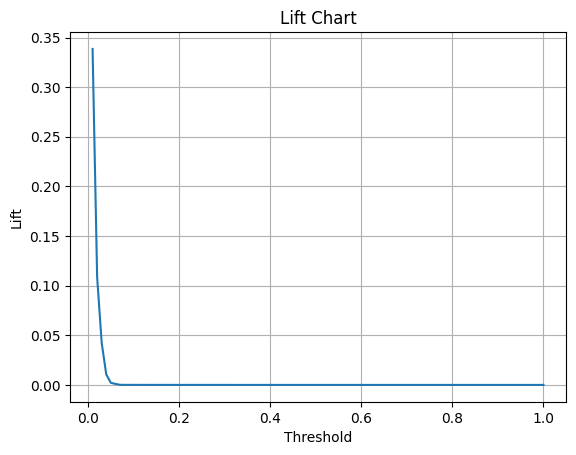

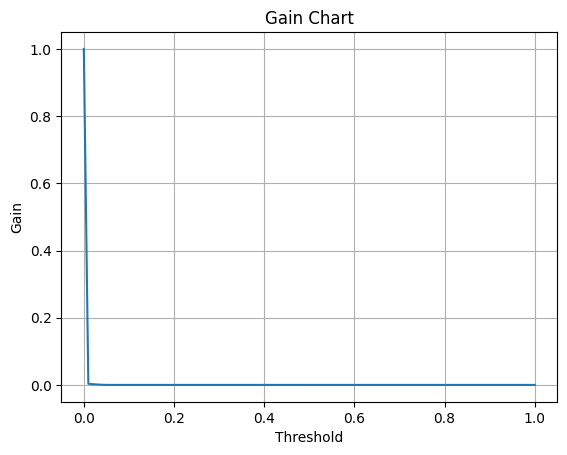

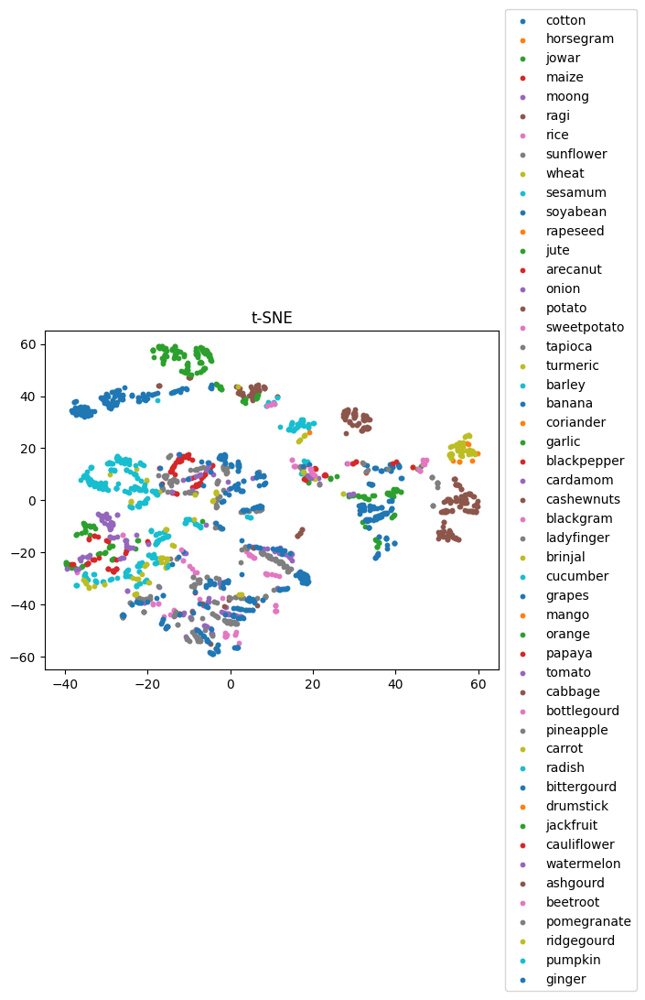

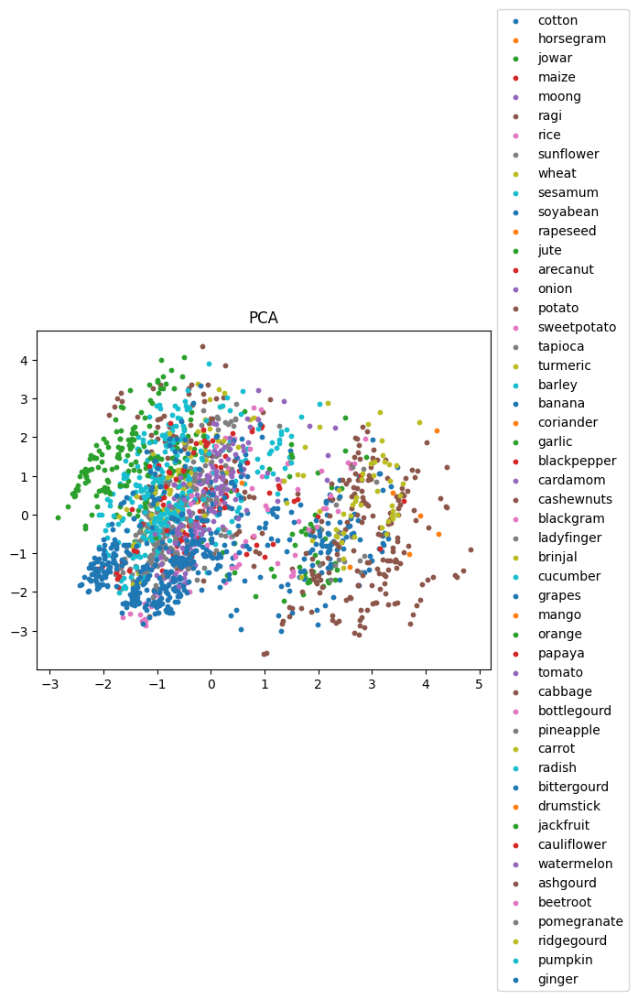

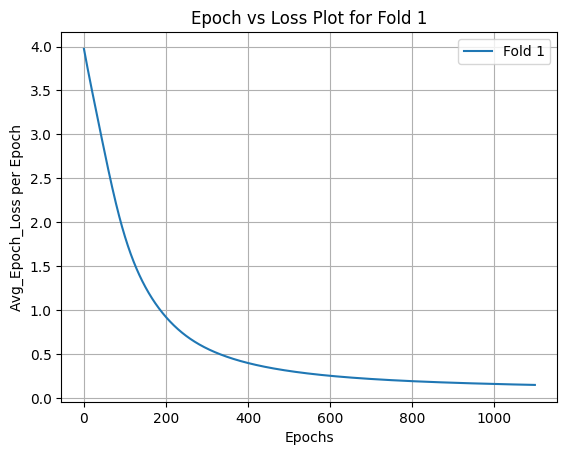

Epoch [1100/1100], Loss: 0.1480
Fold 1, Validation Loss: 0.1482957899570465, Accuracy: 94.73%
Fold 2, Validation Loss: 0.15182159841060638, Accuracy: 94.81%
Fold 3, Validation Loss: 0.15184356272220612, Accuracy: 94.78%
Fold 4, Validation Loss: 0.1505943238735199, Accuracy: 94.63%
Fold 5, Validation Loss: 0.14912322163581848, Accuracy: 94.72%


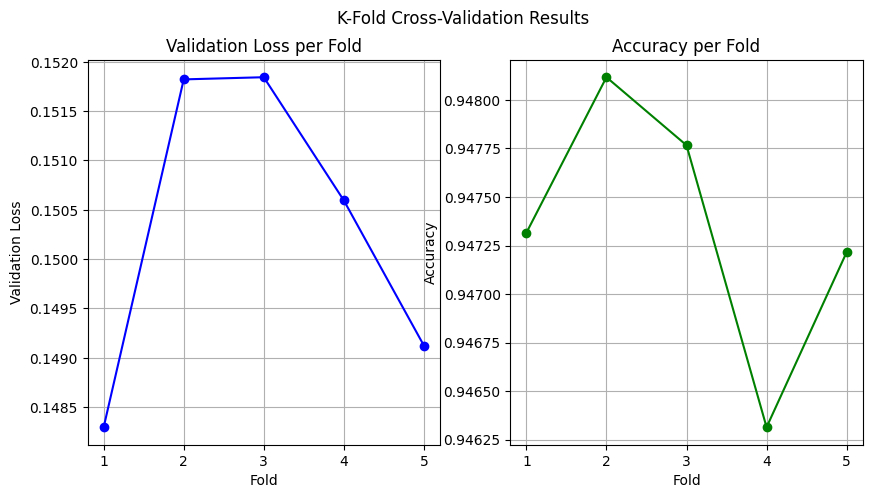

Average Validation Loss: 0.1503, Average Accuracy: 94.73%
Random OverSampler


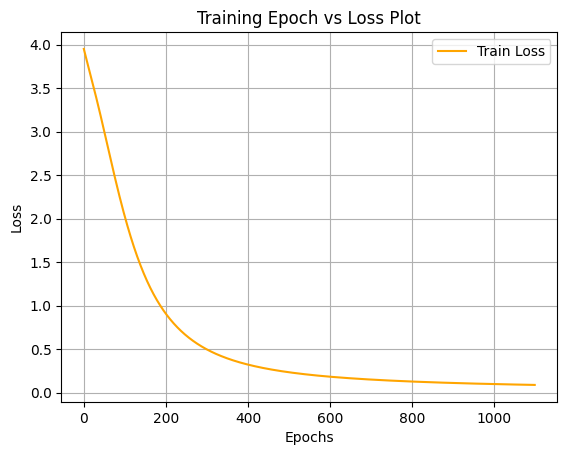

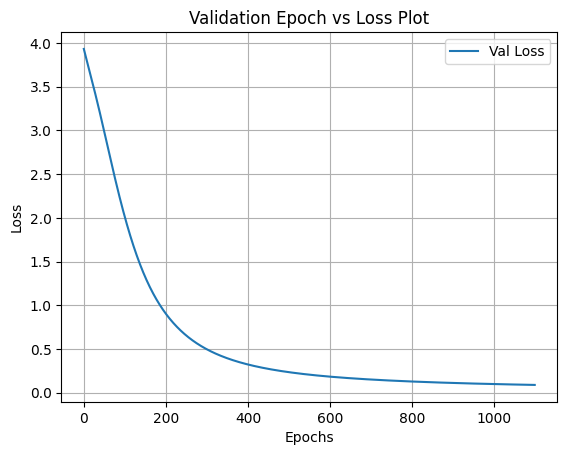

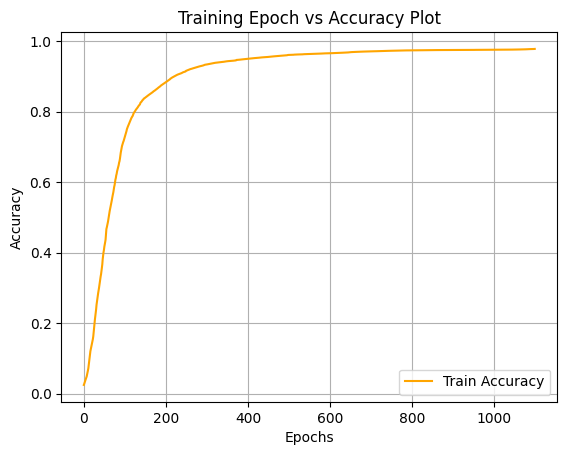

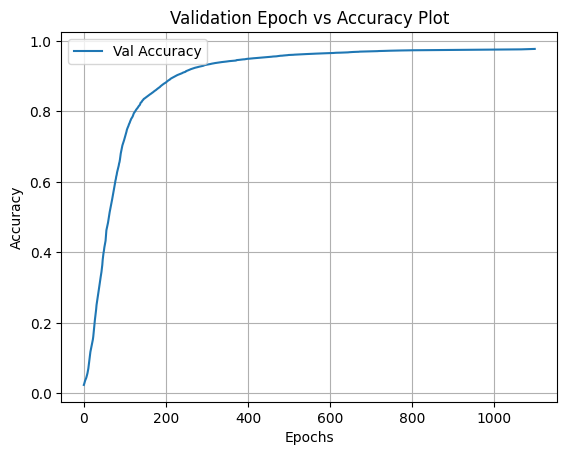

Test Accuracy: 97.74%


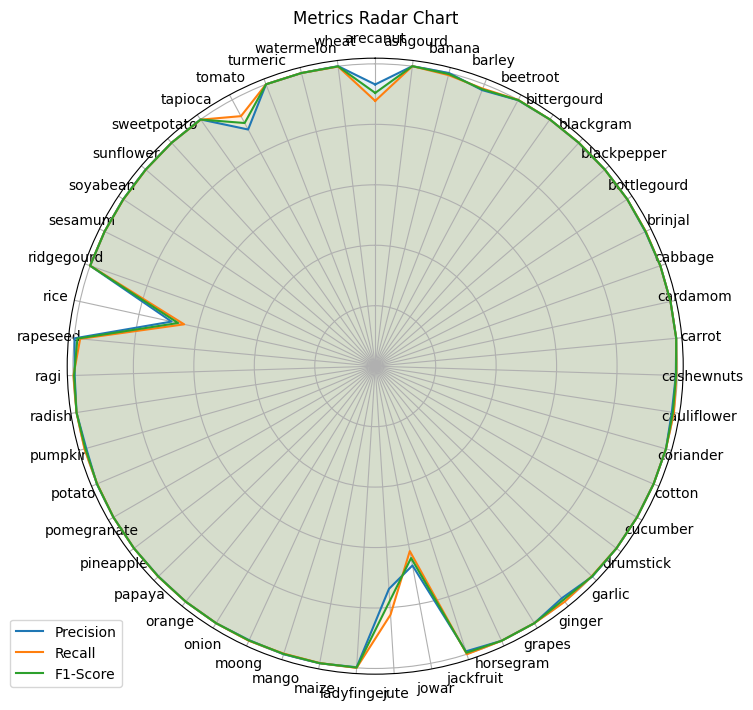

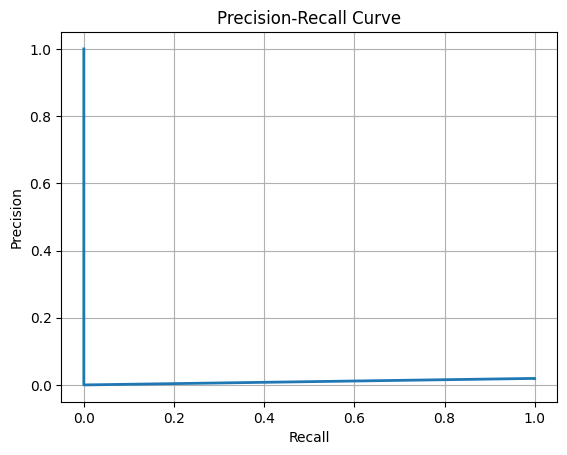

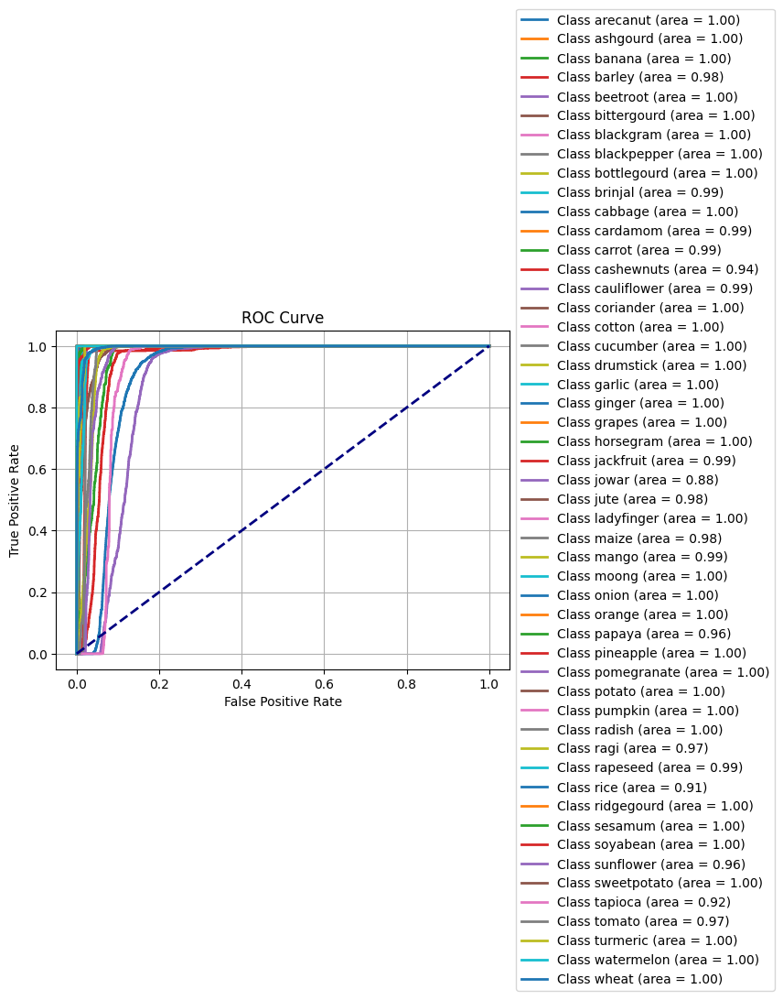

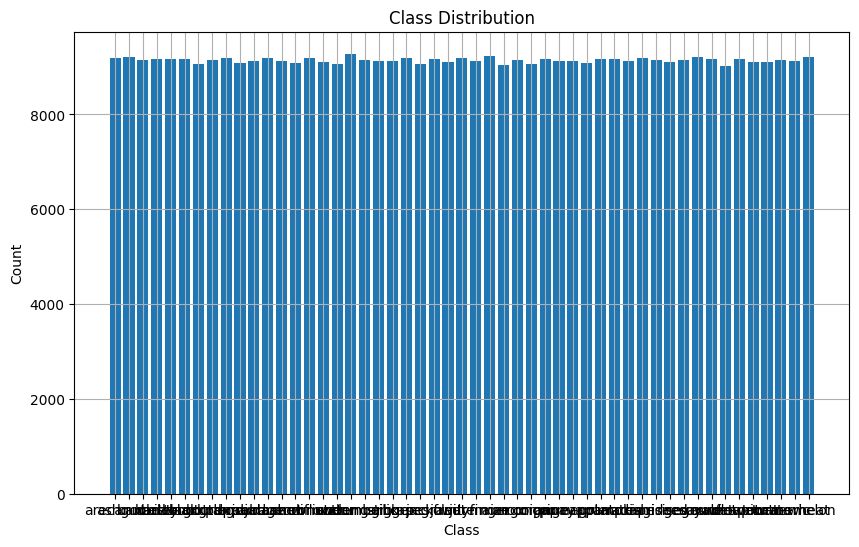

C:\Users\shyam\AppData\Local\Temp\ipykernel_18268\3034830407.py:341: RuntimeWarning: divide by zero encountered in double_scalars
  lift.append(gain / threshold)


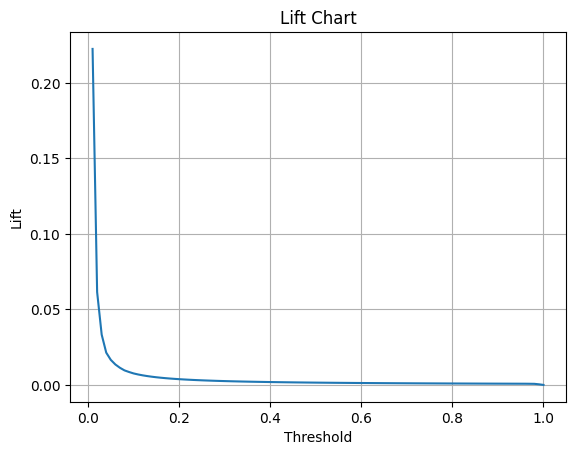

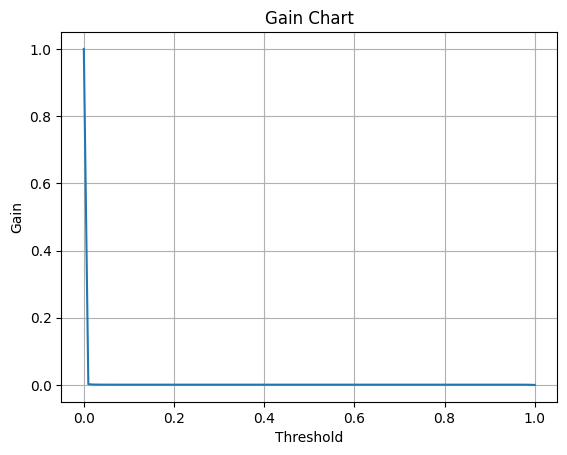

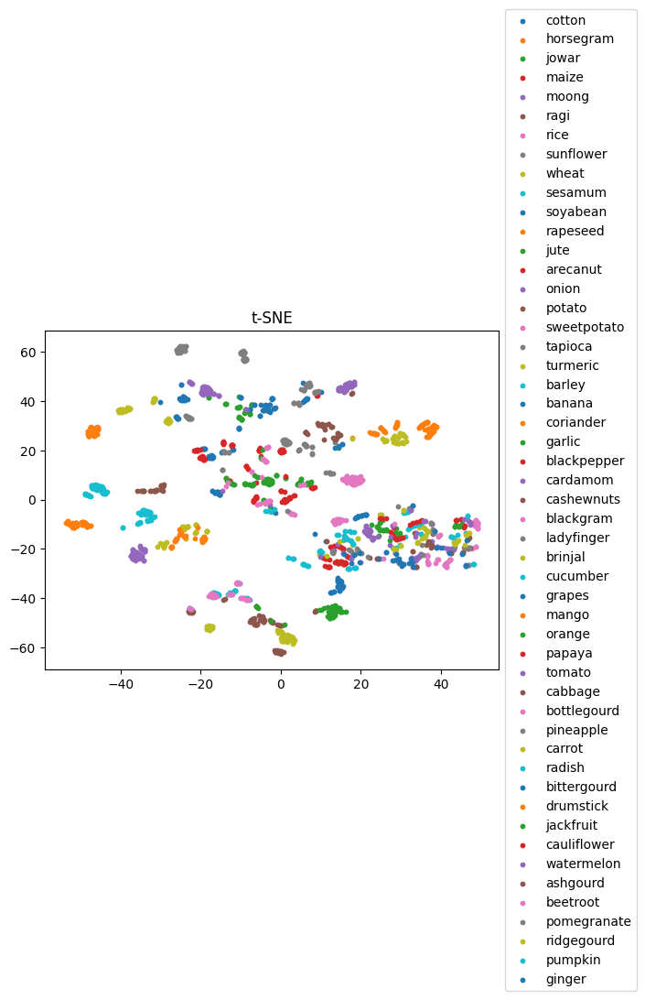

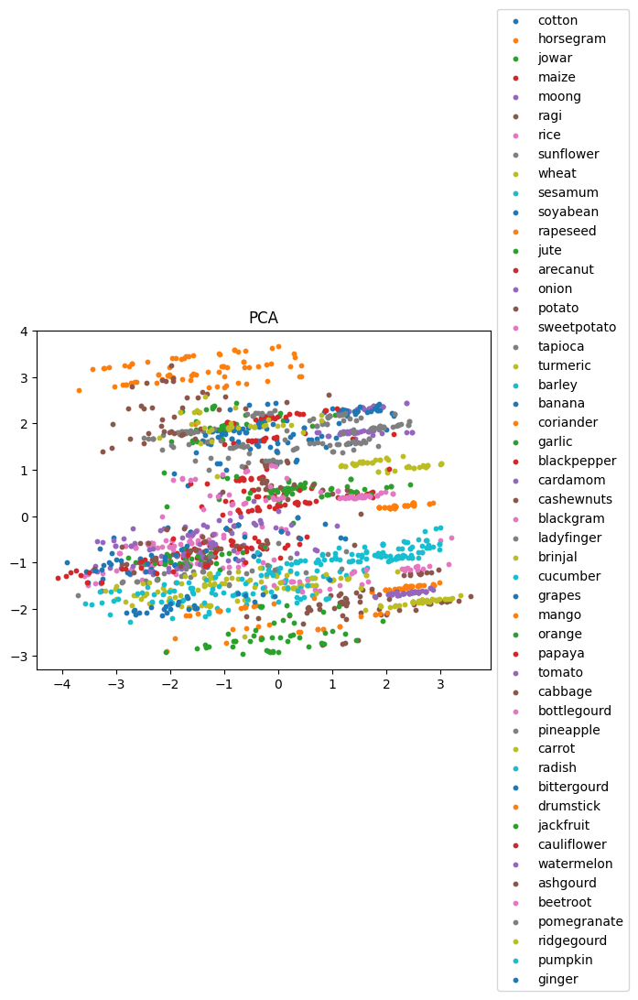

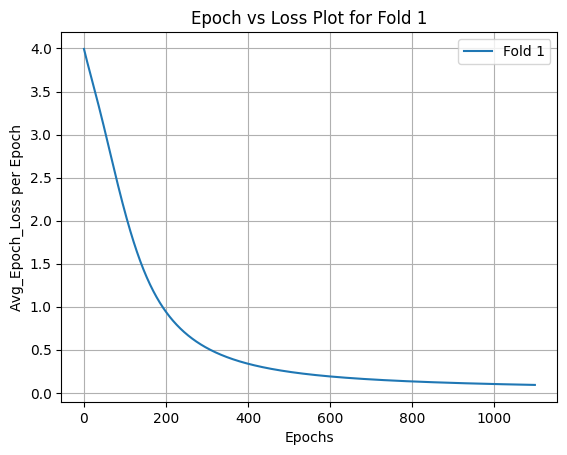

Epoch [1100/1100], Loss: 0.0914
Fold 1, Validation Loss: 0.091595858335495, Accuracy: 97.89%
Fold 2, Validation Loss: 0.08714582771062851, Accuracy: 97.84%
Fold 3, Validation Loss: 0.08880465477705002, Accuracy: 97.69%
Fold 4, Validation Loss: 0.0883171334862709, Accuracy: 97.64%
Fold 5, Validation Loss: 0.09003610908985138, Accuracy: 97.63%


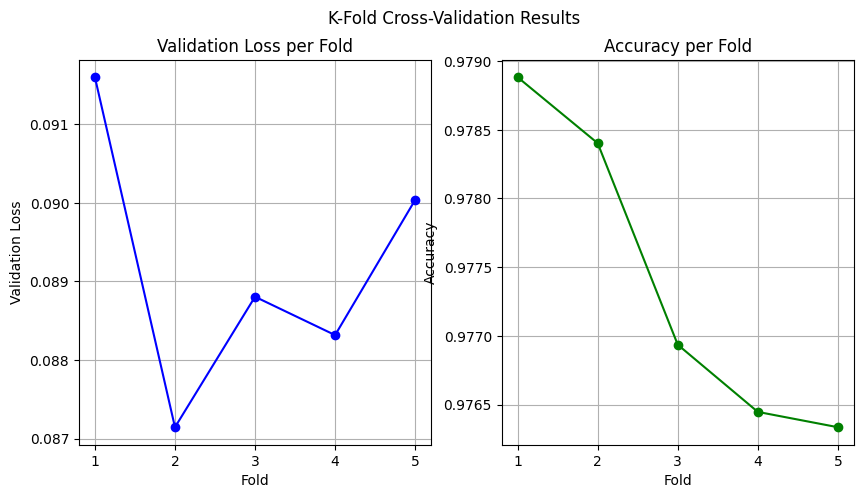

Average Validation Loss: 0.0892, Average Accuracy: 97.74%
Random UnderSampler


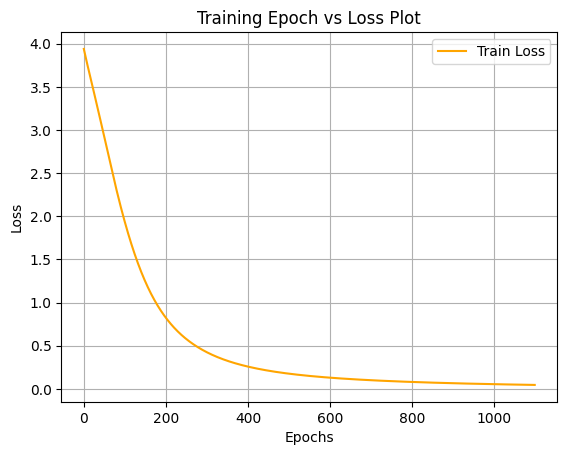

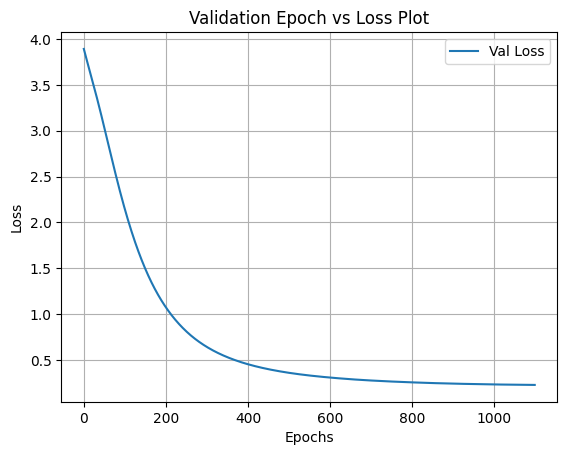

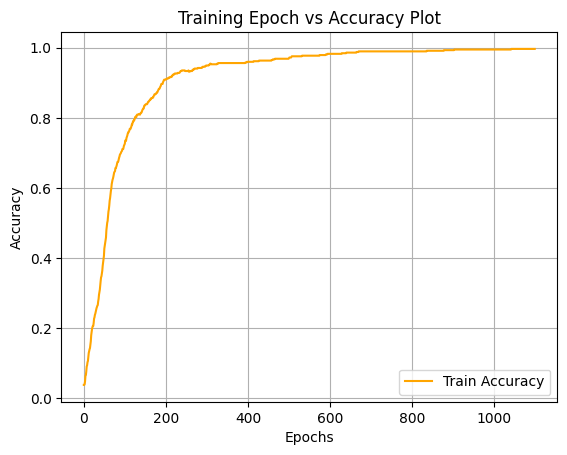

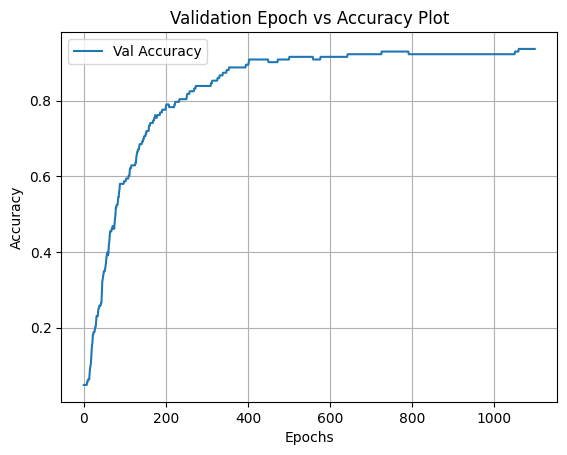

Test Accuracy: 93.71%


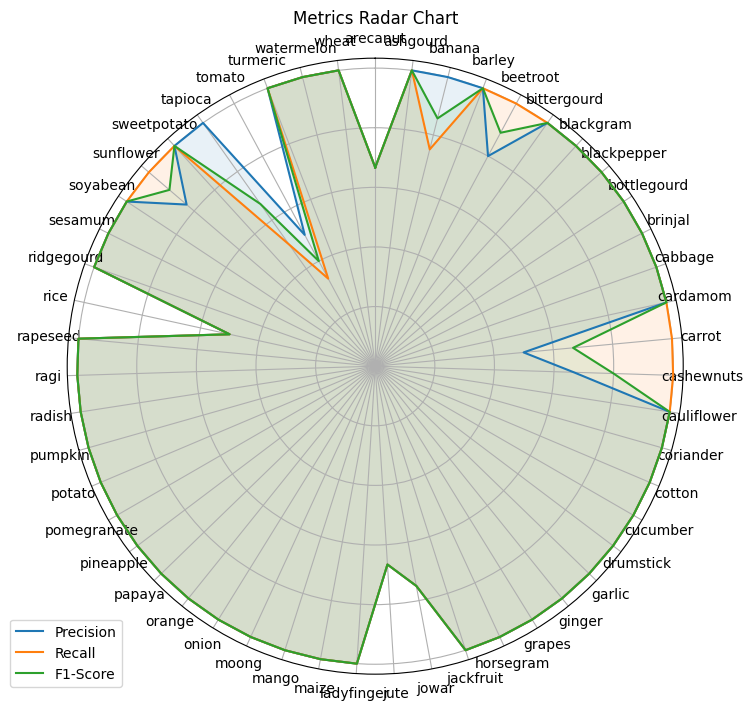

c:\Users\shyam\OneDrive\Desktop\DL_prac\PyTorch_Tut\.myenv\lib\site-packages\sklearn\metrics\_ranking.py:993: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(


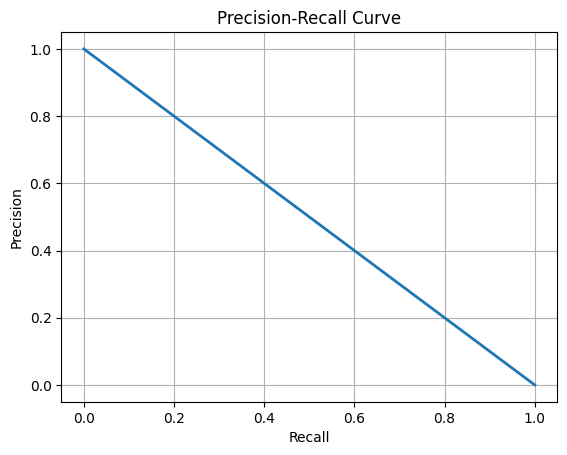

c:\Users\shyam\OneDrive\Desktop\DL_prac\PyTorch_Tut\.myenv\lib\site-packages\sklearn\metrics\_ranking.py:1146: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  warnings.warn(
c:\Users\shyam\OneDrive\Desktop\DL_prac\PyTorch_Tut\.myenv\lib\site-packages\sklearn\metrics\_ranking.py:1146: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  warnings.warn(
c:\Users\shyam\OneDrive\Desktop\DL_prac\PyTorch_Tut\.myenv\lib\site-packages\sklearn\metrics\_ranking.py:1146: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  warnings.warn(


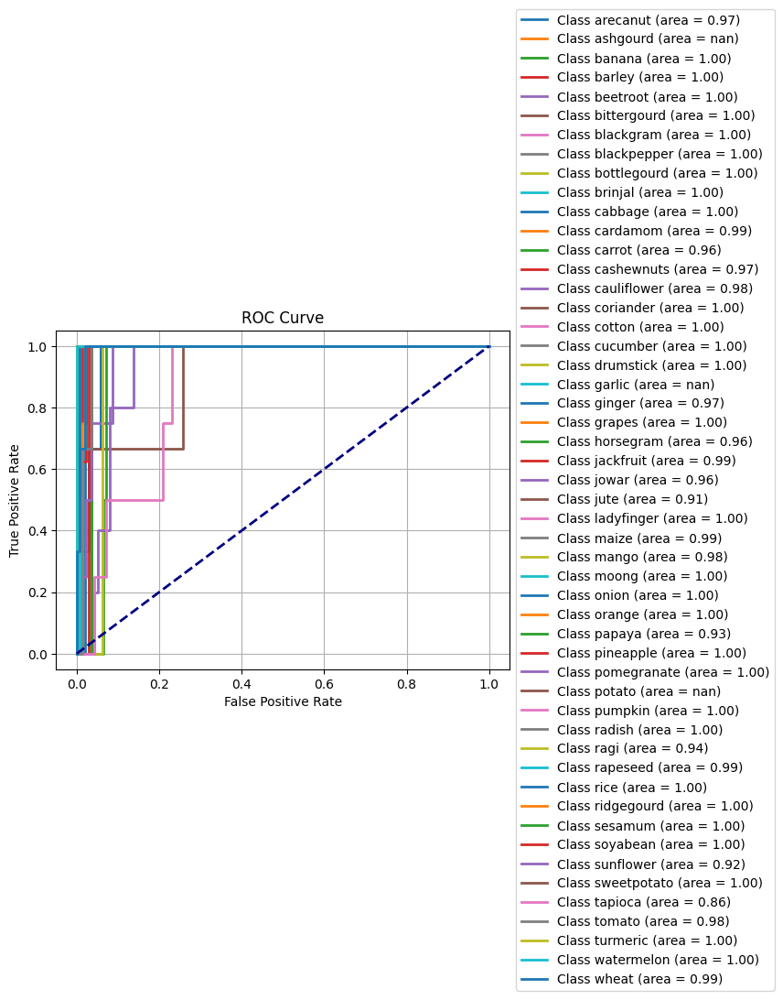

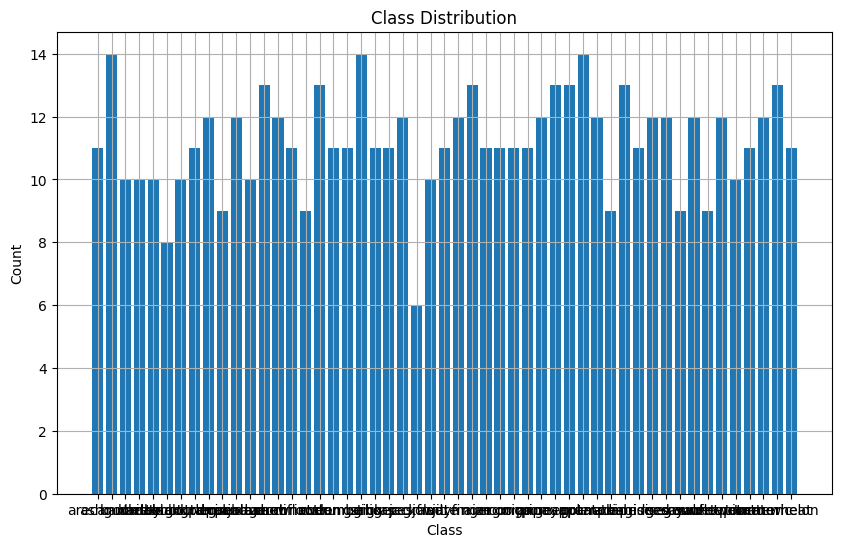

C:\Users\shyam\AppData\Local\Temp\ipykernel_18268\3034830407.py:341: RuntimeWarning: divide by zero encountered in double_scalars
  lift.append(gain / threshold)


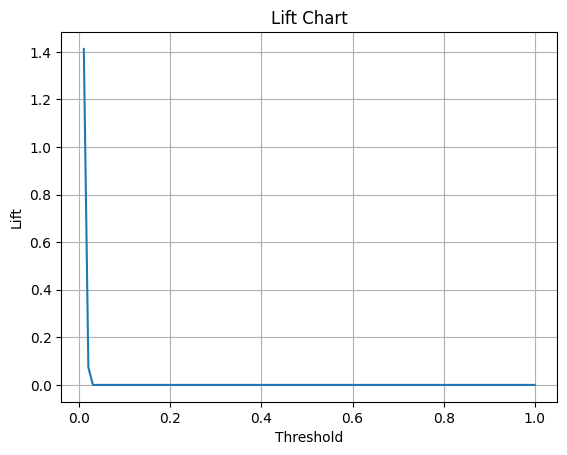

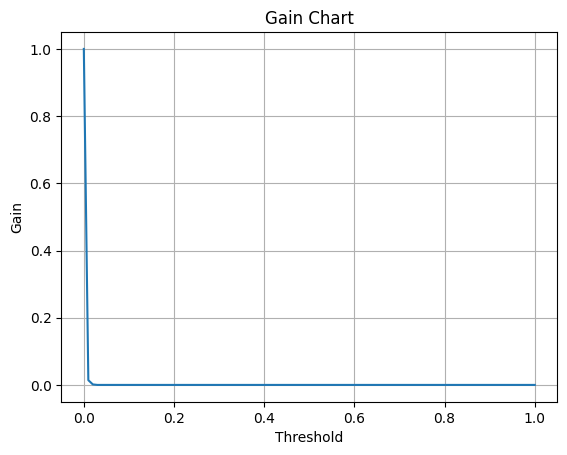

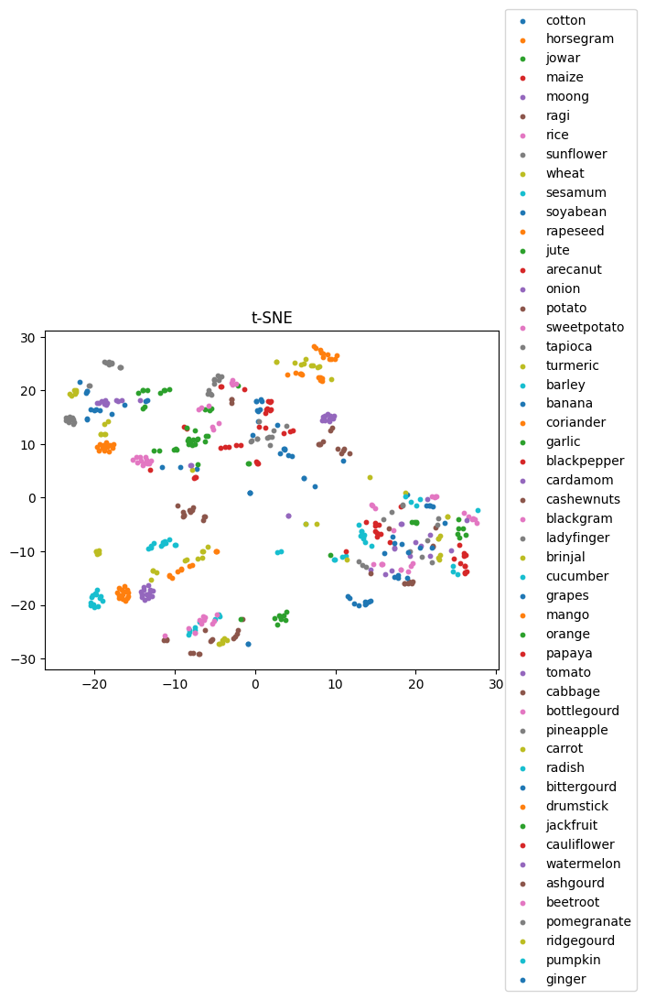

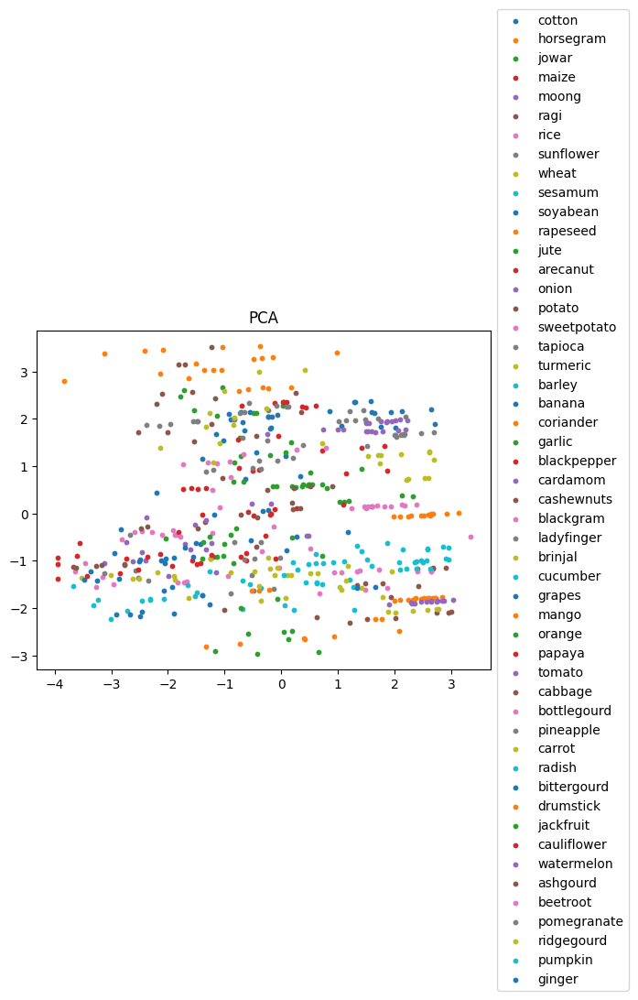

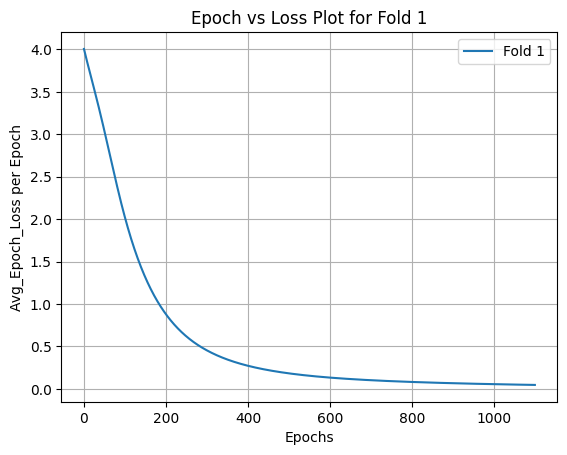

Epoch [1100/1100], Loss: 0.0471
Fold 1, Validation Loss: 0.21330738067626953, Accuracy: 92.31%
Fold 2, Validation Loss: 0.25430309772491455, Accuracy: 93.01%
Fold 3, Validation Loss: 0.25707584619522095, Accuracy: 93.71%
Fold 4, Validation Loss: 0.23750756680965424, Accuracy: 91.61%
Fold 5, Validation Loss: 0.4431614875793457, Accuracy: 90.14%


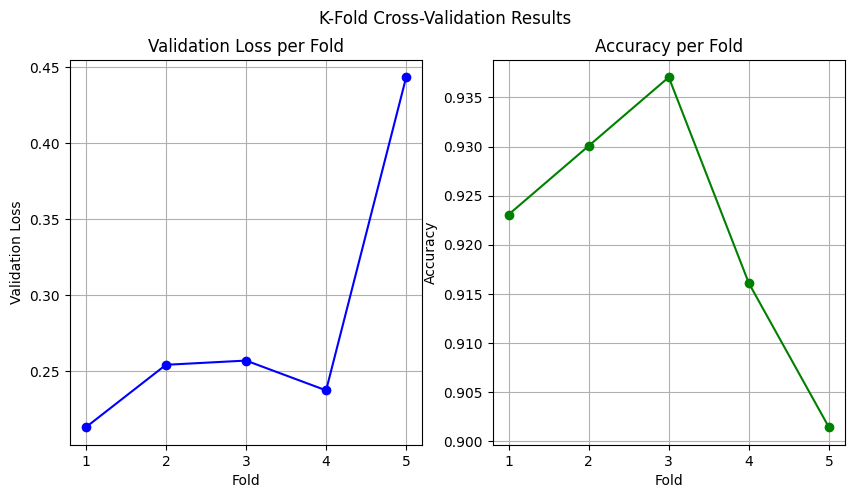

Average Validation Loss: 0.2811, Average Accuracy: 92.15%
SMOTE


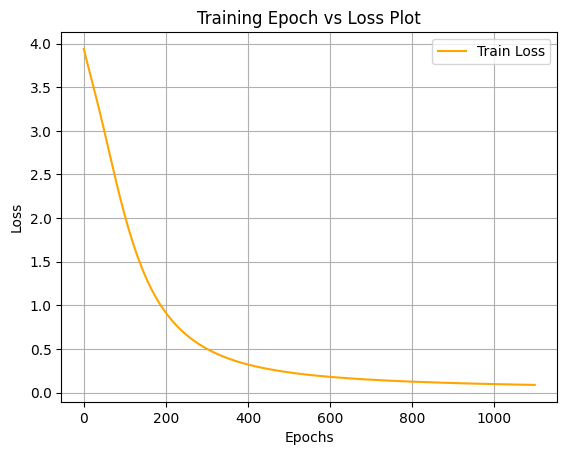

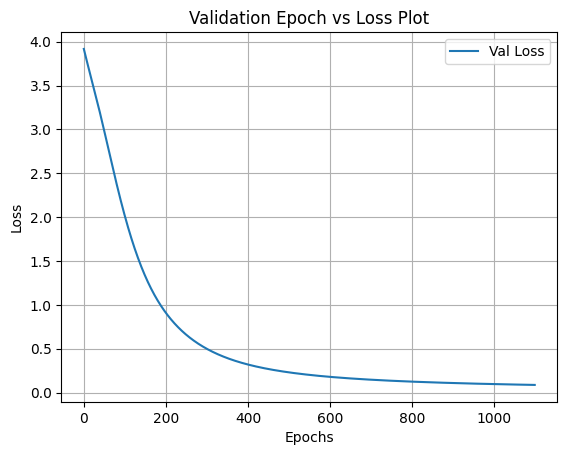

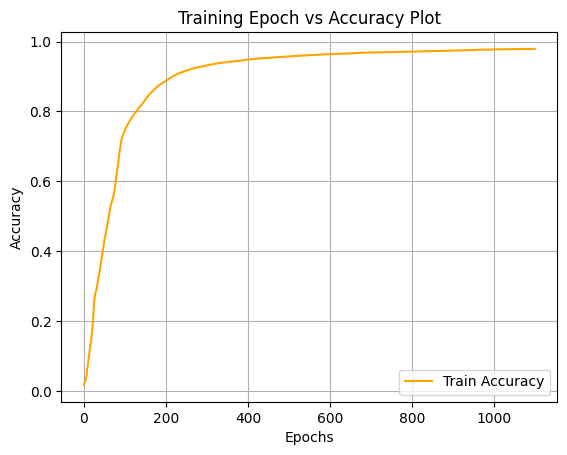

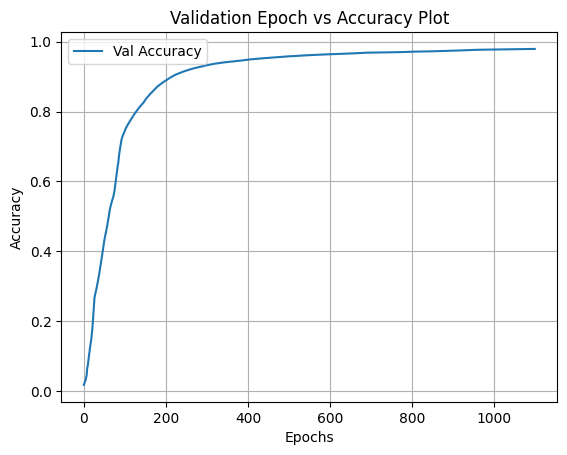

Test Accuracy: 97.92%


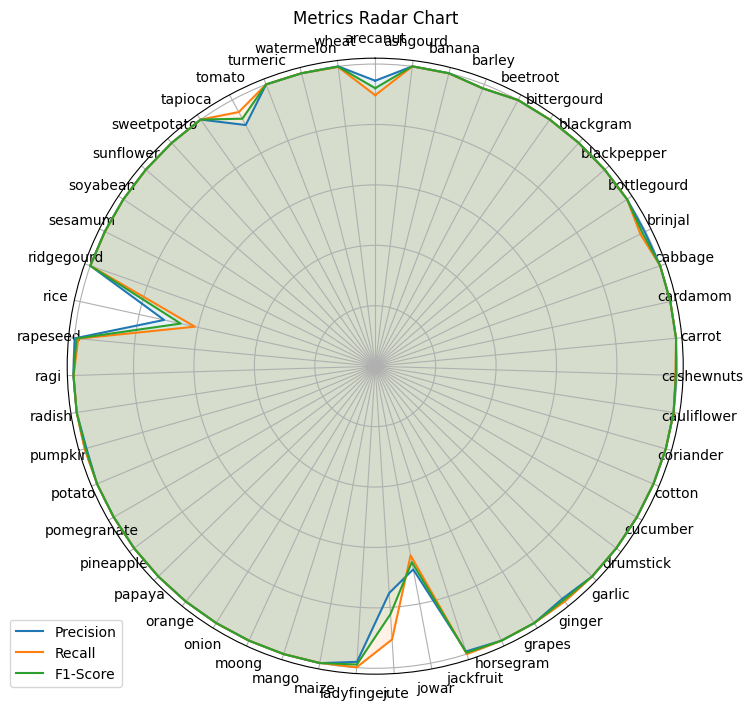

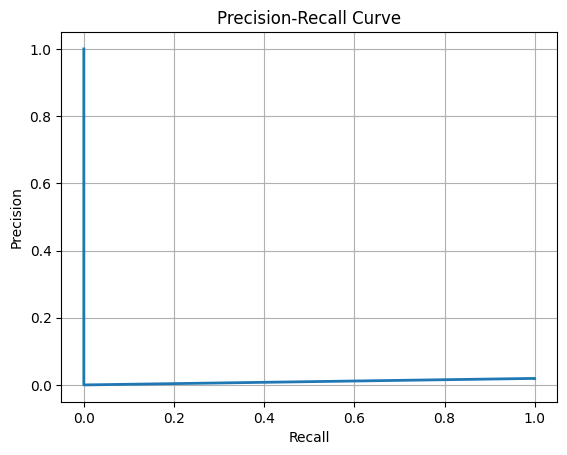

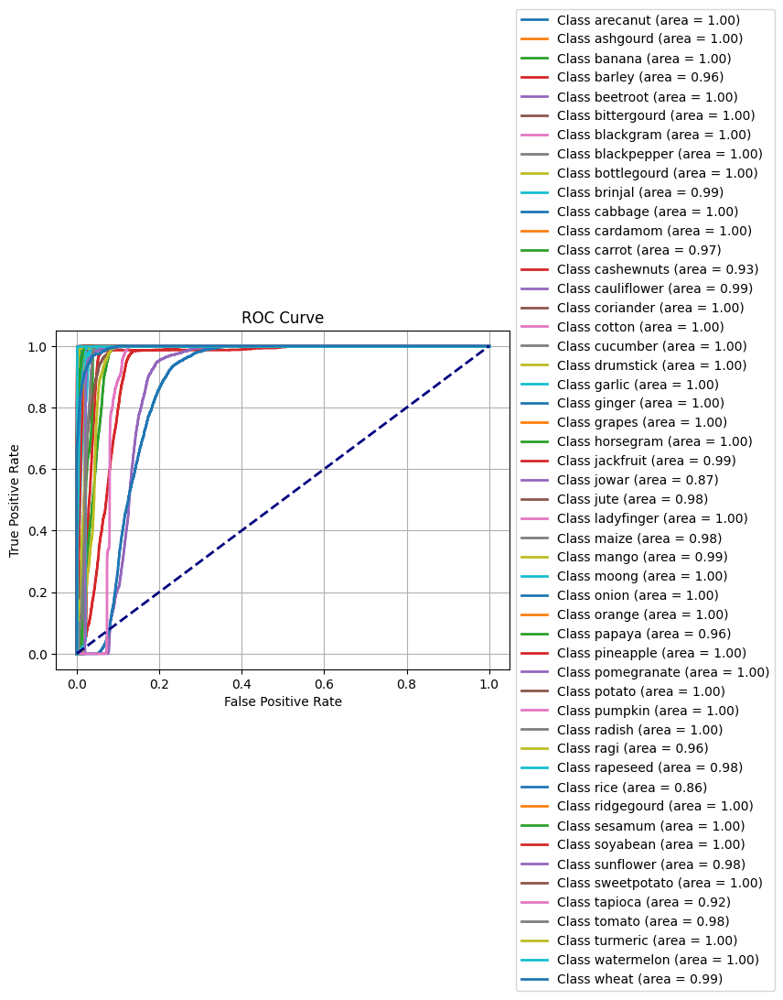

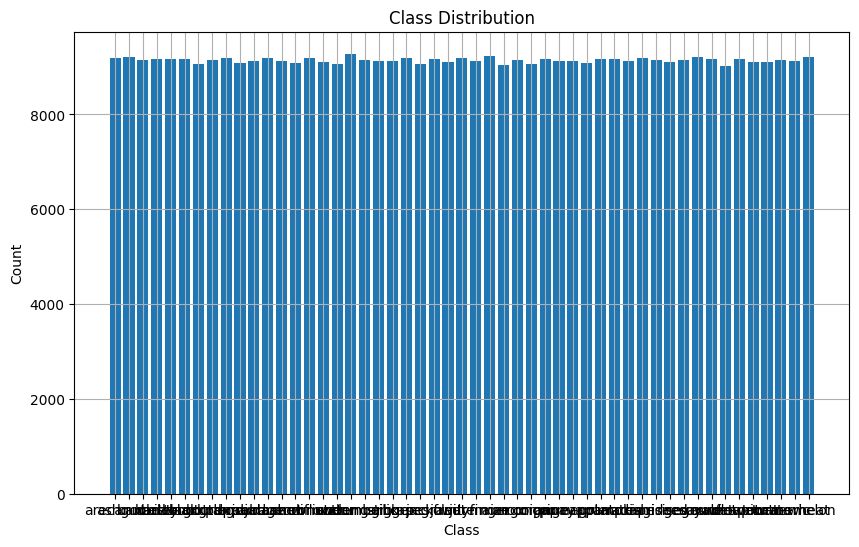

C:\Users\shyam\AppData\Local\Temp\ipykernel_18268\3034830407.py:341: RuntimeWarning: divide by zero encountered in double_scalars
  lift.append(gain / threshold)


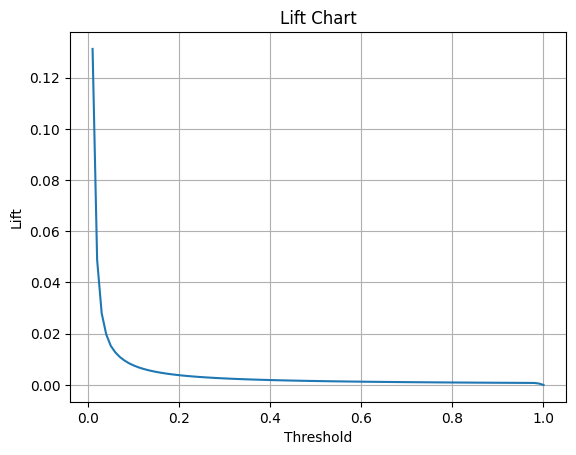

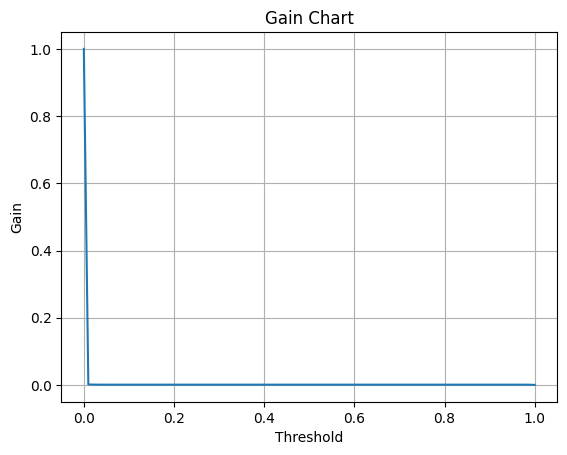

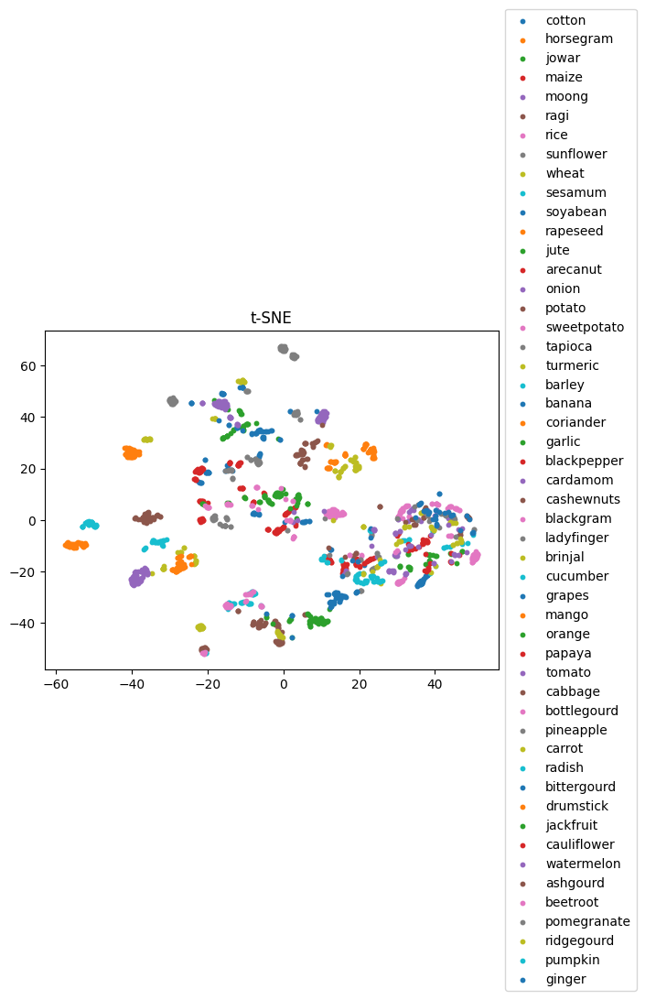

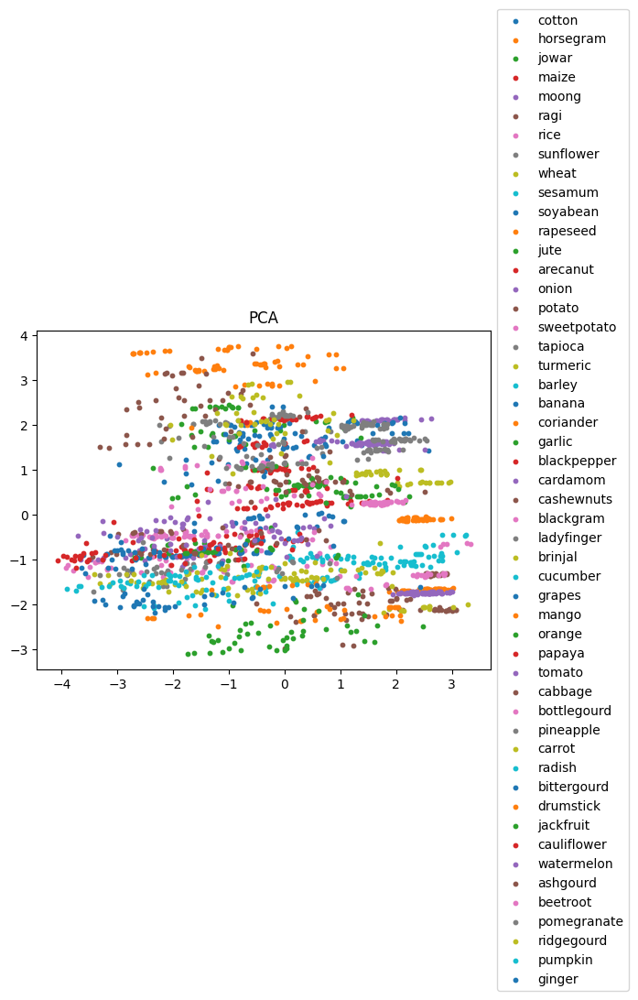

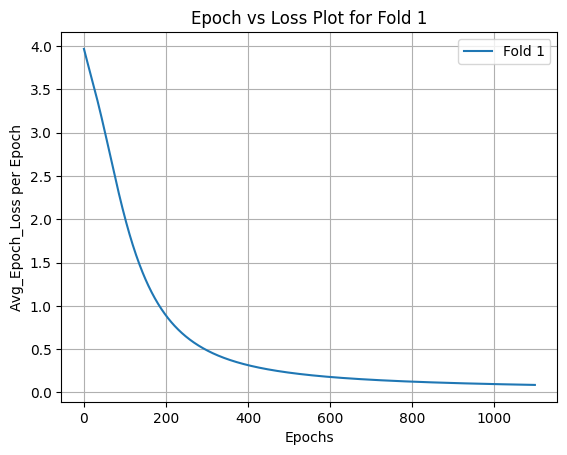

Epoch [1100/1100], Loss: 0.0874
Fold 1, Validation Loss: 0.08689898997545242, Accuracy: 97.79%
Fold 2, Validation Loss: 0.08717942982912064, Accuracy: 97.84%
Fold 3, Validation Loss: 0.08658064901828766, Accuracy: 97.84%
Fold 4, Validation Loss: 0.08701048791408539, Accuracy: 97.86%
Fold 5, Validation Loss: 0.09201331436634064, Accuracy: 97.52%


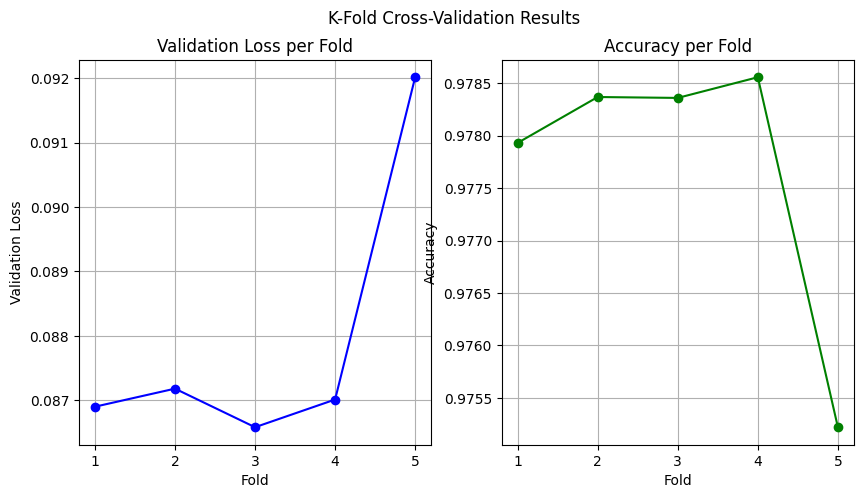

Average Validation Loss: 0.0879, Average Accuracy: 97.77%
SMOTE + Tomek


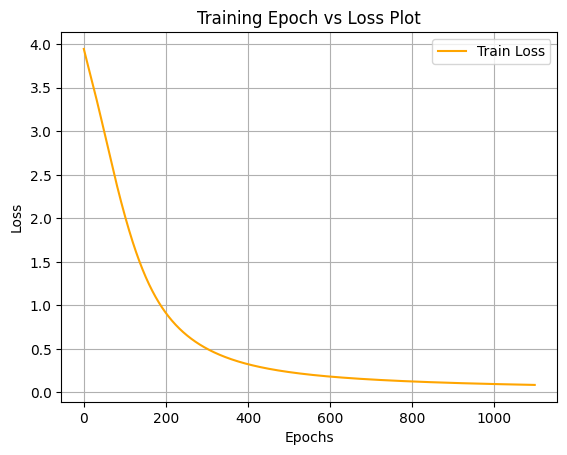

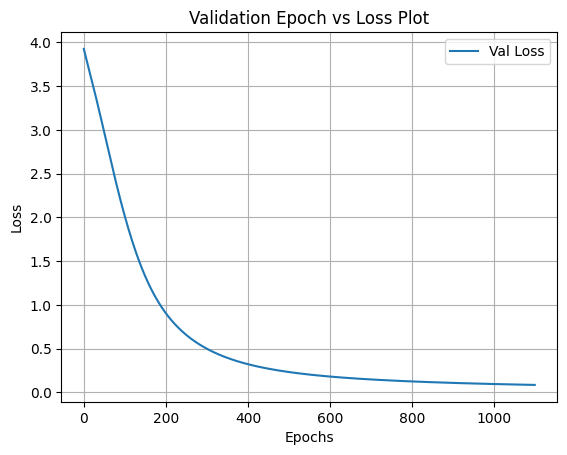

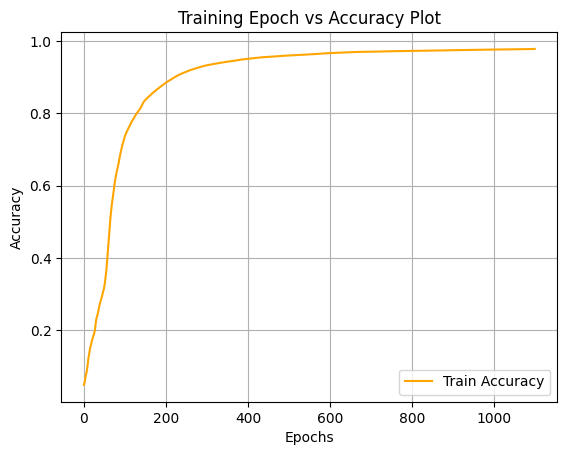

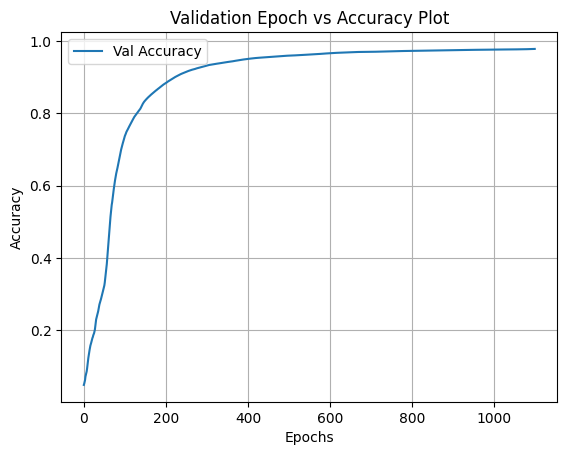

Test Accuracy: 97.79%


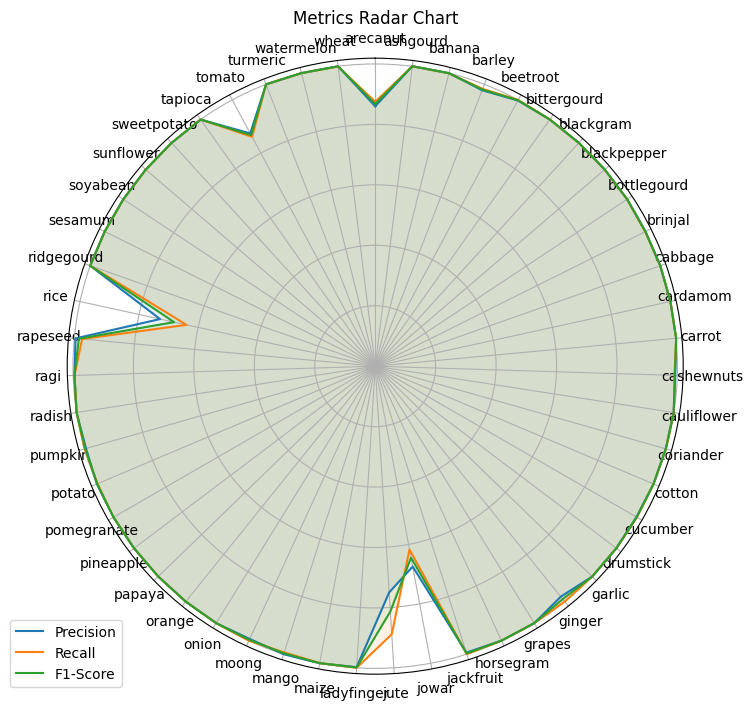

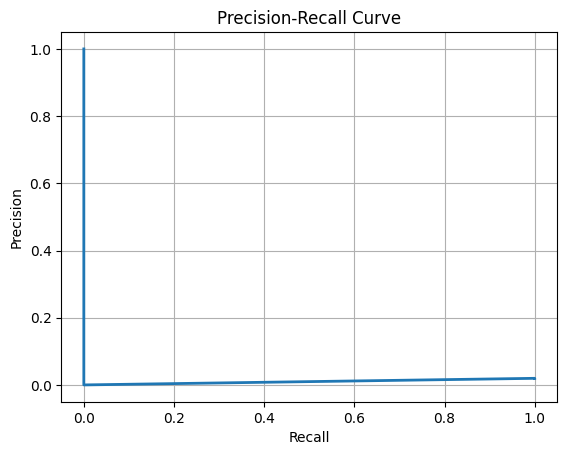

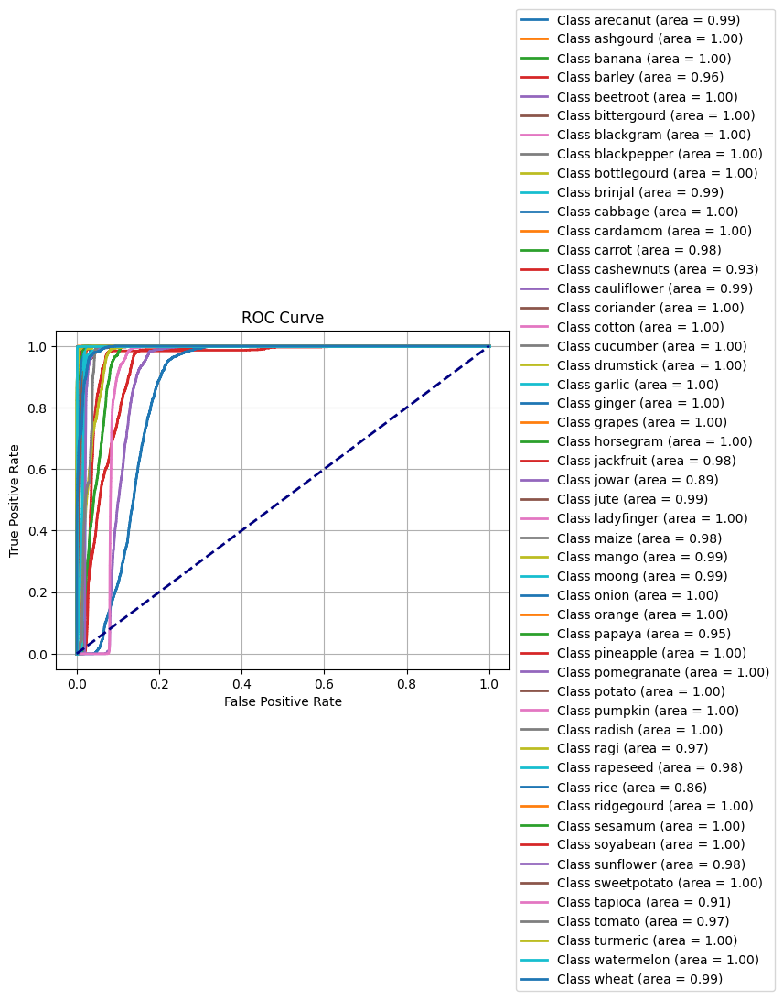

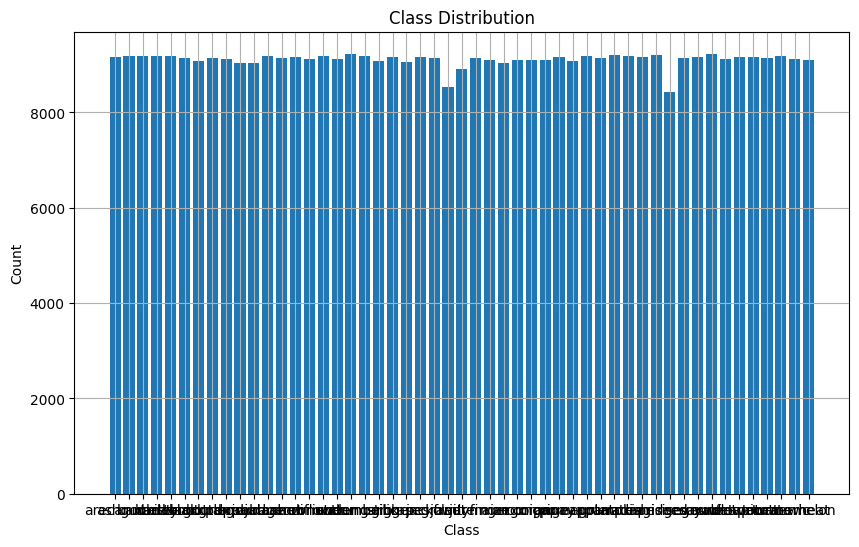

C:\Users\shyam\AppData\Local\Temp\ipykernel_18268\3034830407.py:341: RuntimeWarning: divide by zero encountered in double_scalars
  lift.append(gain / threshold)


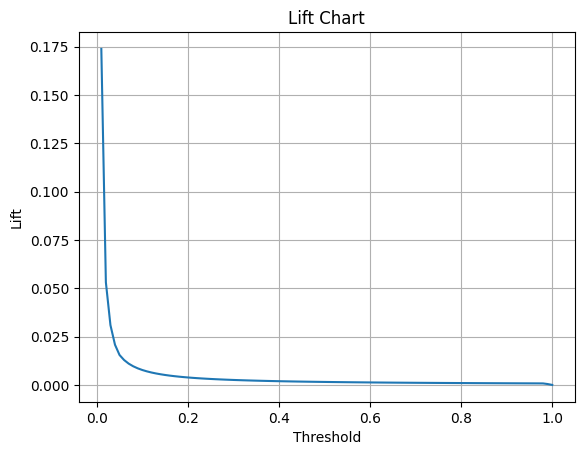

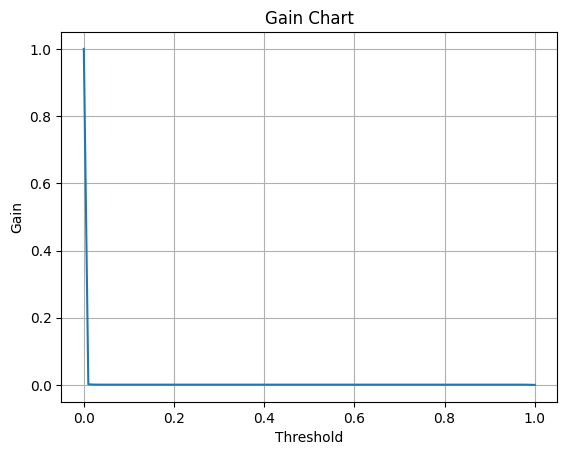

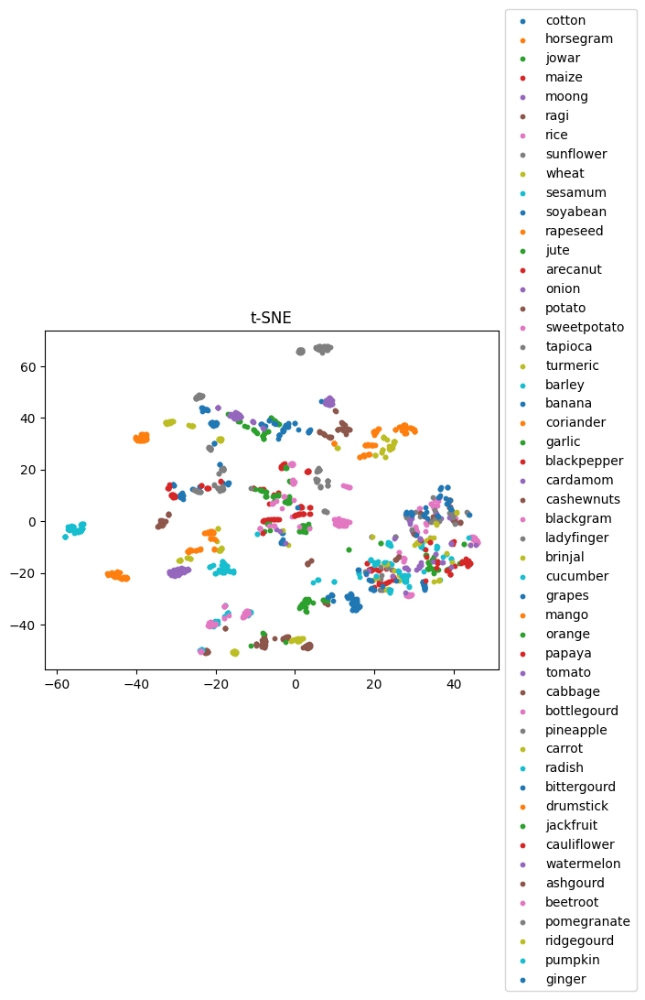

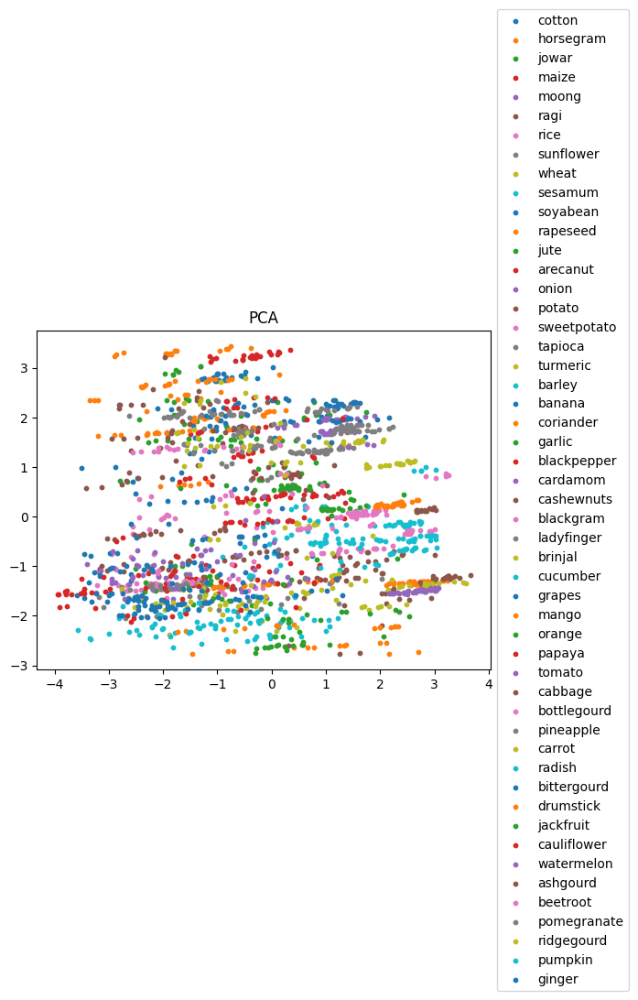

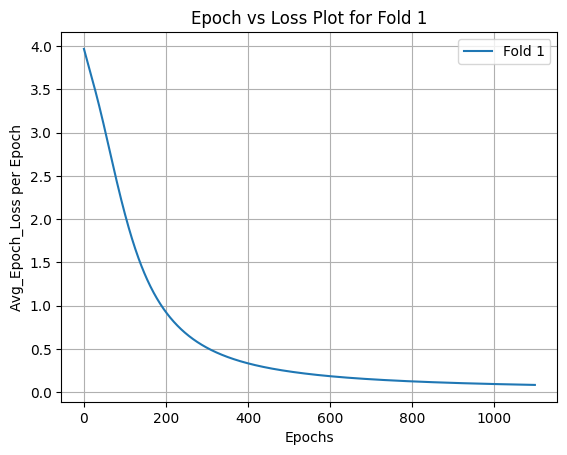

Epoch [1100/1100], Loss: 0.0834
Fold 1, Validation Loss: 0.08400531858205795, Accuracy: 98.26%
Fold 2, Validation Loss: 0.0802098959684372, Accuracy: 98.28%
Fold 3, Validation Loss: 0.0824003666639328, Accuracy: 98.09%
Fold 4, Validation Loss: 0.08612746000289917, Accuracy: 98.07%
Fold 5, Validation Loss: 0.08520198613405228, Accuracy: 97.89%


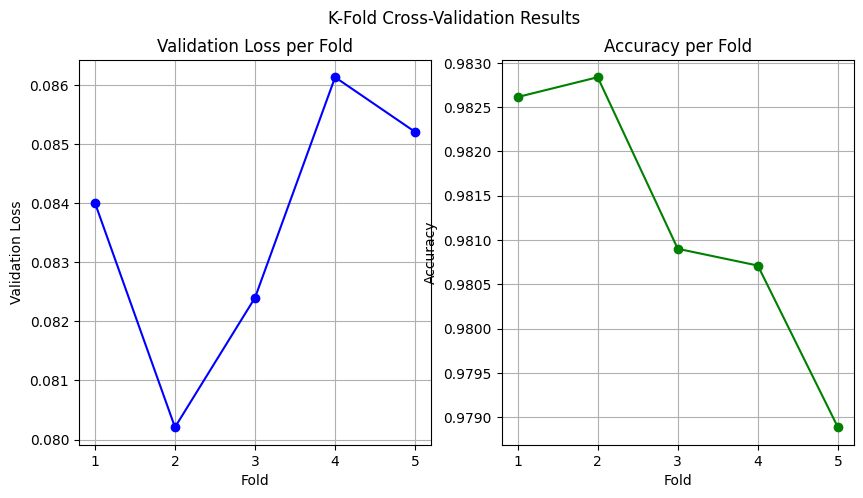

Average Validation Loss: 0.0836, Average Accuracy: 98.12%
SMOTEENN


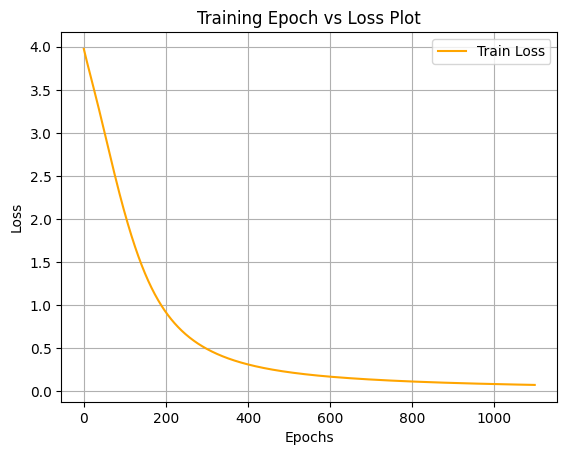

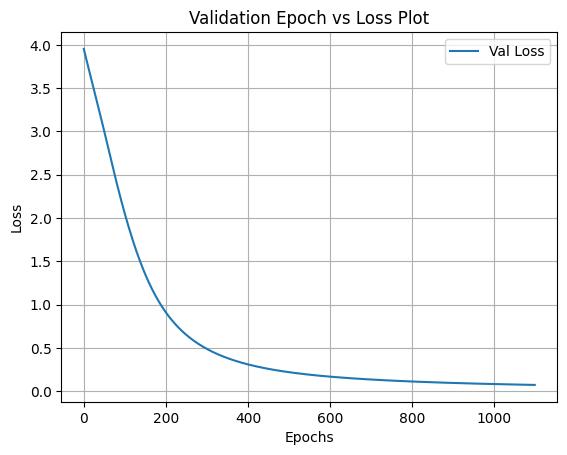

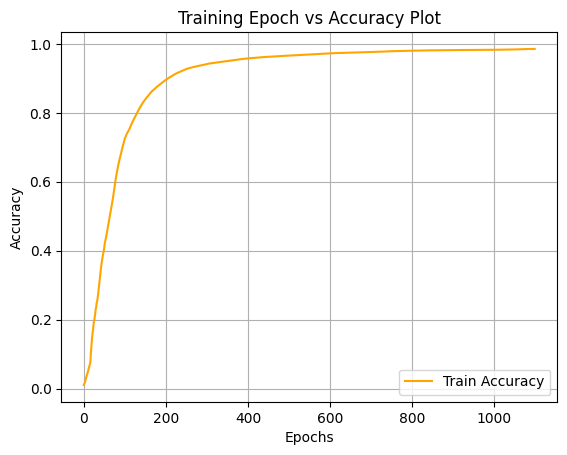

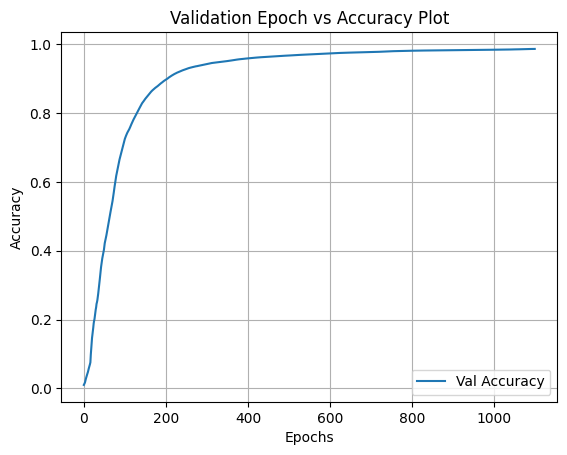

Test Accuracy: 98.58%


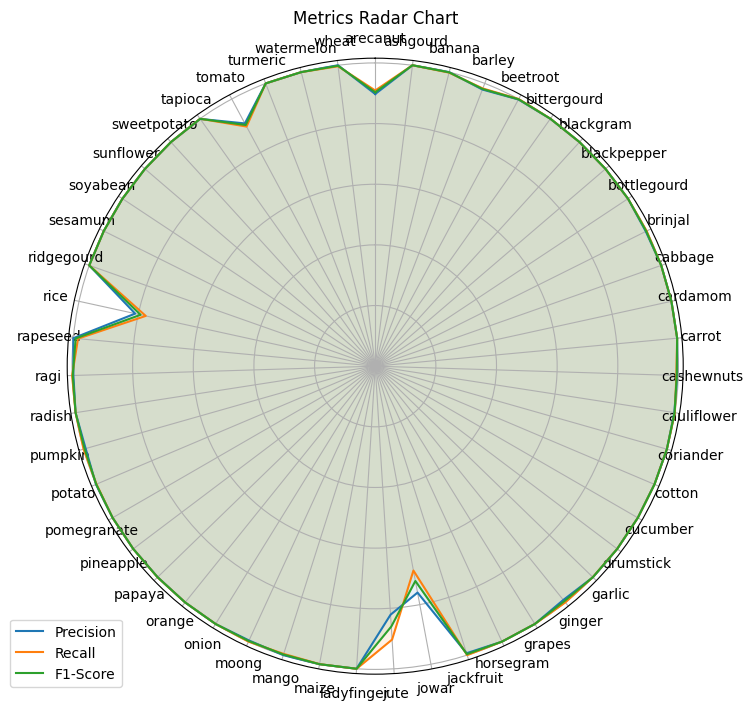

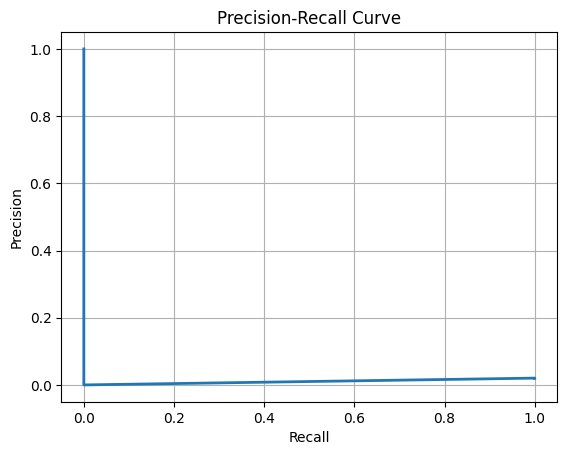

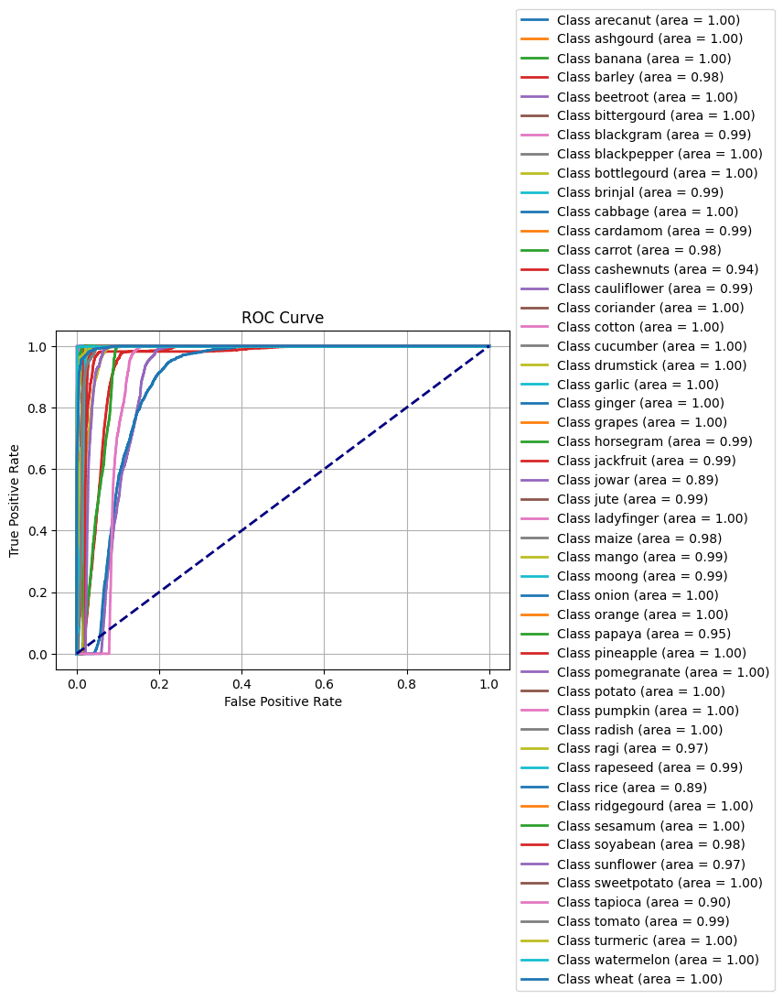

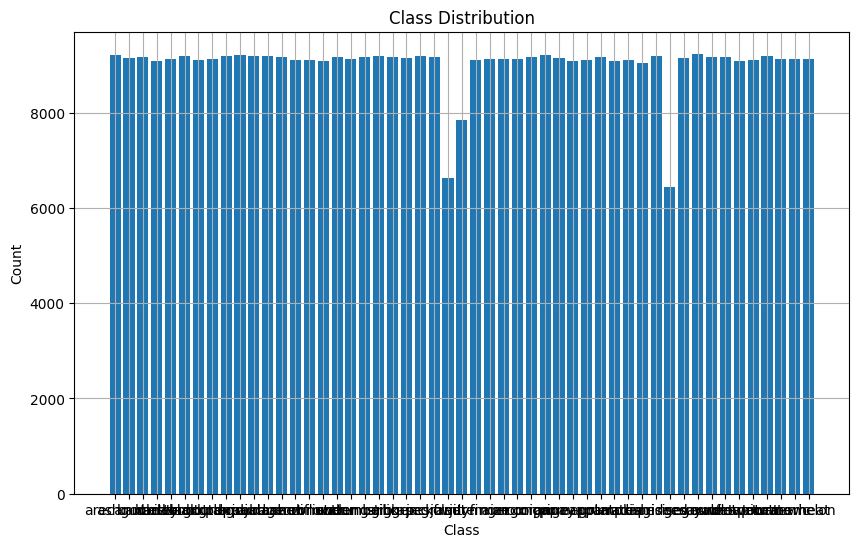

C:\Users\shyam\AppData\Local\Temp\ipykernel_18268\3034830407.py:341: RuntimeWarning: divide by zero encountered in double_scalars
  lift.append(gain / threshold)


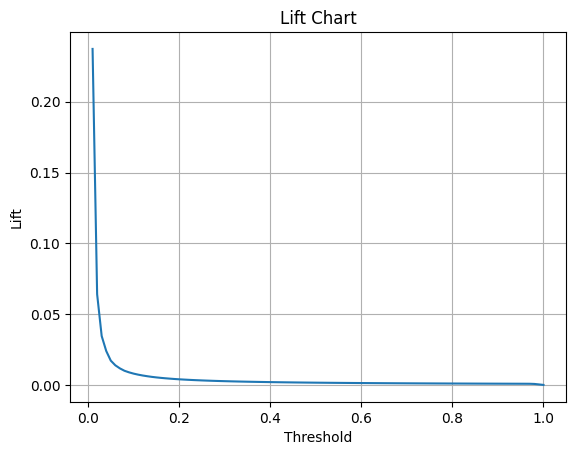

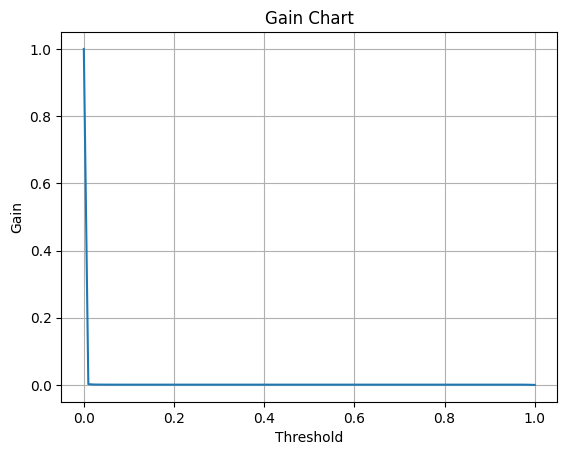

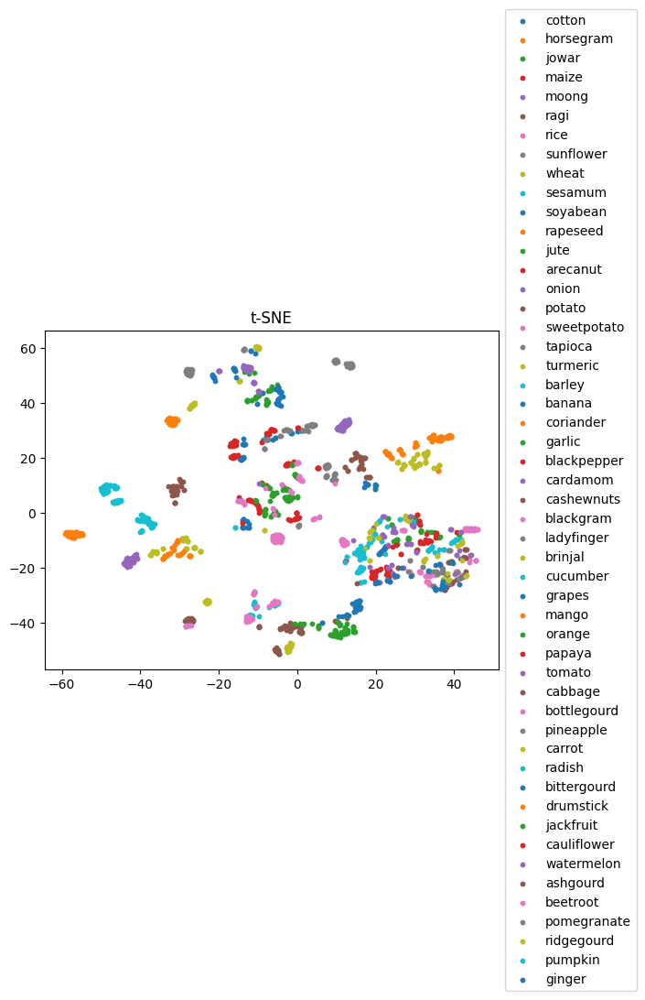

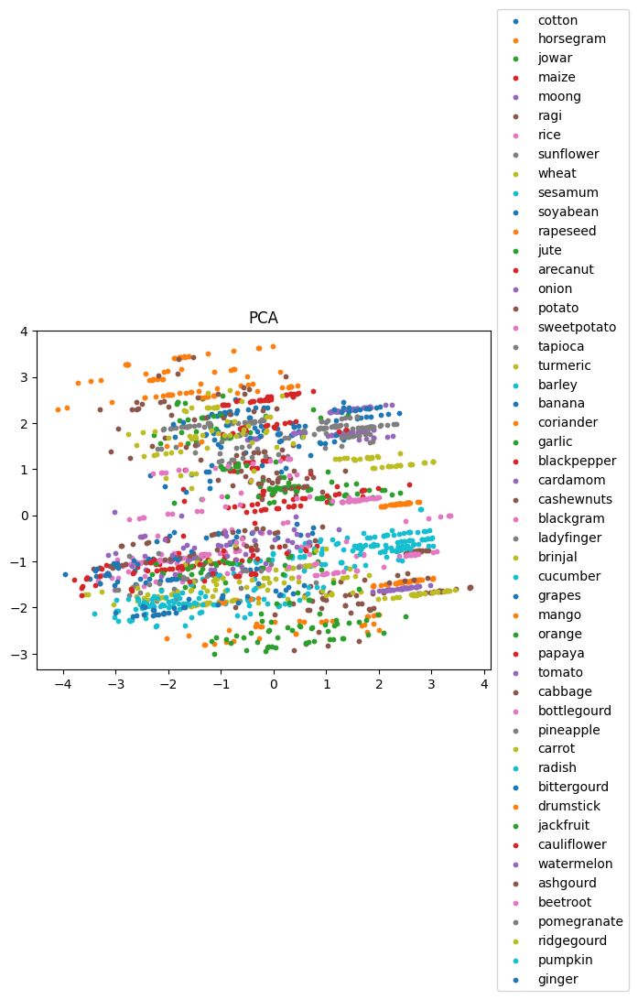

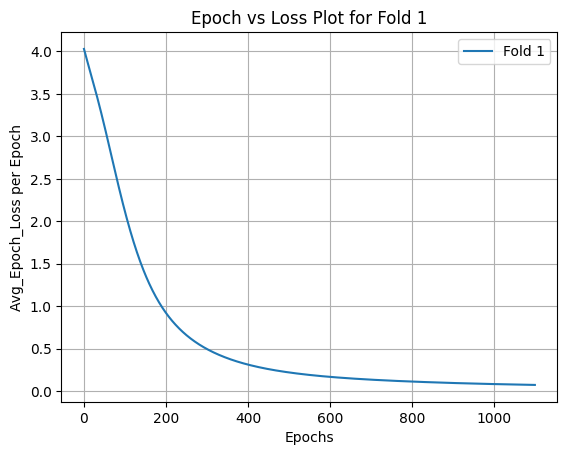

Epoch [1100/1100], Loss: 0.0726
Fold 1, Validation Loss: 0.07224257290363312, Accuracy: 98.45%
Fold 2, Validation Loss: 0.07606187462806702, Accuracy: 98.60%
Fold 3, Validation Loss: 0.07424820959568024, Accuracy: 98.33%
Fold 4, Validation Loss: 0.07429690659046173, Accuracy: 98.56%
Fold 5, Validation Loss: 0.07426762580871582, Accuracy: 98.58%


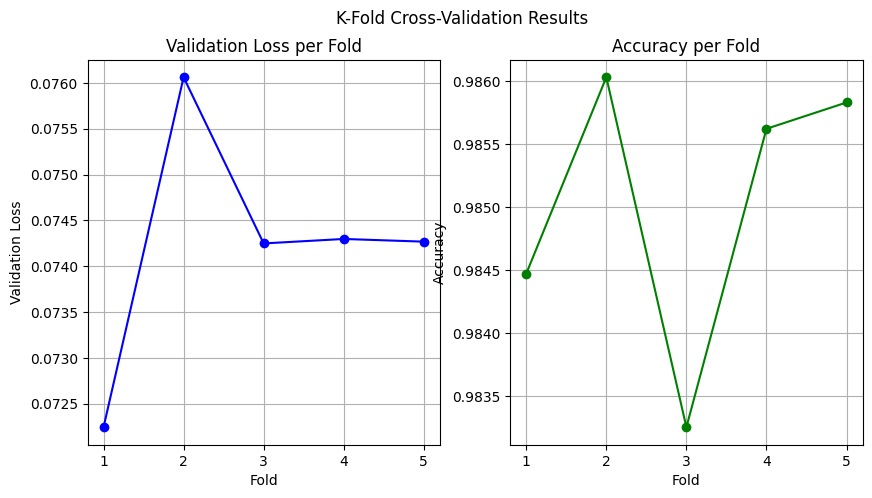

Average Validation Loss: 0.0742, Average Accuracy: 98.50%


In [119]:
from imblearn.under_sampling import RandomUnderSampler
from imblearn.combine import SMOTETomek,SMOTEENN

features = data.drop(columns=['Crop']).values
target = data['Crop'].values


features = torch.tensor(features, dtype=torch.float32).float().to("cuda")
target = torch.tensor(target, dtype=torch.long).long().to("cuda")

train_features, test_features, train_target, test_target = train_test_split(features, target, test_size=0.2, random_state=42)
model,criterion = train_validation(train_features, test_features, train_target, test_target)
cross_check(features,target)


features = data.drop(columns=['Crop']).values
target = data['Crop'].values

print("Random OverSampler")
ROSample = RandomOverSampler(sampling_strategy="all")
features,target = ROSample.fit_resample(features,target)


features = torch.tensor(features, dtype=torch.float32).float().to("cuda")
target = torch.tensor(target, dtype=torch.long).long().to("cuda")

train_features, test_features, train_target, test_target = train_test_split(features, target, test_size=0.2, random_state=42)
model,criterion = train_validation(train_features, test_features, train_target, test_target)
cross_check(features,target)




features = data.drop(columns=['Crop']).values
target = data['Crop'].values

print("Random UnderSampler")
ROSample = RandomUnderSampler(sampling_strategy="all")
features,target = ROSample.fit_resample(features,target)


features = torch.tensor(features, dtype=torch.float32).float().to("cuda")
target = torch.tensor(target, dtype=torch.long).long().to("cuda")

train_features, test_features, train_target, test_target = train_test_split(features, target, test_size=0.2, random_state=42)
model,criterion = train_validation(train_features, test_features, train_target, test_target)
cross_check(features,target)


features = data.drop(columns=['Crop']).values
target = data['Crop'].values

print("SMOTE")

ROSample = SMOTE()
features,target = ROSample.fit_resample(features,target)


features = torch.tensor(features, dtype=torch.float32).float().to("cuda")
target = torch.tensor(target, dtype=torch.long).long().to("cuda")

train_features, test_features, train_target, test_target = train_test_split(features, target, test_size=0.2, random_state=42)
model,criterion = train_validation(train_features, test_features, train_target, test_target)
cross_check(features,target)



features = data.drop(columns=['Crop']).values
target = data['Crop'].values

print("SMOTE + Tomek")

ROSample = SMOTETomek()
features,target = ROSample.fit_resample(features,target)



features = torch.tensor(features, dtype=torch.float32).float().to("cuda")
target = torch.tensor(target, dtype=torch.long).long().to("cuda")

train_features, test_features, train_target, test_target = train_test_split(features, target, test_size=0.2, random_state=42)
model,criterion = train_validation(train_features, test_features, train_target, test_target)
cross_check(features,target)


features = data.drop(columns=['Crop']).values
target = data['Crop'].values

print("SMOTEENN")

ROSample = SMOTEENN()
features,target = ROSample.fit_resample(features,target)



features = torch.tensor(features, dtype=torch.float32).float().to("cuda")
target = torch.tensor(target, dtype=torch.long).long().to("cuda")

train_features, test_features, train_target, test_target = train_test_split(features, target, test_size=0.2, random_state=42)
model,criterion = train_validation(train_features, test_features, train_target, test_target)
cross_check(features,target)


In [ ]:
class CropRecommendationModel(nn.Module):
    def __init__(self, input_size, hidden_size, num_classes):
        super(CropRecommendationModel, self).__init__()
        self.fc1 = nn.Linear(input_size, 128)
        self.relu = nn.ReLU()
        self.fc2 = nn.Linear(128,64)
        self.fc3 = nn.Linear(64,32)
        self.sigmoid = nn.Sigmoid()
        self.fc4 = nn.Linear(32, num_classes)
    
    def forward(self, x):
        x = self.relu(self.fc1(x))
        x = self.relu(self.fc2(x))
        x = self.relu(self.fc3(x))
        x = self.fc4(x)
        return x

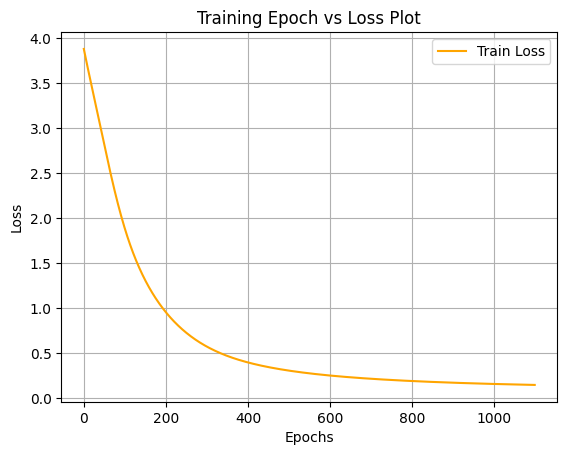

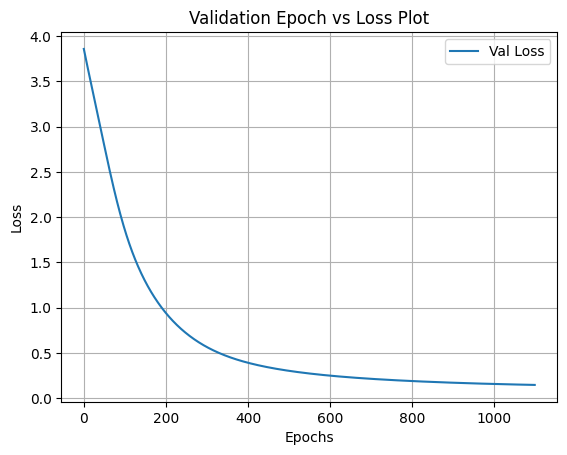

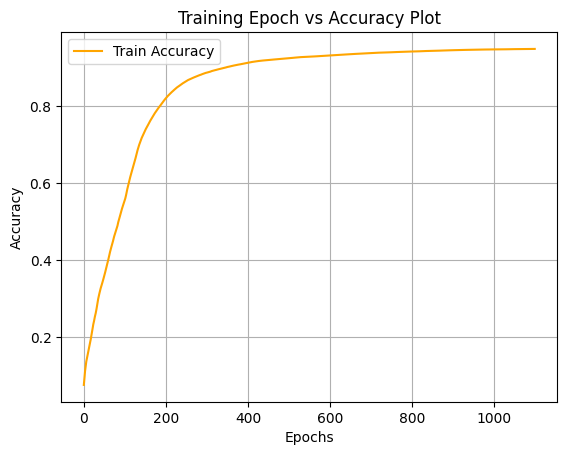

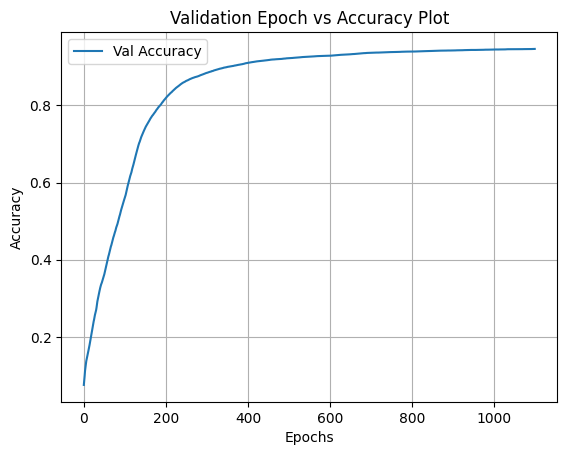

Test Accuracy: 94.66%


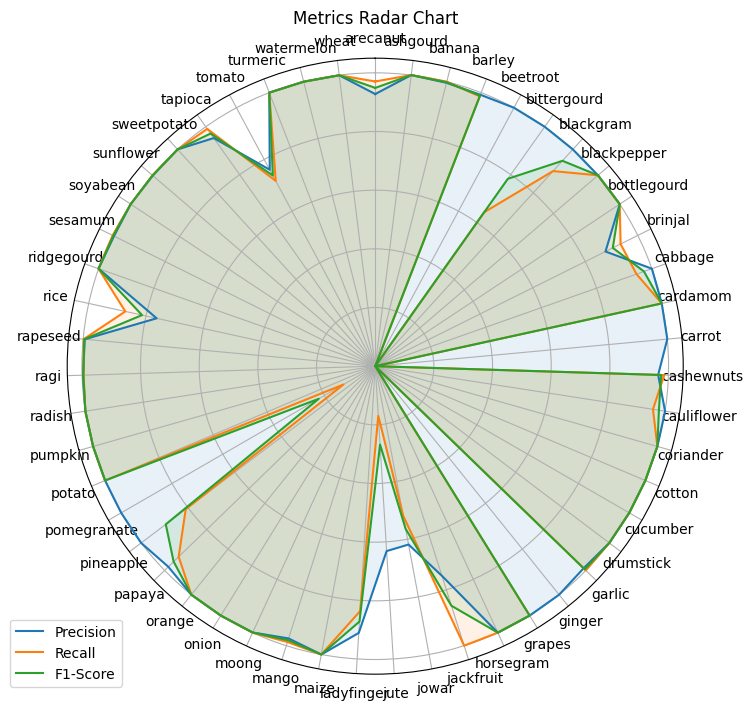

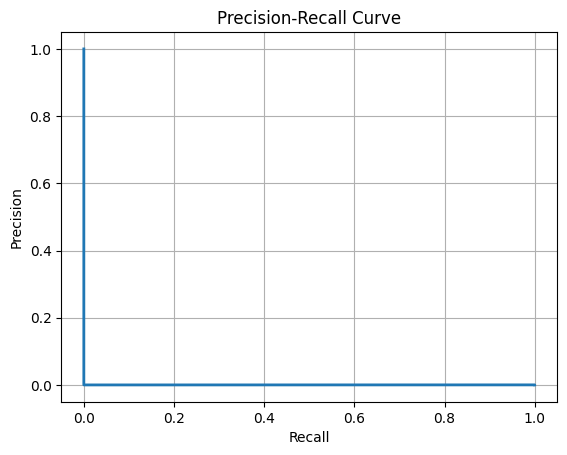

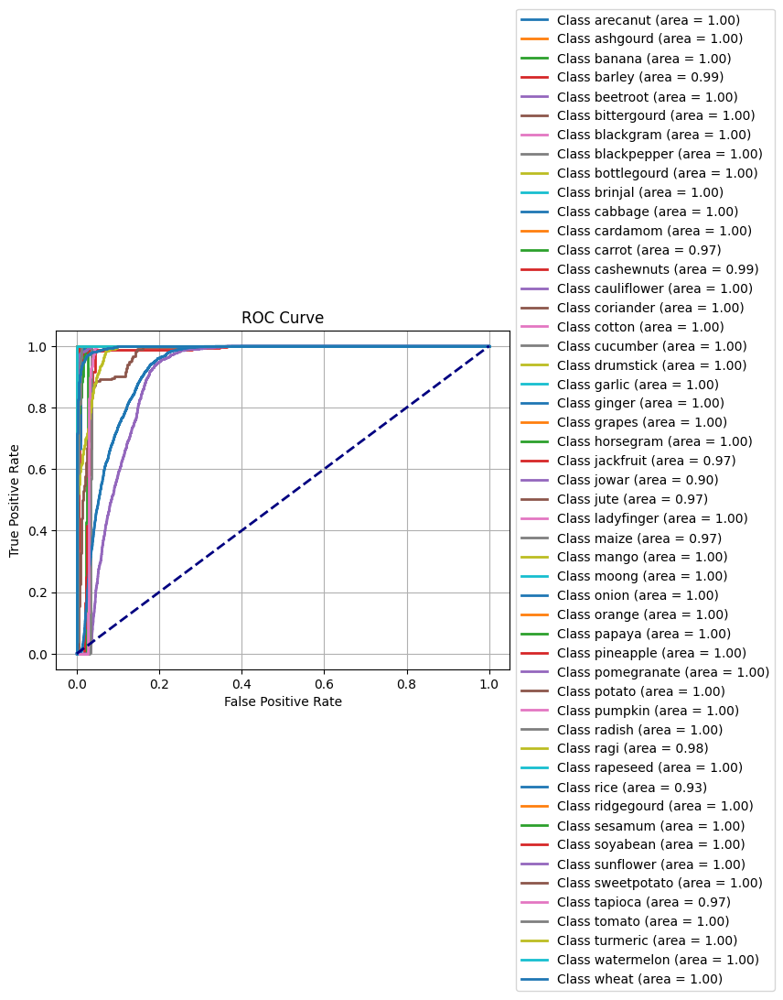

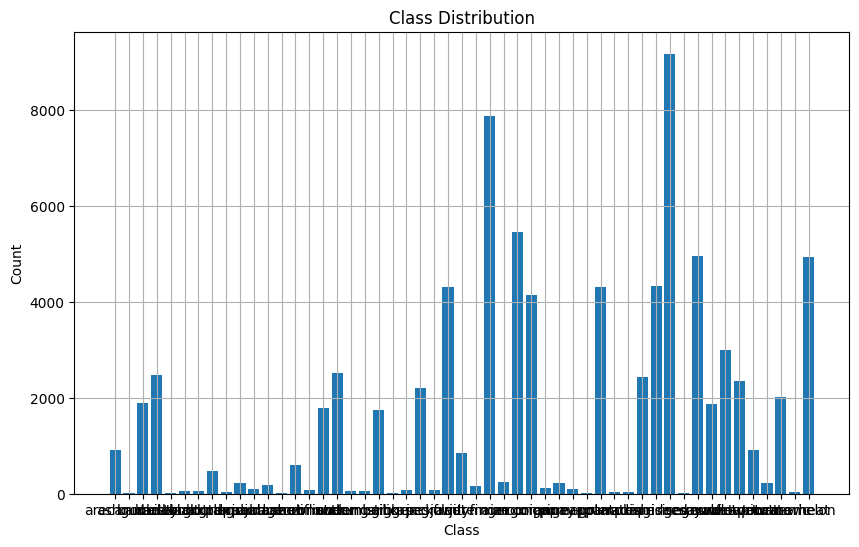

C:\Users\shyam\AppData\Local\Temp\ipykernel_18268\3034830407.py:341: RuntimeWarning: divide by zero encountered in double_scalars
  lift.append(gain / threshold)


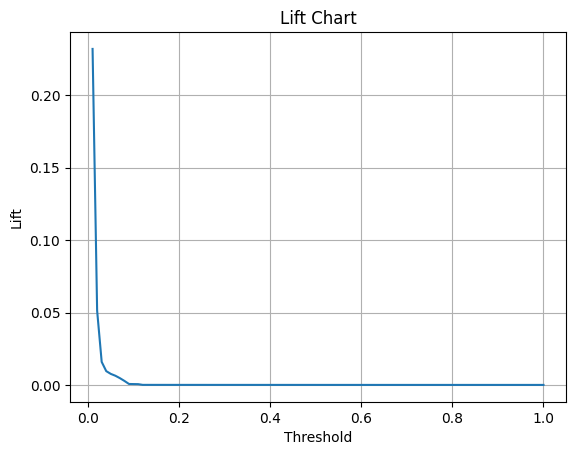

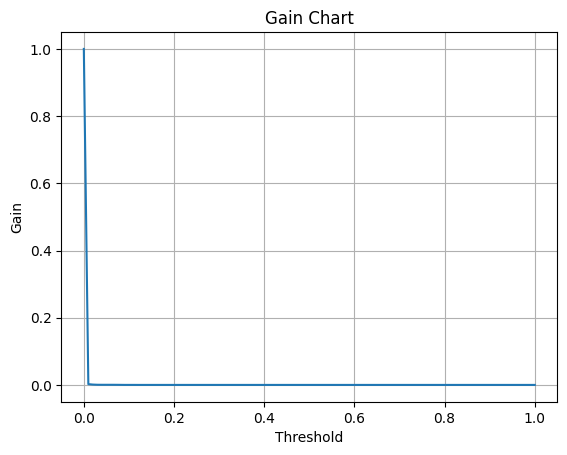

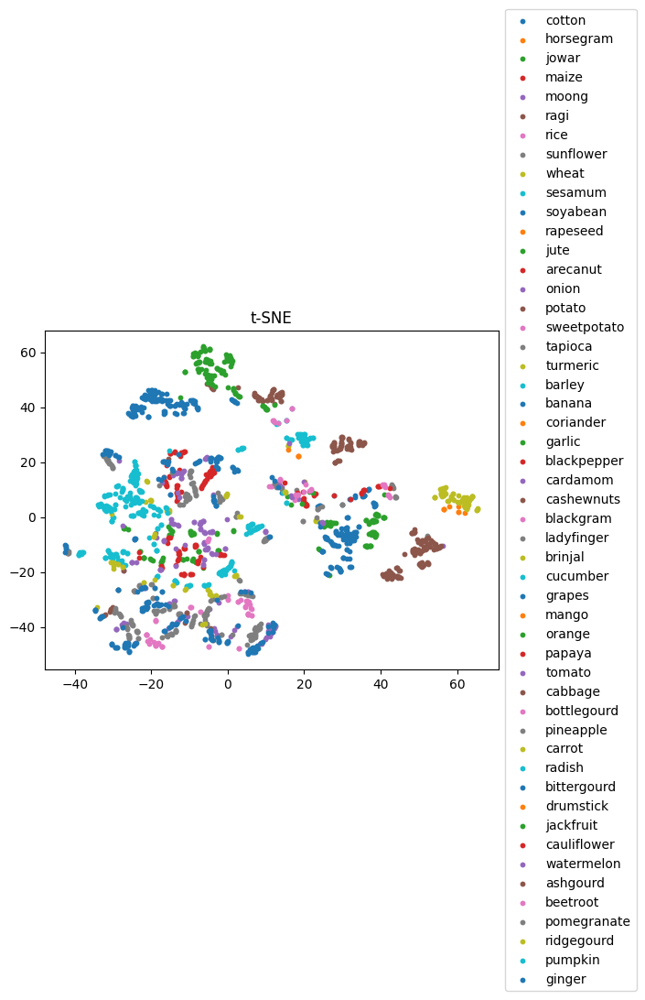

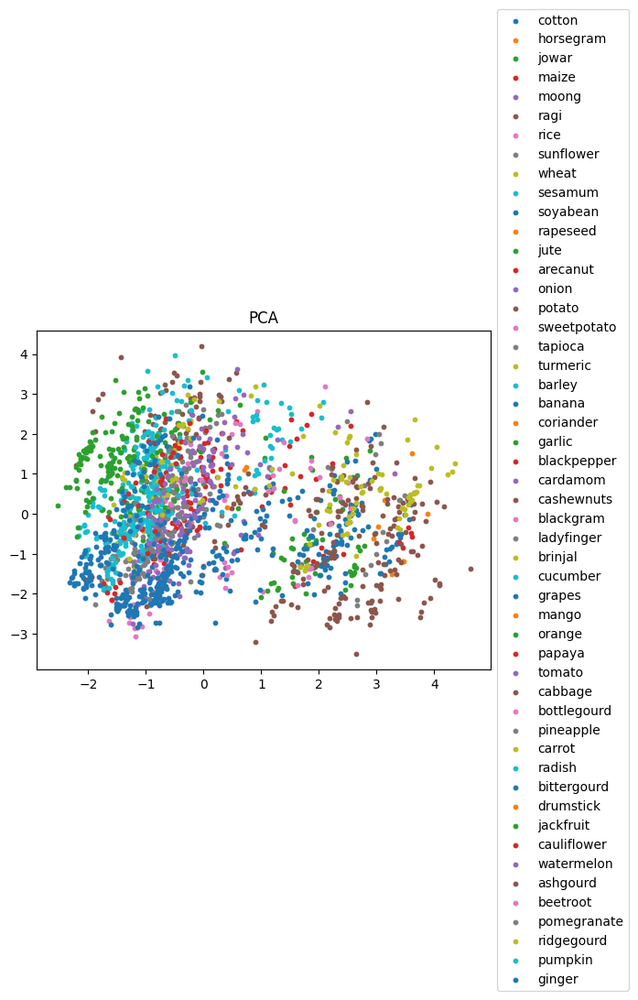

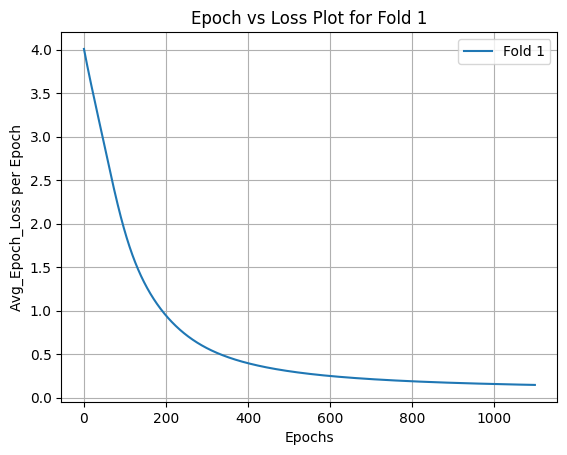

Epoch [1100/1100], Loss: 0.1449
Fold 1, Validation Loss: 0.14468148350715637, Accuracy: 94.70%
Fold 2, Validation Loss: 0.14470349252223969, Accuracy: 95.00%
Fold 3, Validation Loss: 0.14964559674263, Accuracy: 94.66%
Fold 4, Validation Loss: 0.15592652559280396, Accuracy: 94.57%
Fold 5, Validation Loss: 0.14771686494350433, Accuracy: 94.78%


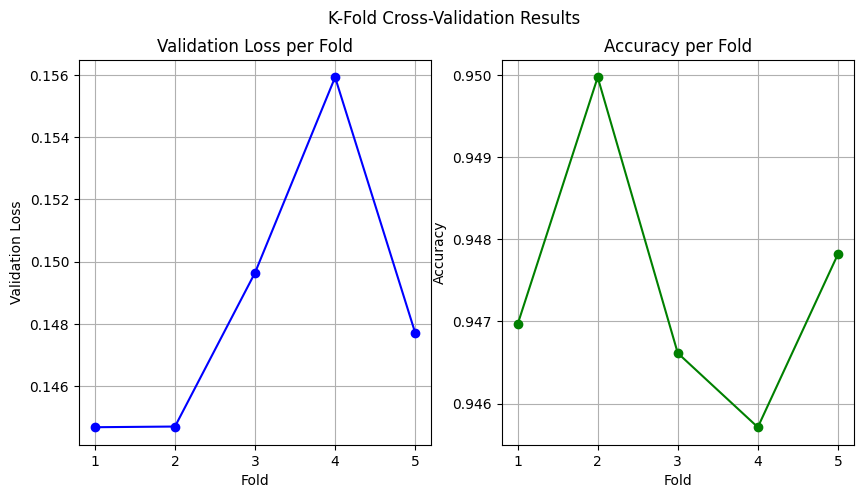

Average Validation Loss: 0.1485, Average Accuracy: 94.74%
Random OverSampler


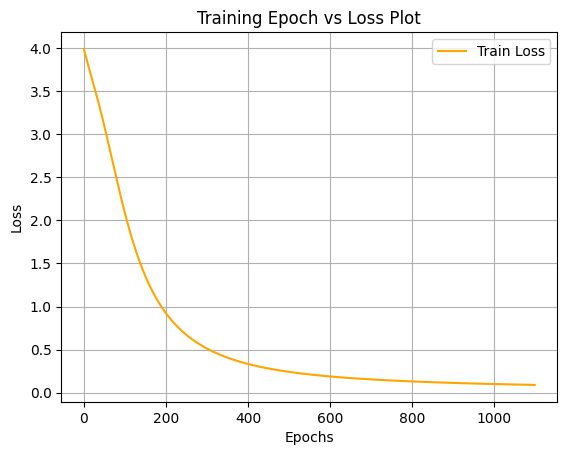

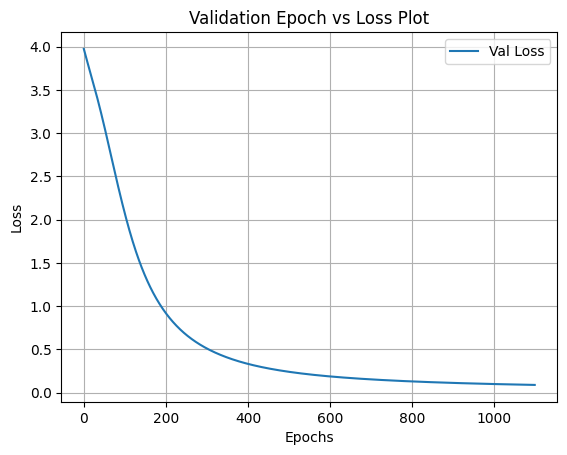

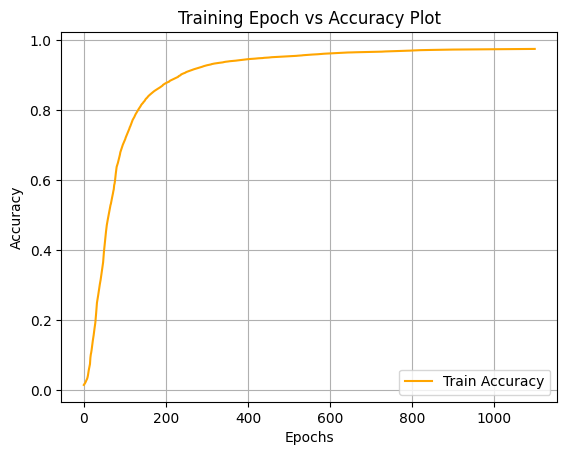

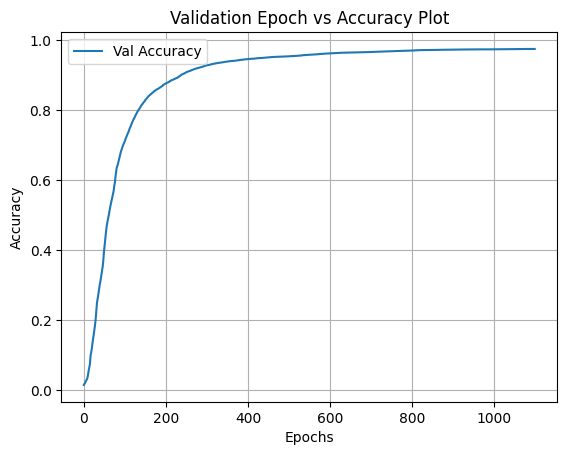

Test Accuracy: 97.58%


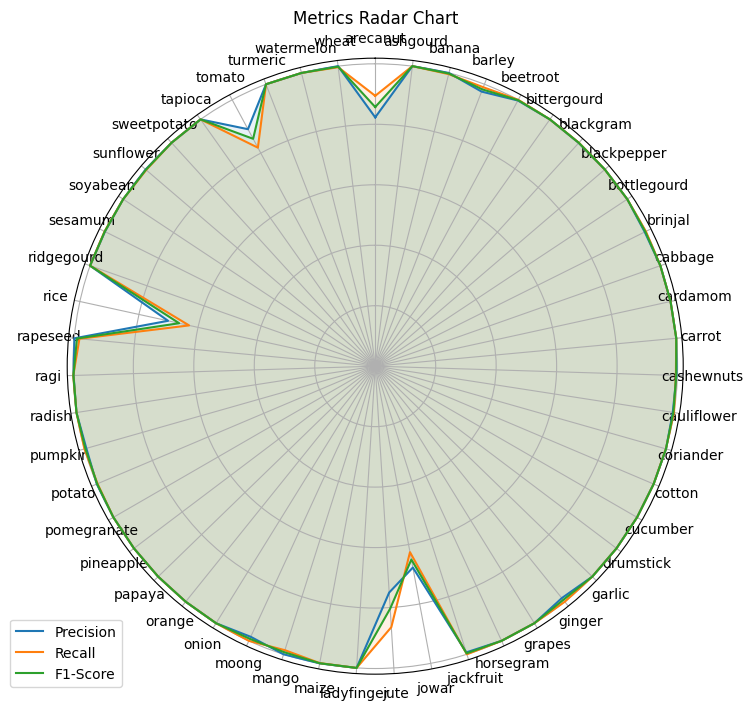

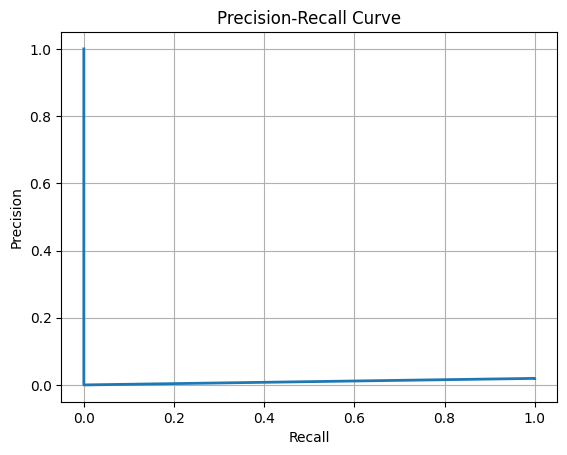

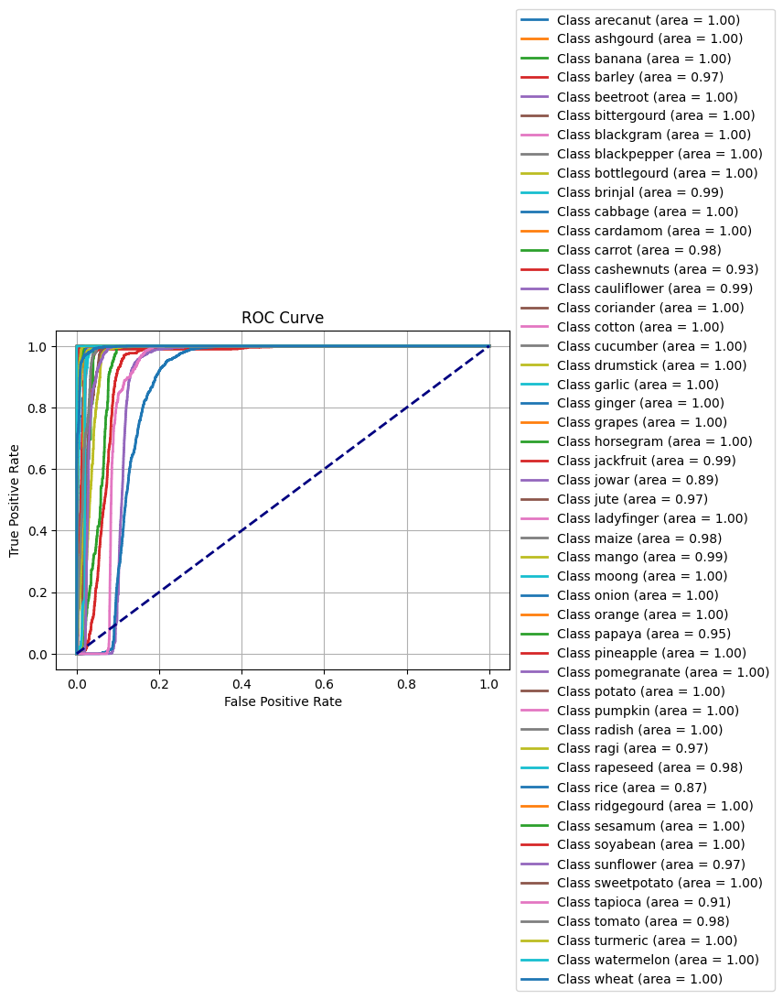

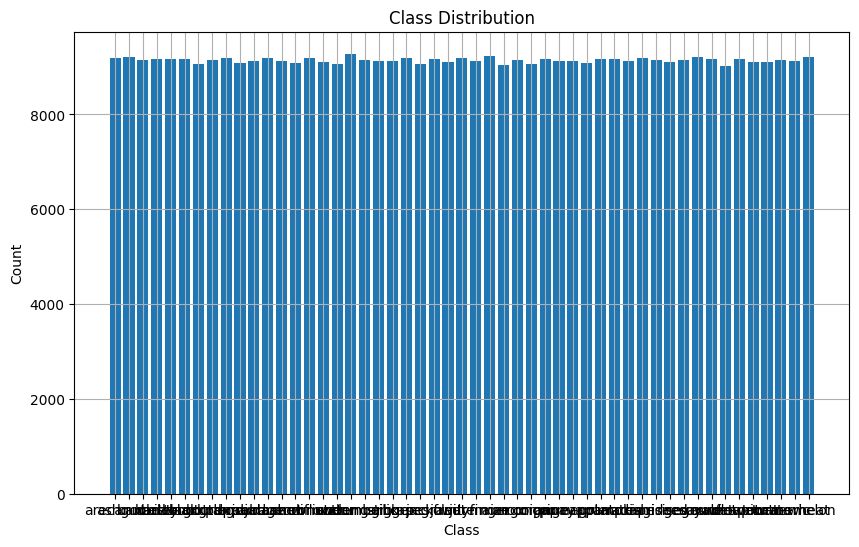

C:\Users\shyam\AppData\Local\Temp\ipykernel_18268\3034830407.py:341: RuntimeWarning: divide by zero encountered in double_scalars
  lift.append(gain / threshold)


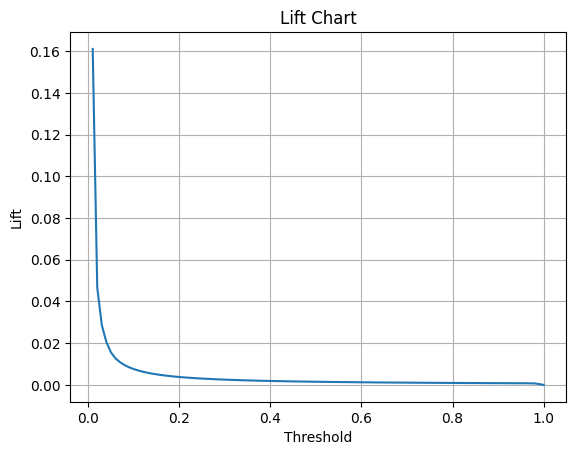

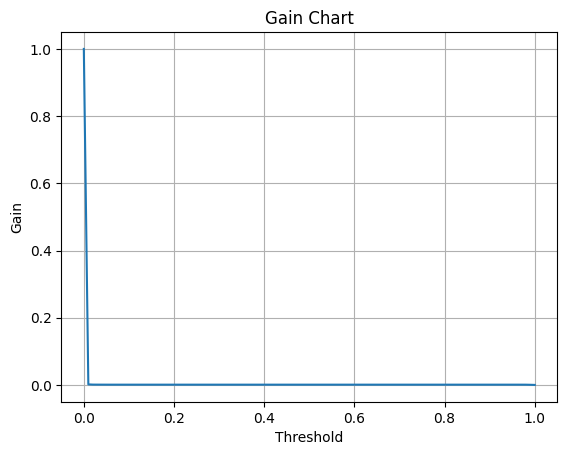

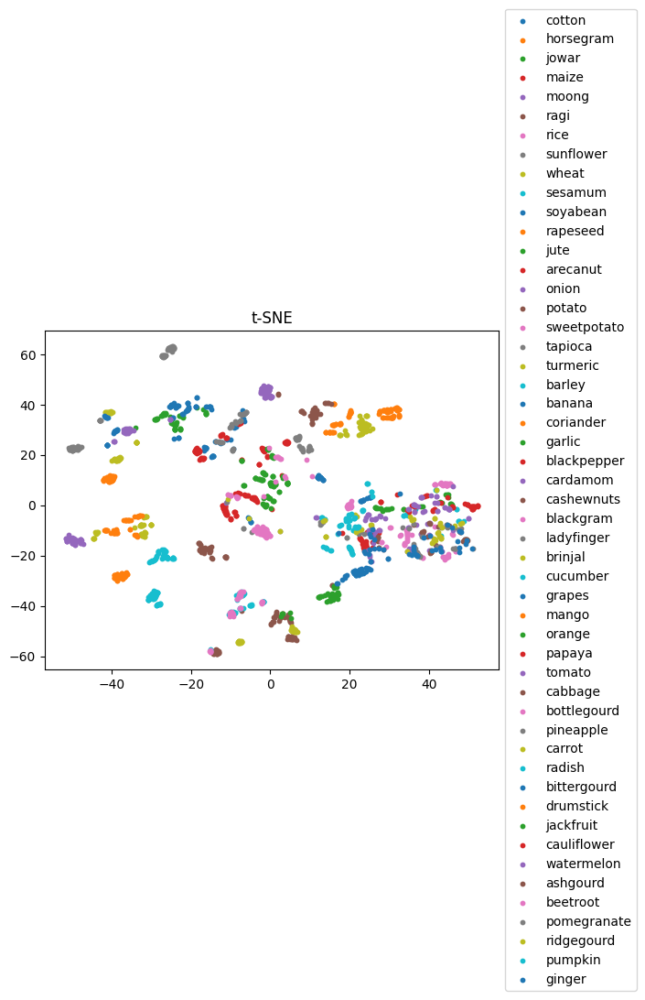

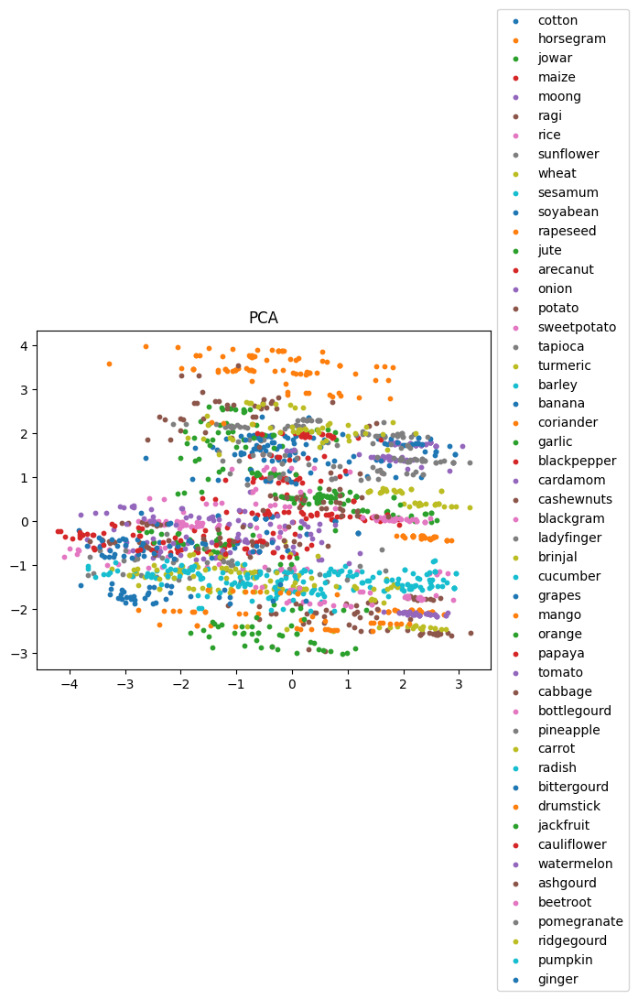

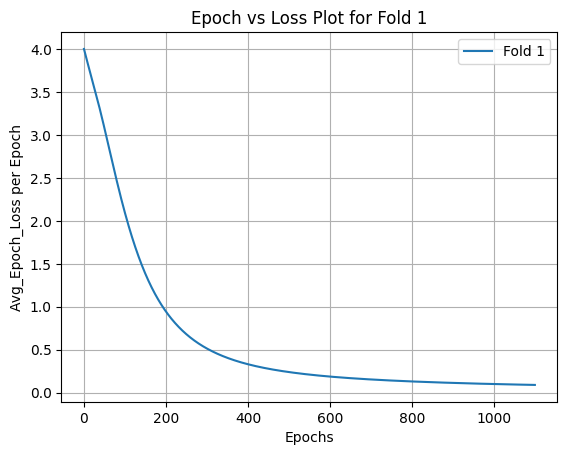

Epoch [1100/1100], Loss: 0.0895
Fold 1, Validation Loss: 0.0891113206744194, Accuracy: 97.95%
Fold 2, Validation Loss: 0.08615172654390335, Accuracy: 97.94%
Fold 3, Validation Loss: 0.08863986283540726, Accuracy: 97.84%
Fold 4, Validation Loss: 0.08950842916965485, Accuracy: 97.65%
Fold 5, Validation Loss: 0.09209001064300537, Accuracy: 97.53%


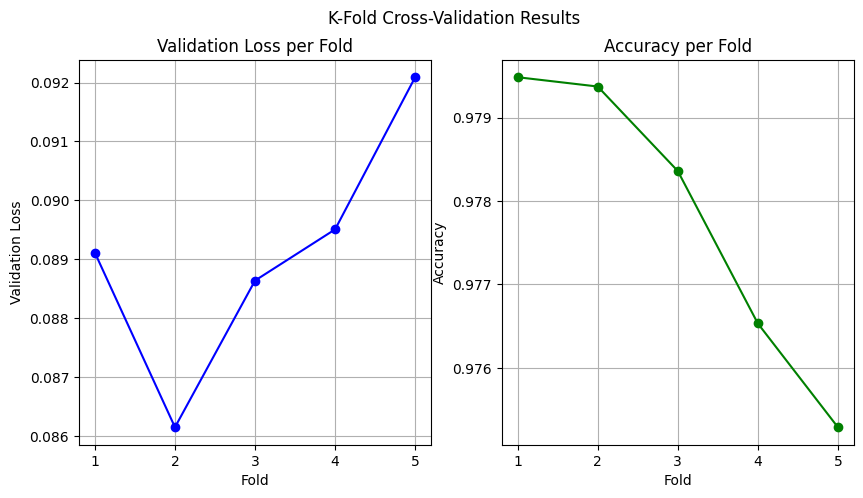

Average Validation Loss: 0.0891, Average Accuracy: 97.78%
Random UnderSampler


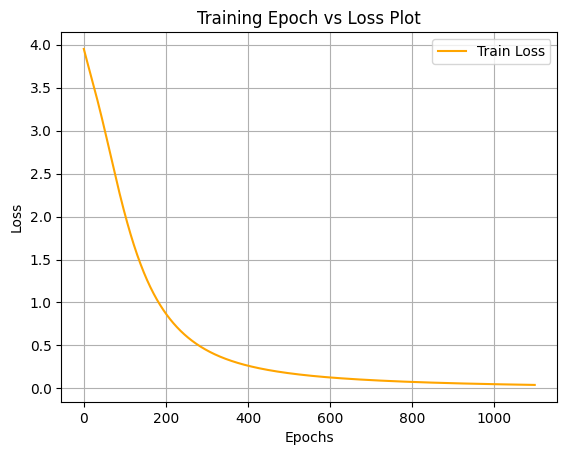

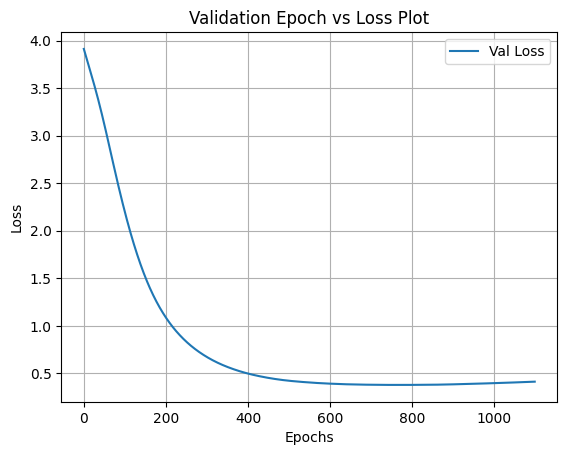

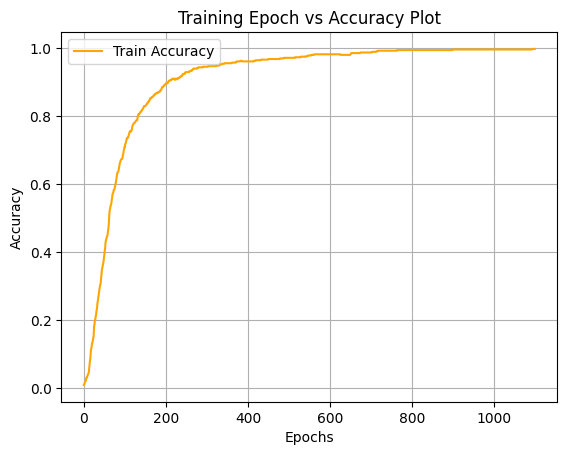

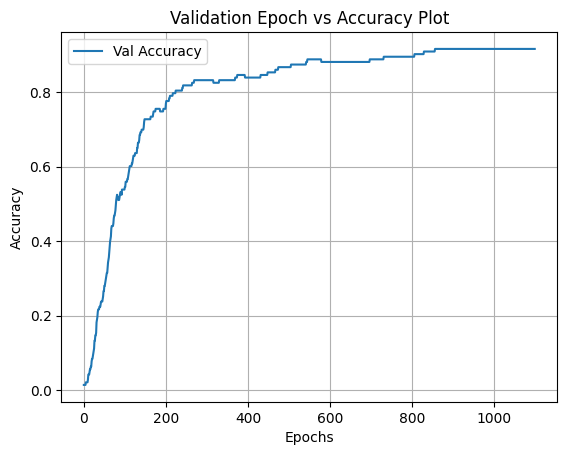

Test Accuracy: 91.61%


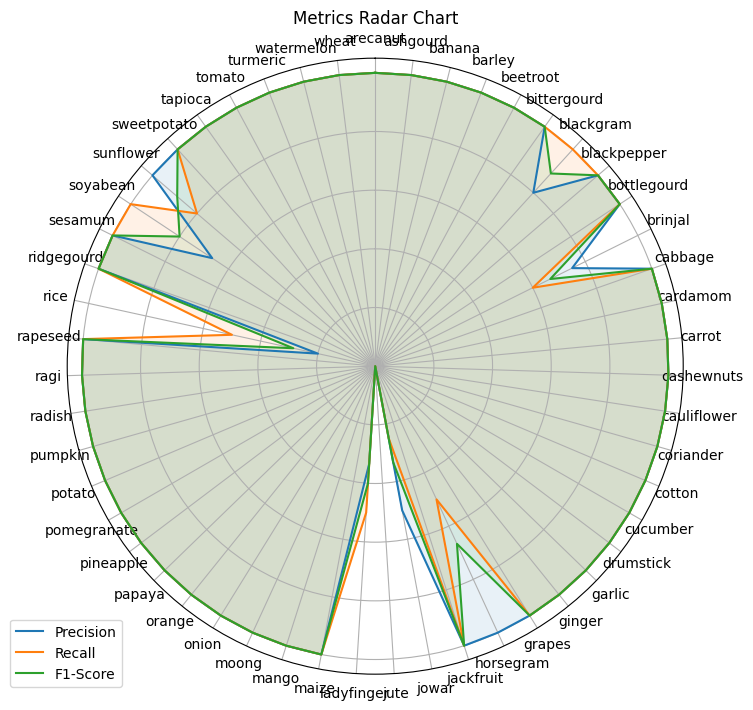

c:\Users\shyam\OneDrive\Desktop\DL_prac\PyTorch_Tut\.myenv\lib\site-packages\sklearn\metrics\_ranking.py:993: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(


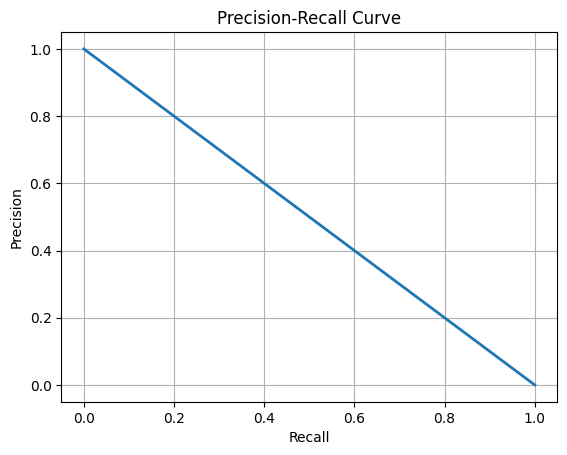

c:\Users\shyam\OneDrive\Desktop\DL_prac\PyTorch_Tut\.myenv\lib\site-packages\sklearn\metrics\_ranking.py:1146: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  warnings.warn(
c:\Users\shyam\OneDrive\Desktop\DL_prac\PyTorch_Tut\.myenv\lib\site-packages\sklearn\metrics\_ranking.py:1146: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  warnings.warn(
c:\Users\shyam\OneDrive\Desktop\DL_prac\PyTorch_Tut\.myenv\lib\site-packages\sklearn\metrics\_ranking.py:1146: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  warnings.warn(


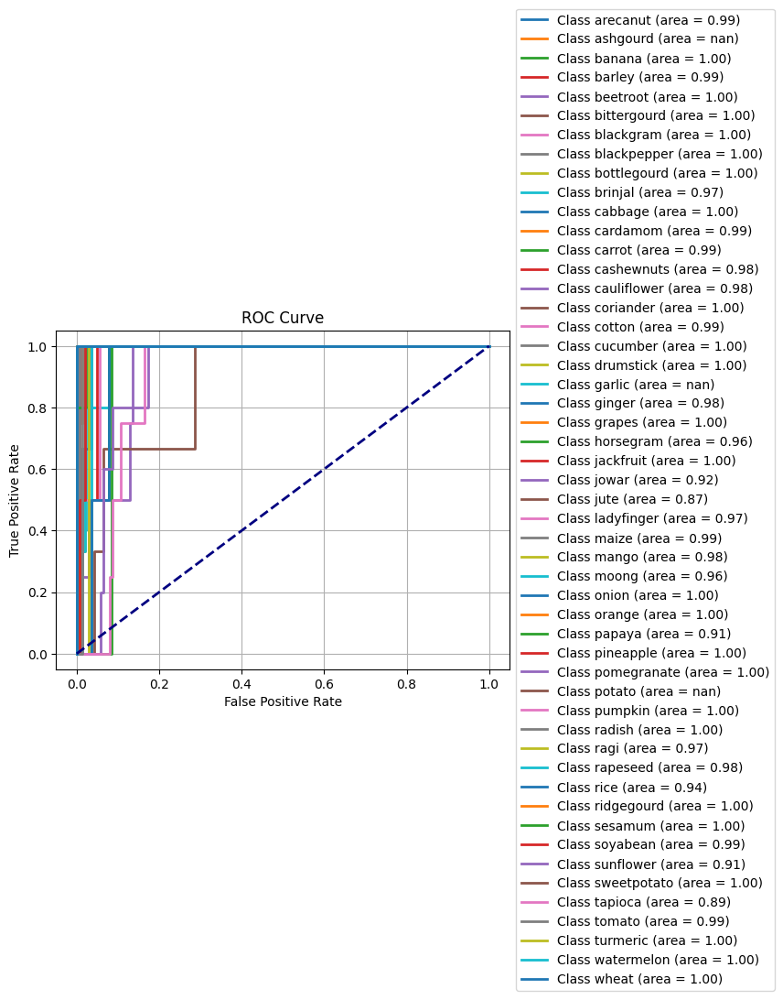

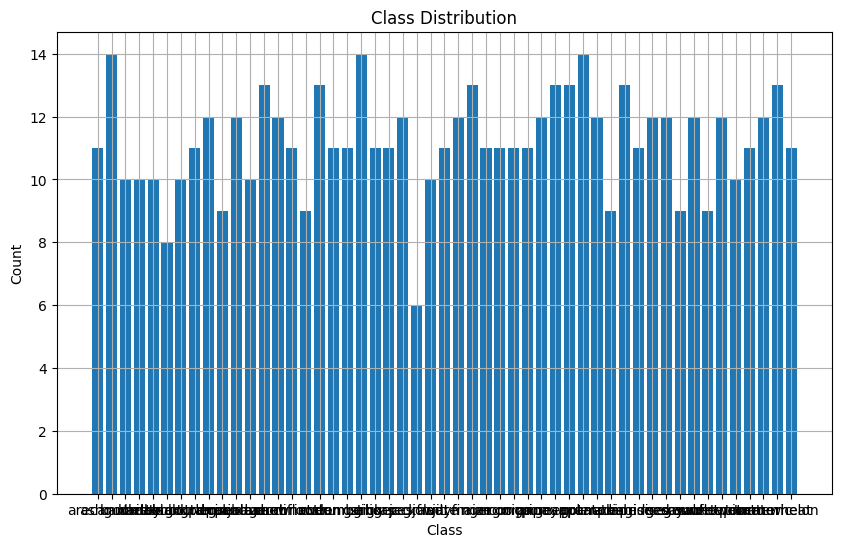

C:\Users\shyam\AppData\Local\Temp\ipykernel_18268\3034830407.py:341: RuntimeWarning: divide by zero encountered in double_scalars
  lift.append(gain / threshold)


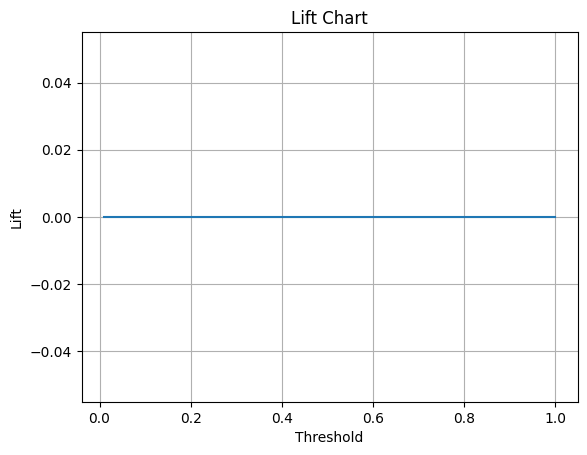

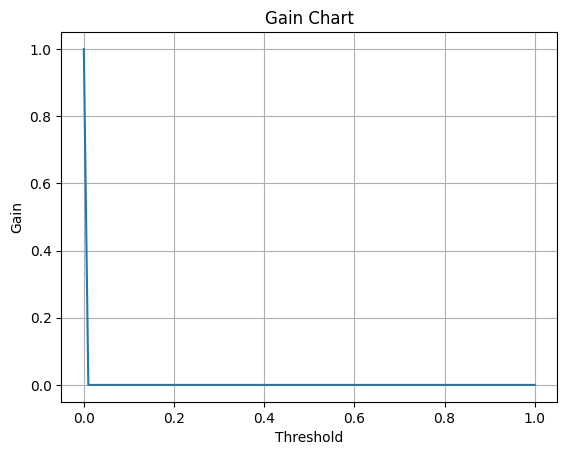

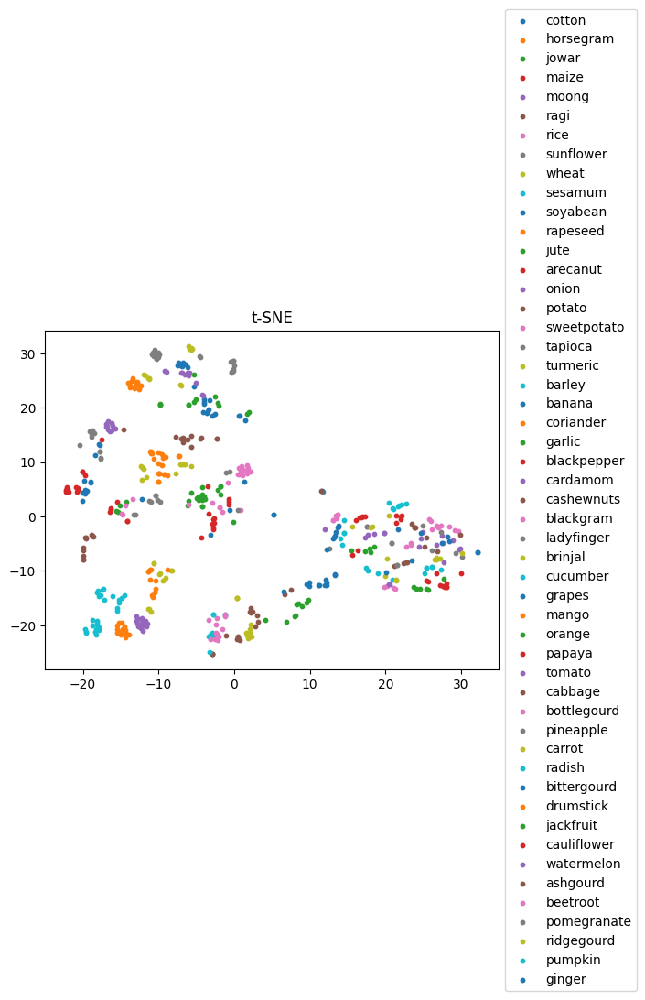

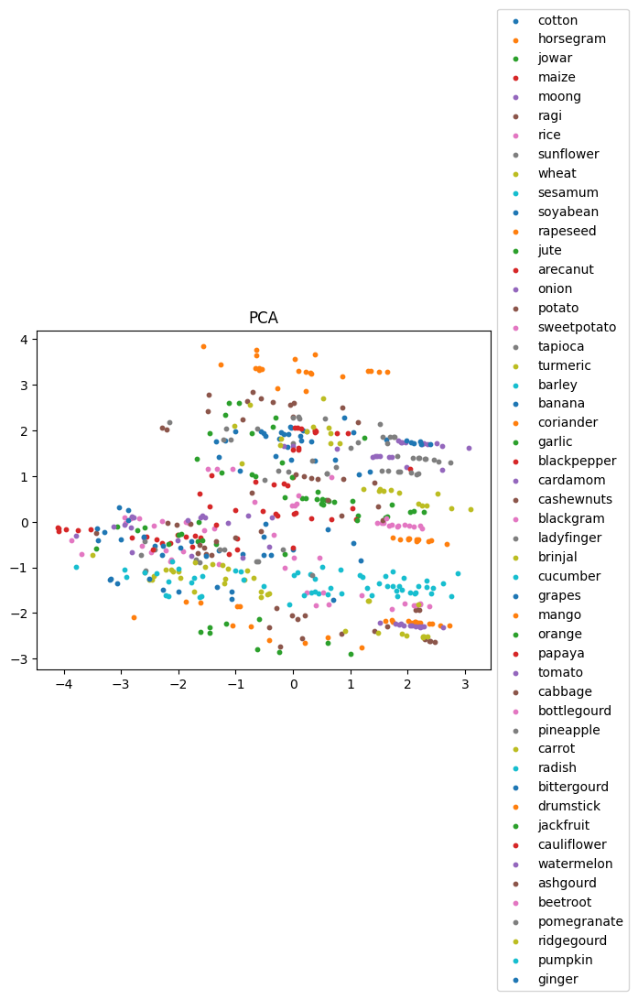

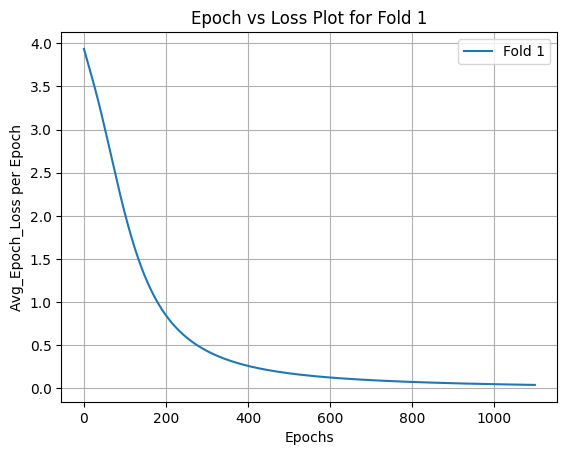

Epoch [1100/1100], Loss: 0.0413
Fold 1, Validation Loss: 0.41183483600616455, Accuracy: 90.21%
Fold 2, Validation Loss: 0.35337138175964355, Accuracy: 91.61%
Fold 3, Validation Loss: 0.19586460292339325, Accuracy: 94.41%
Fold 4, Validation Loss: 0.2513154149055481, Accuracy: 92.31%
Fold 5, Validation Loss: 0.5093178153038025, Accuracy: 88.73%


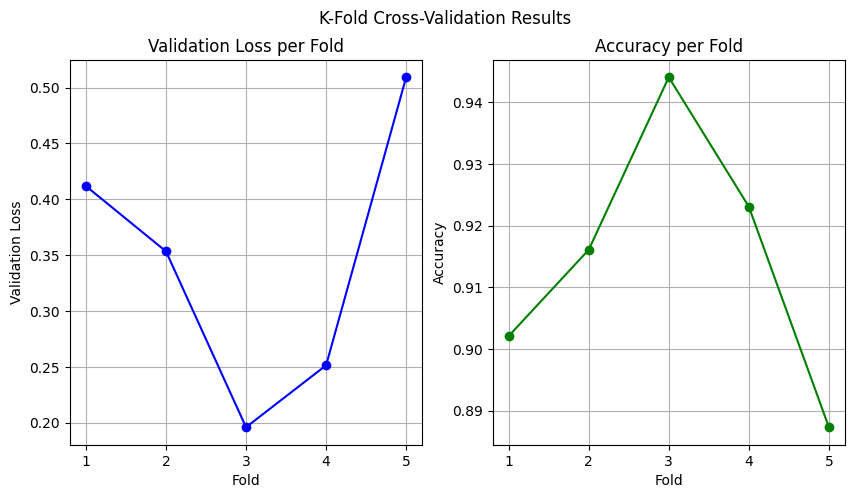

Average Validation Loss: 0.3443, Average Accuracy: 91.45%
SMOTE


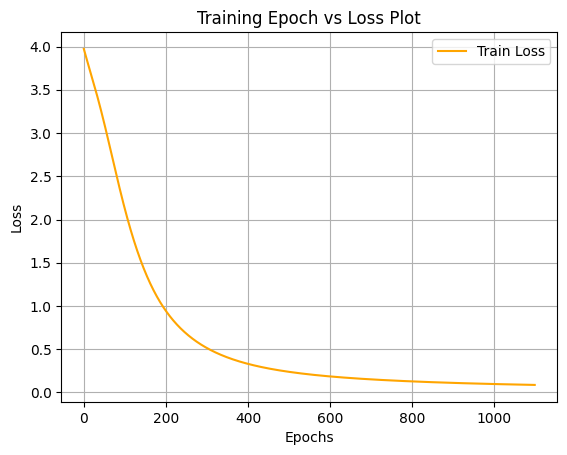

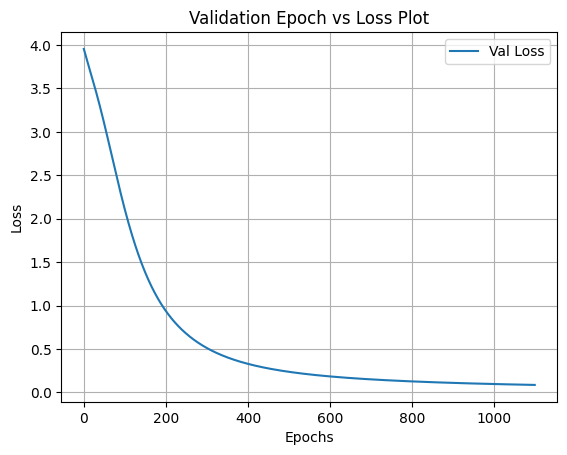

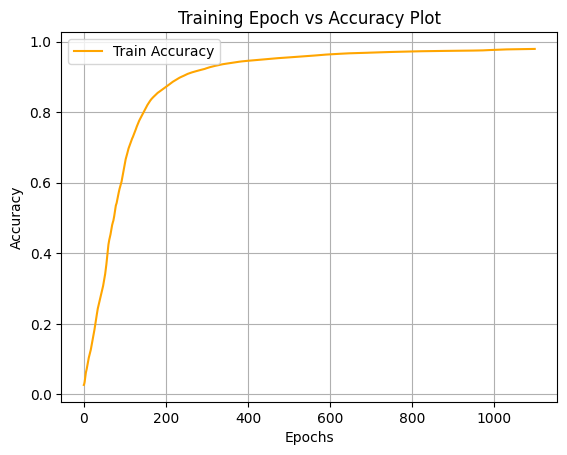

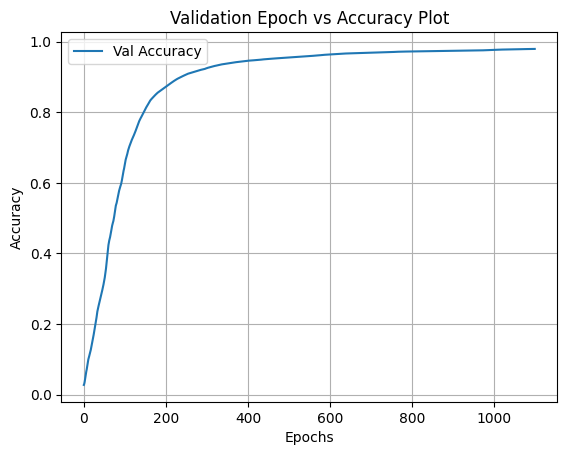

Test Accuracy: 97.94%


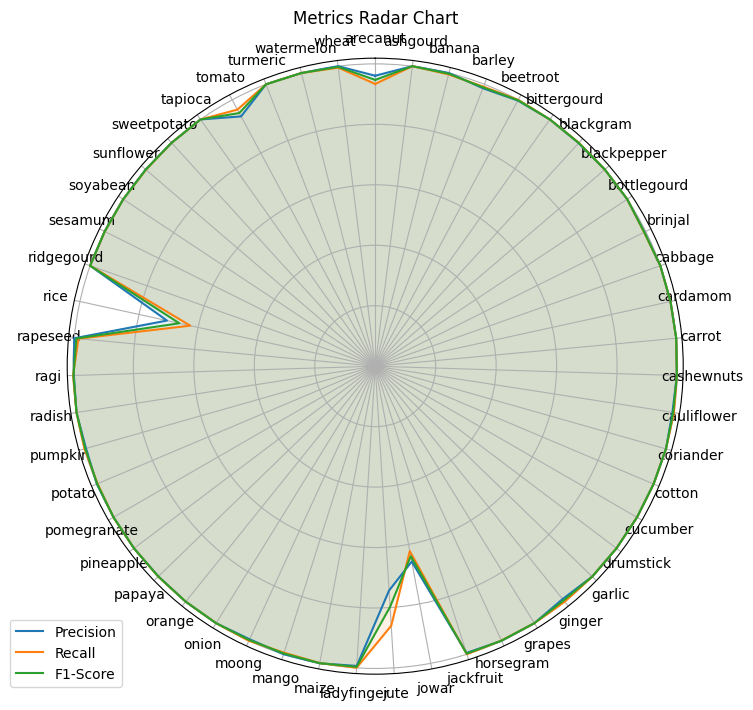

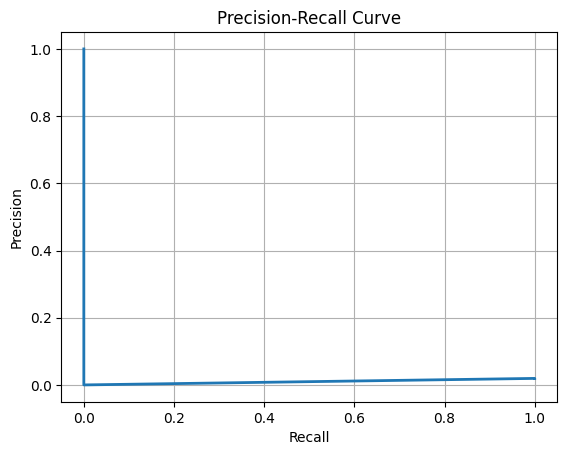

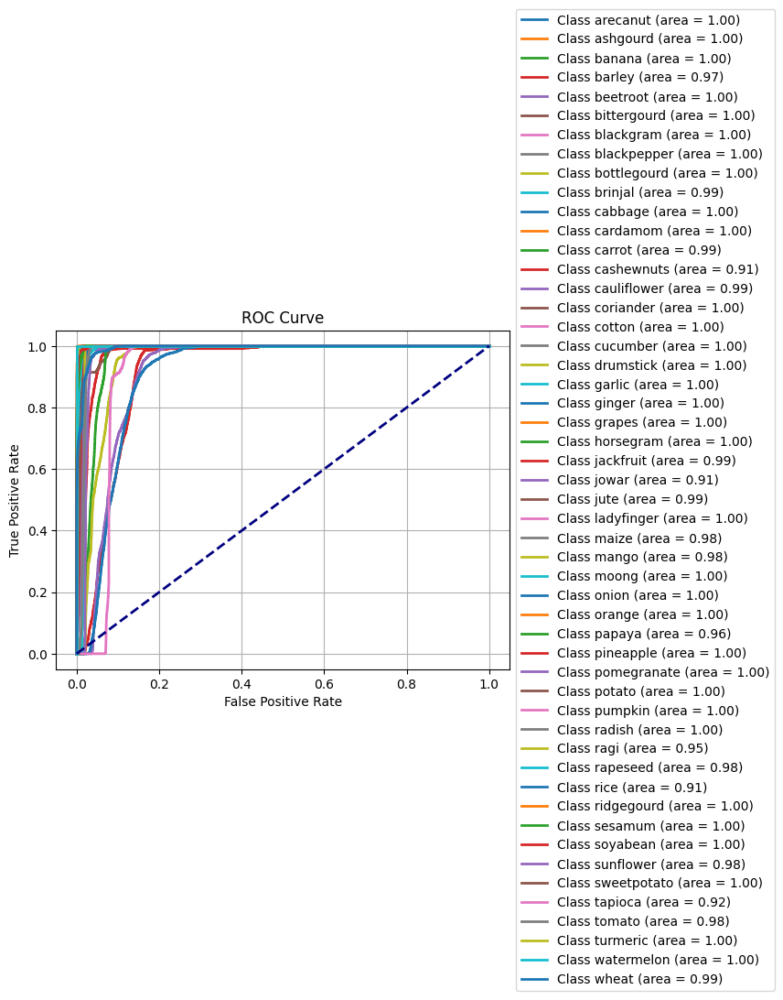

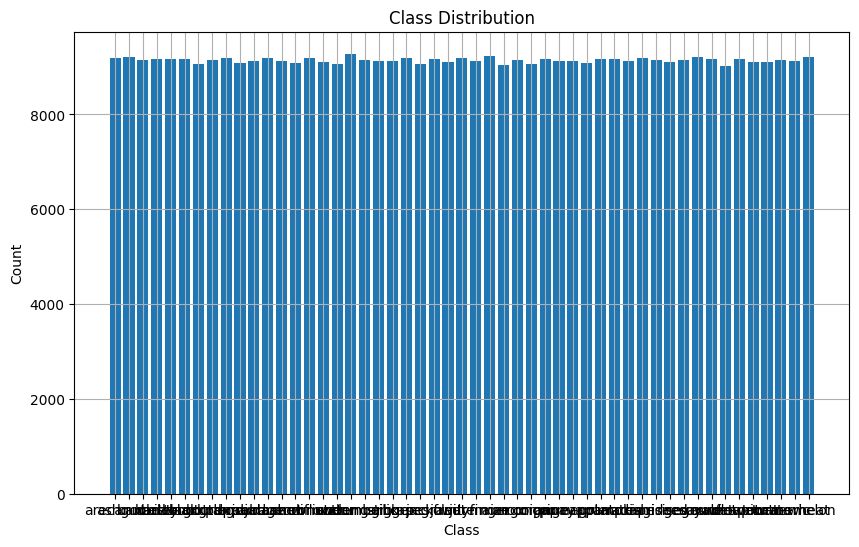

C:\Users\shyam\AppData\Local\Temp\ipykernel_18268\3034830407.py:341: RuntimeWarning: divide by zero encountered in double_scalars
  lift.append(gain / threshold)


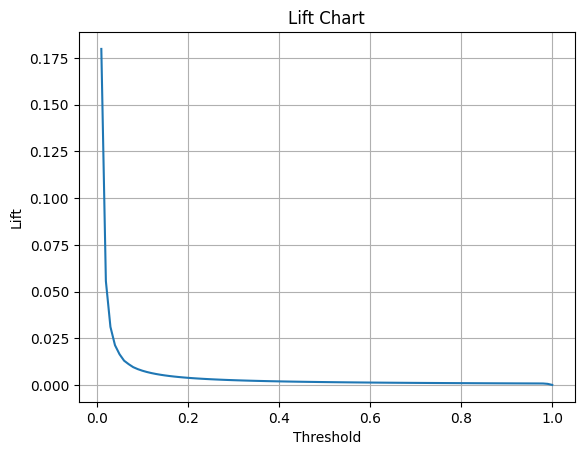

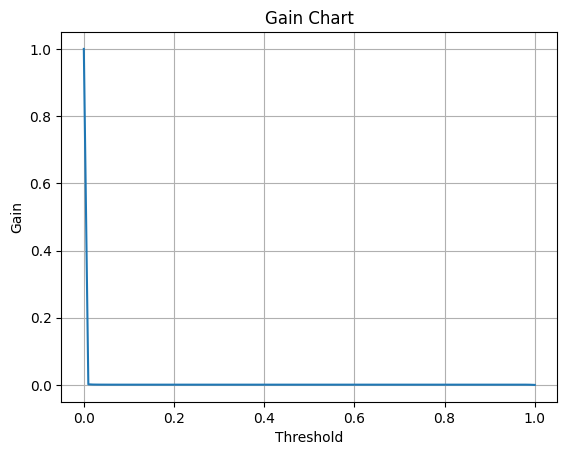

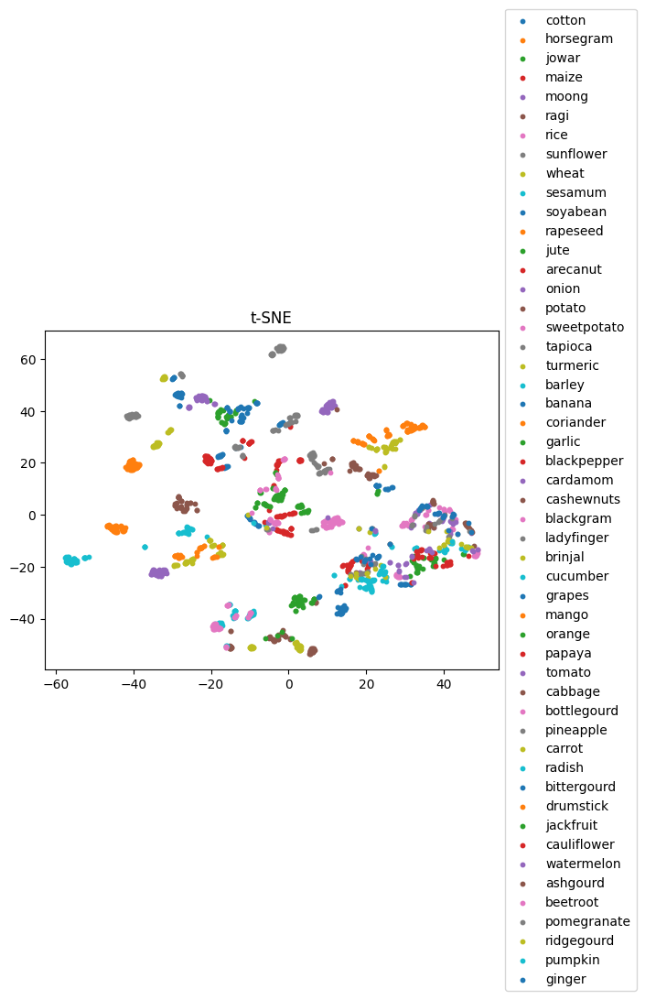

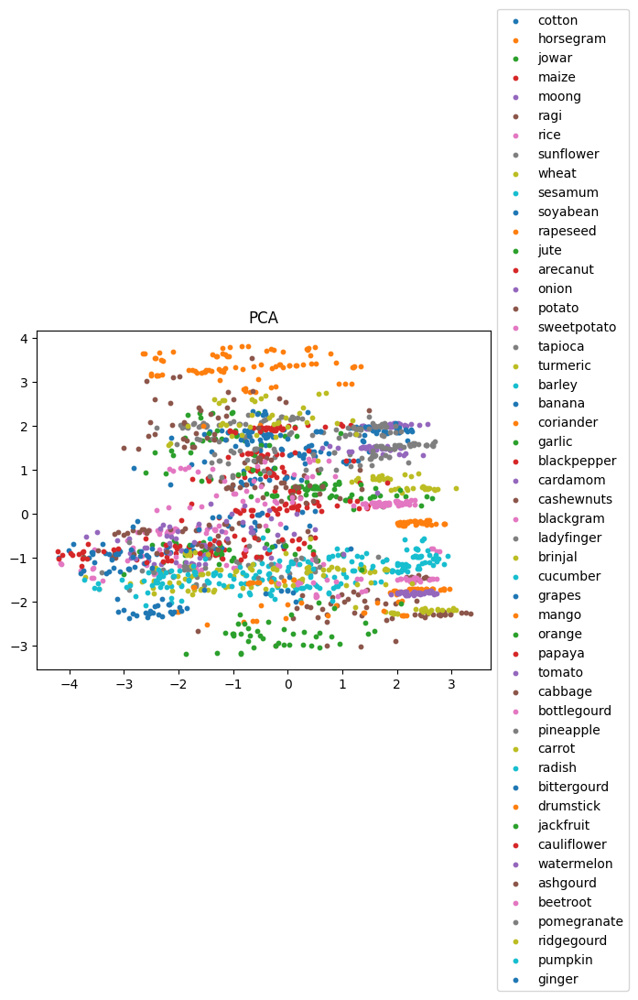

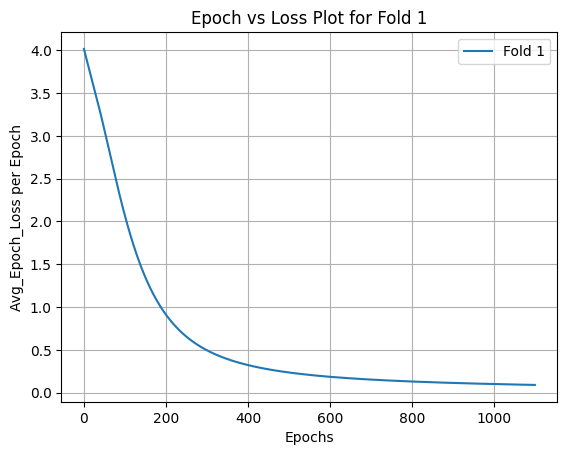

Epoch [1100/1100], Loss: 0.0900
Fold 1, Validation Loss: 0.08943084627389908, Accuracy: 97.62%
Fold 2, Validation Loss: 0.08796606212854385, Accuracy: 97.76%
Fold 3, Validation Loss: 0.09176702052354813, Accuracy: 97.49%
Fold 4, Validation Loss: 0.08470042049884796, Accuracy: 98.02%
Fold 5, Validation Loss: 0.08537498116493225, Accuracy: 97.99%


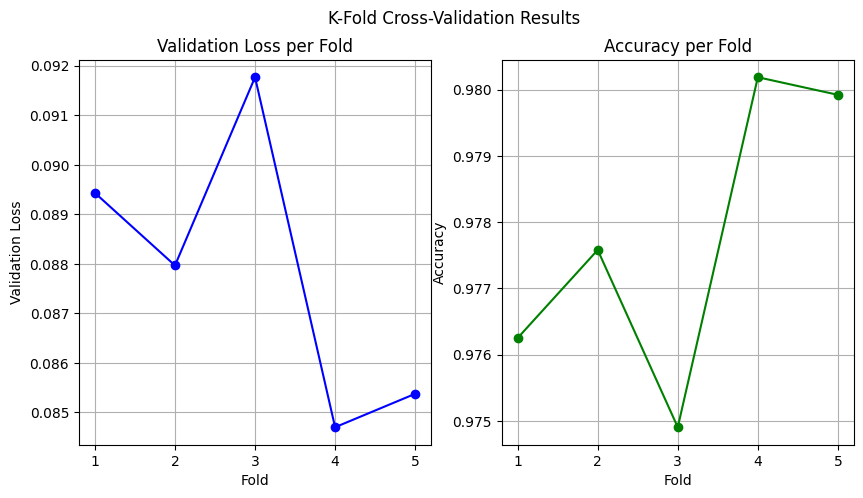

Average Validation Loss: 0.0878, Average Accuracy: 97.78%
SMOTE + Tomek


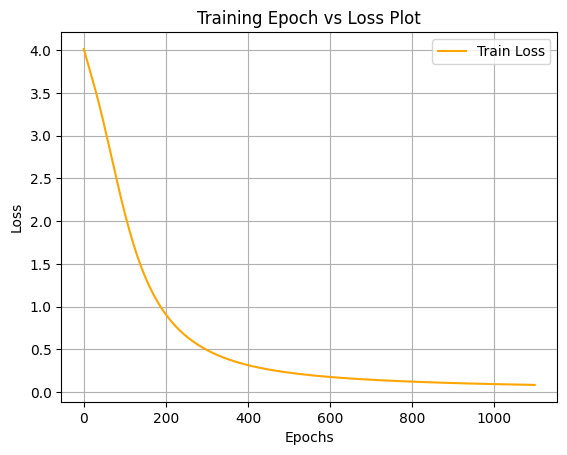

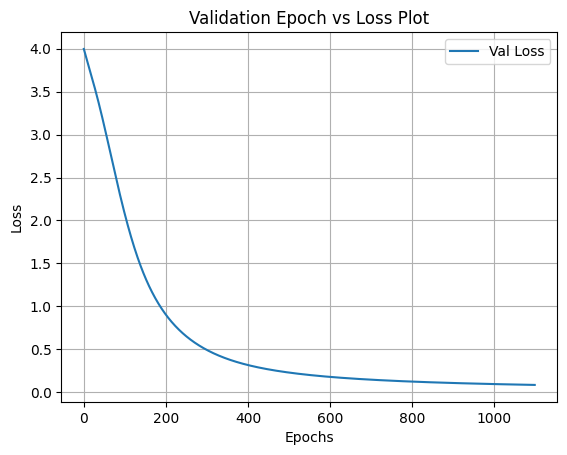

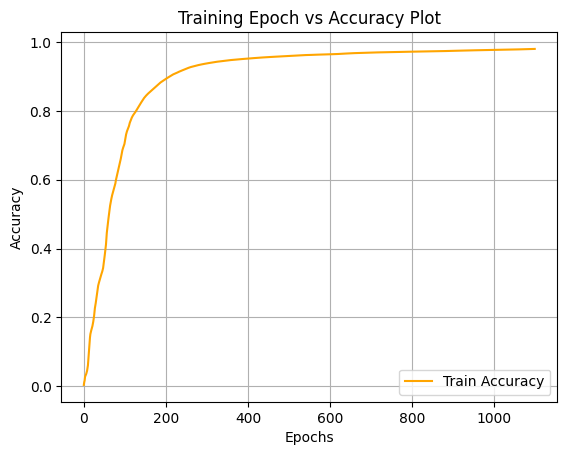

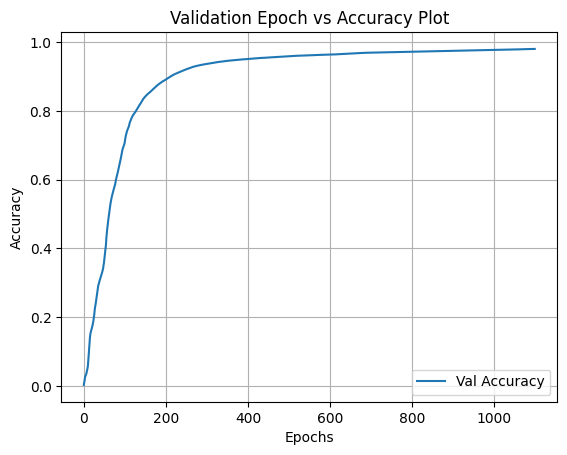

Test Accuracy: 97.99%


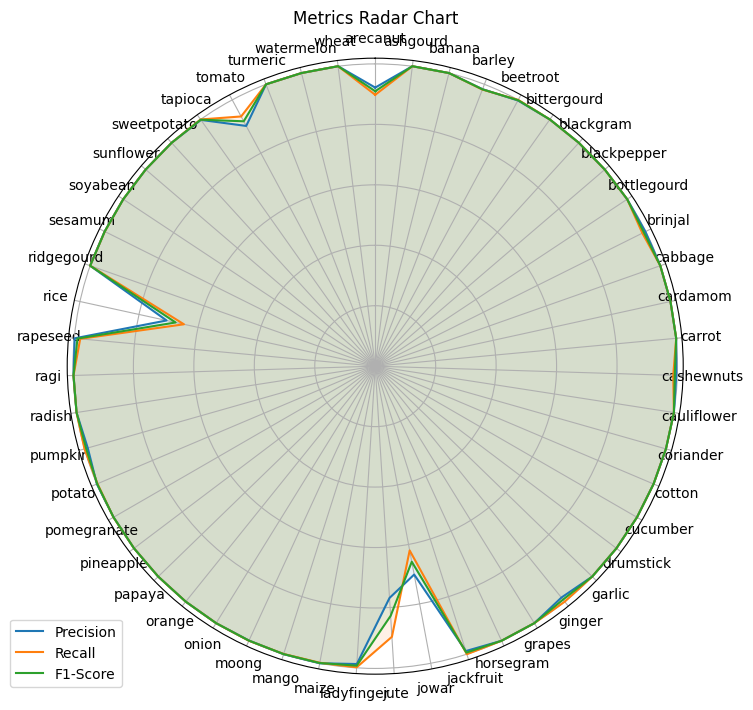

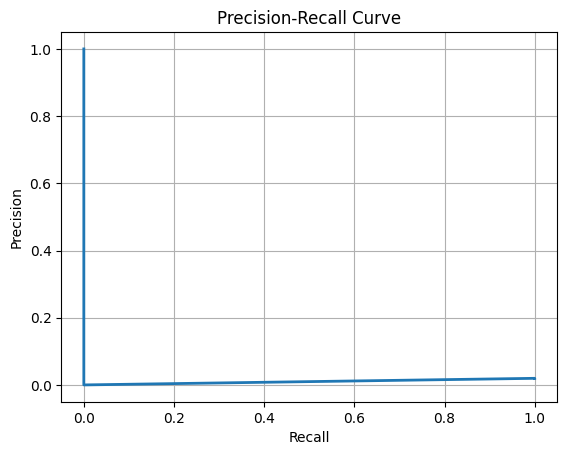

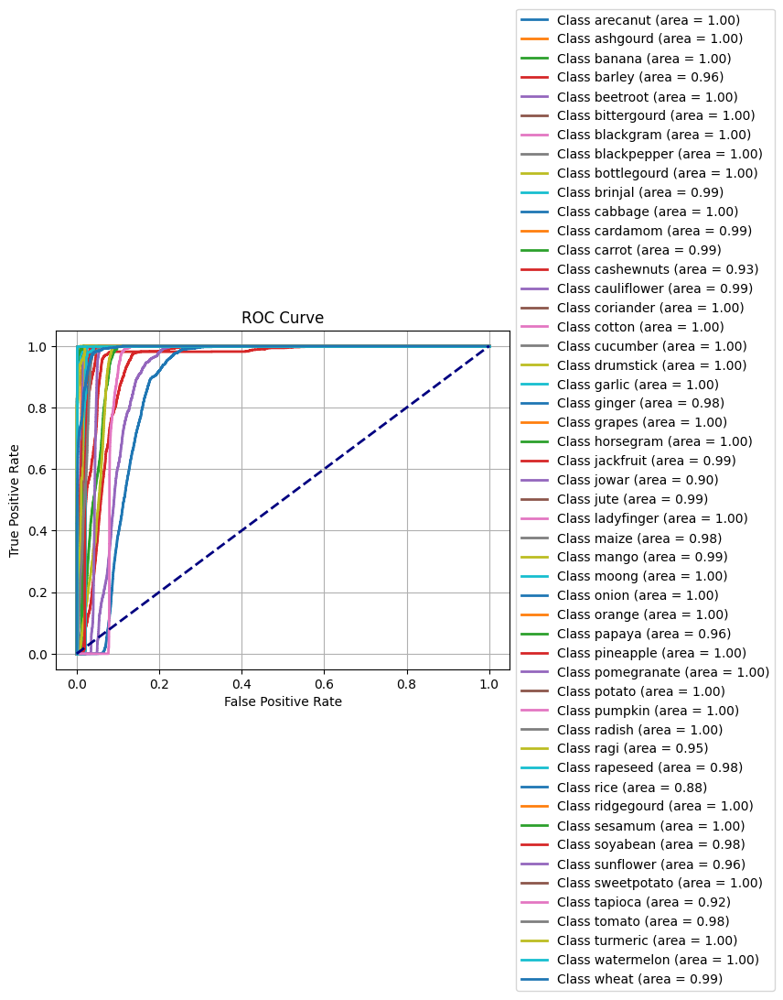

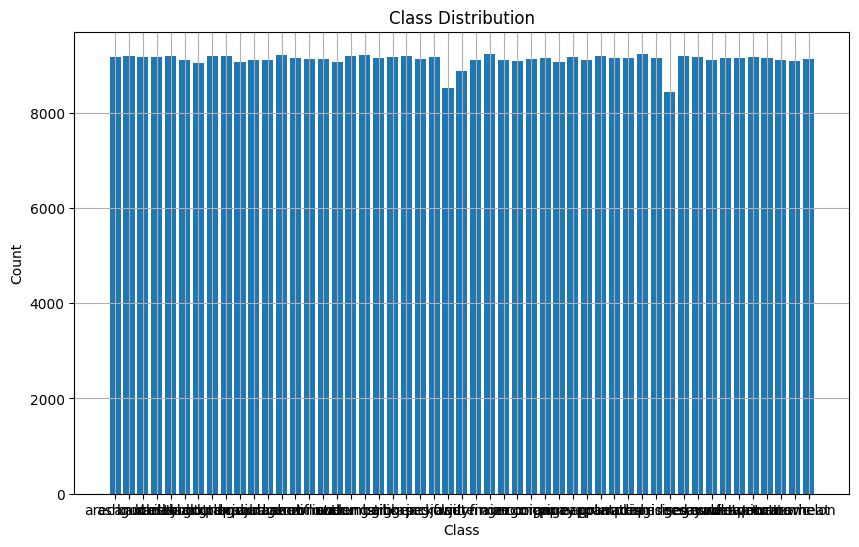

C:\Users\shyam\AppData\Local\Temp\ipykernel_18268\3034830407.py:341: RuntimeWarning: divide by zero encountered in double_scalars
  lift.append(gain / threshold)


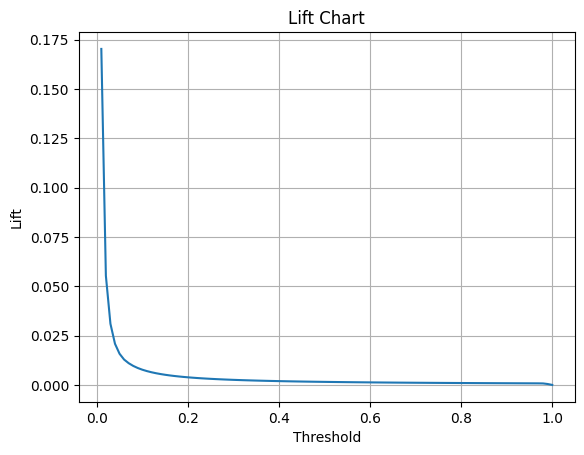

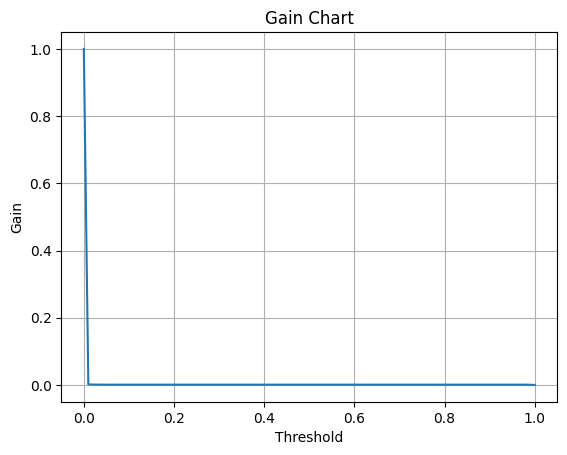

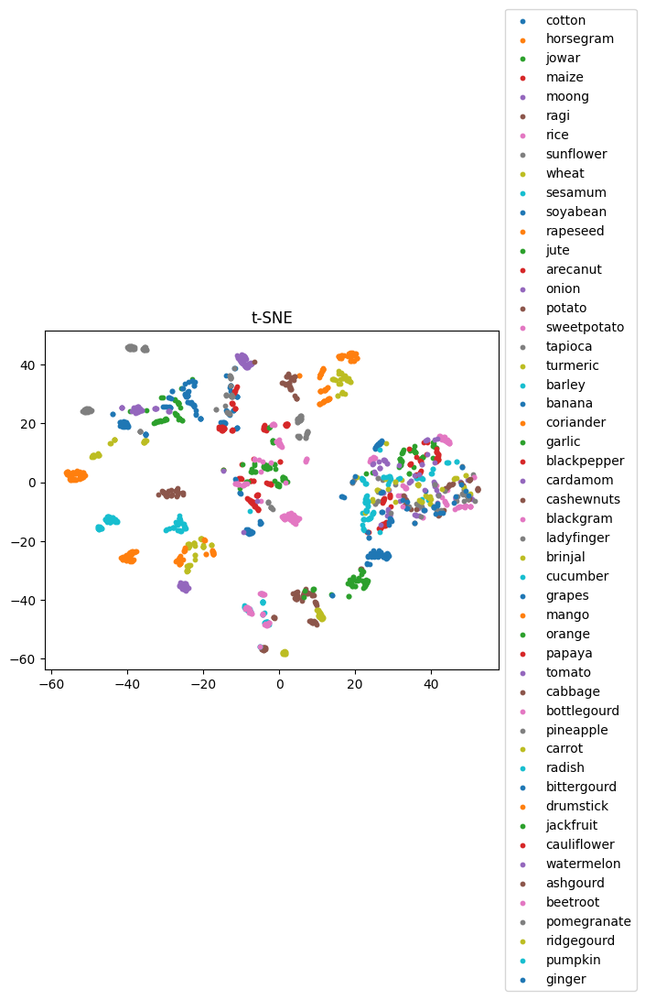

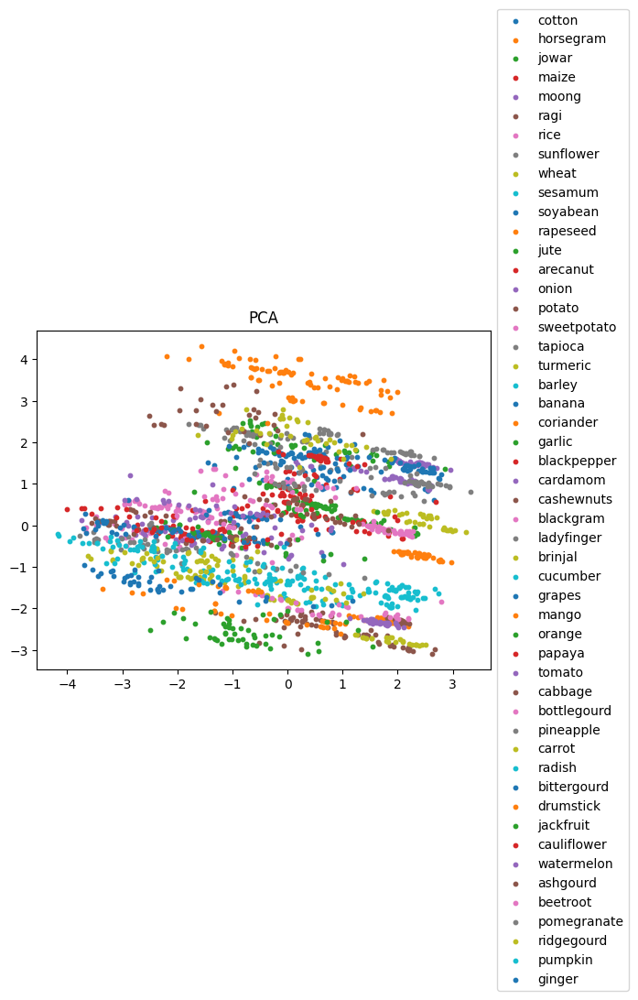

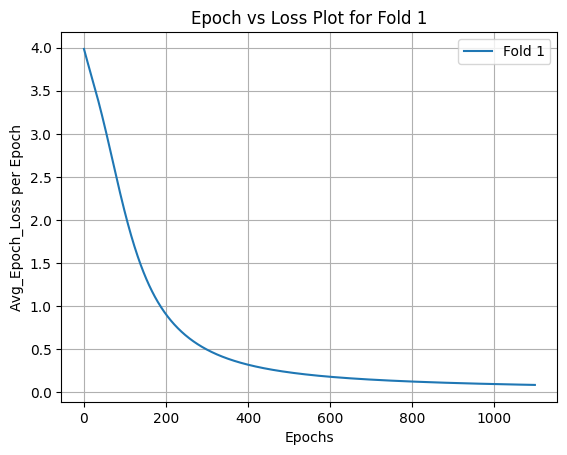

Epoch [1100/1100], Loss: 0.0832
Fold 1, Validation Loss: 0.08482478559017181, Accuracy: 98.09%
Fold 2, Validation Loss: 0.08207222074270248, Accuracy: 98.11%
Fold 3, Validation Loss: 0.08236058056354523, Accuracy: 98.22%
Fold 4, Validation Loss: 0.08762246370315552, Accuracy: 97.69%
Fold 5, Validation Loss: 0.08635776489973068, Accuracy: 98.13%


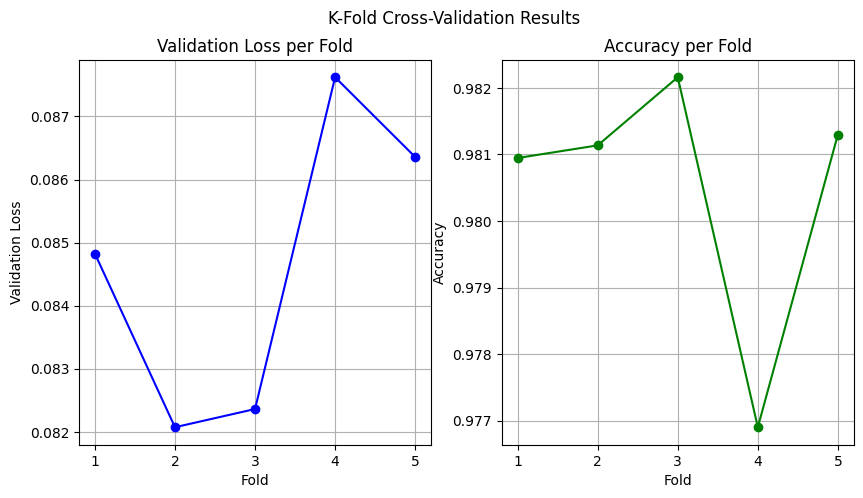

Average Validation Loss: 0.0846, Average Accuracy: 98.05%
SMOTEENN


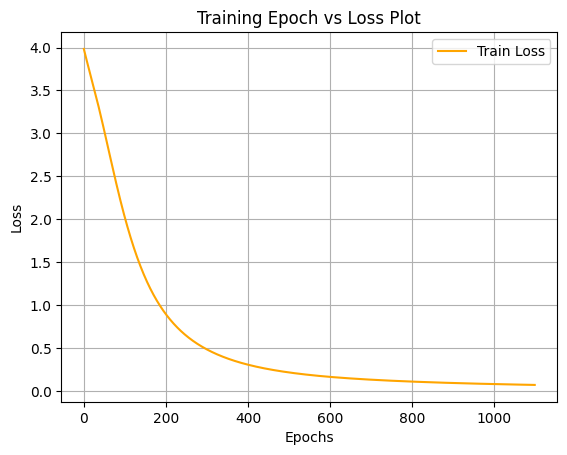

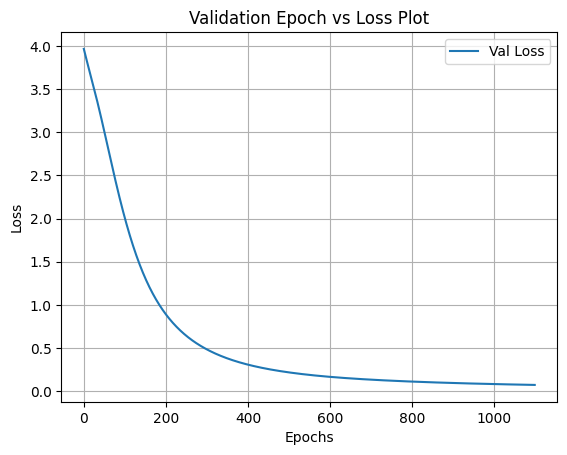

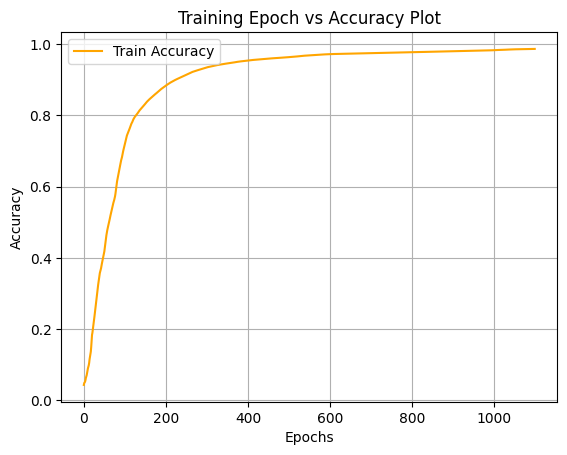

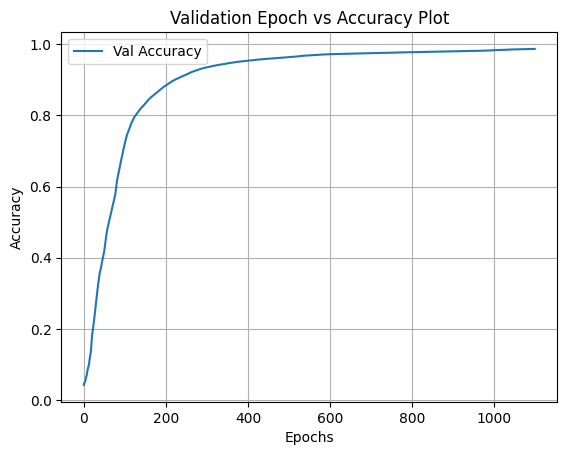

Test Accuracy: 98.61%


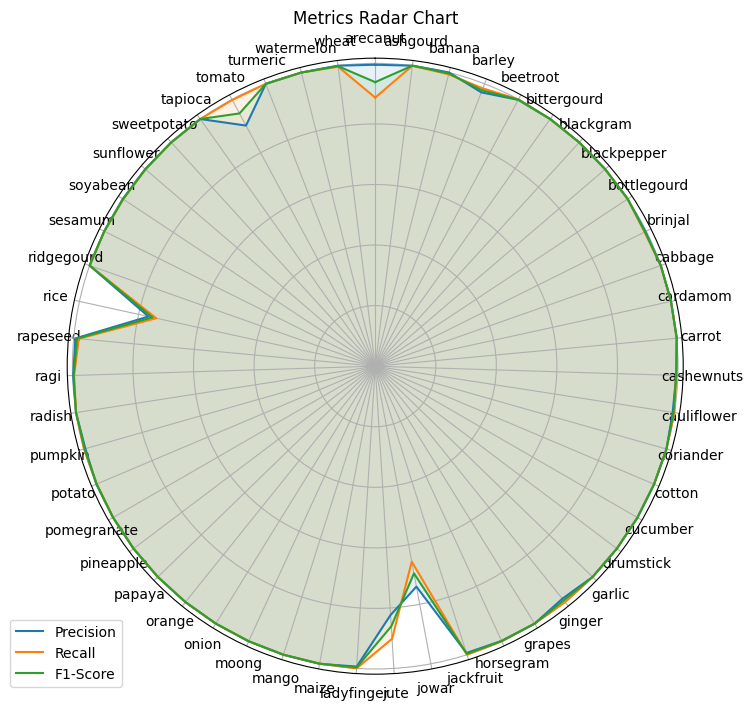

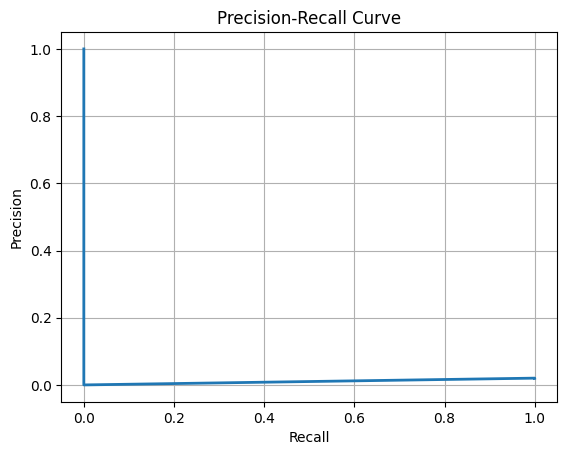

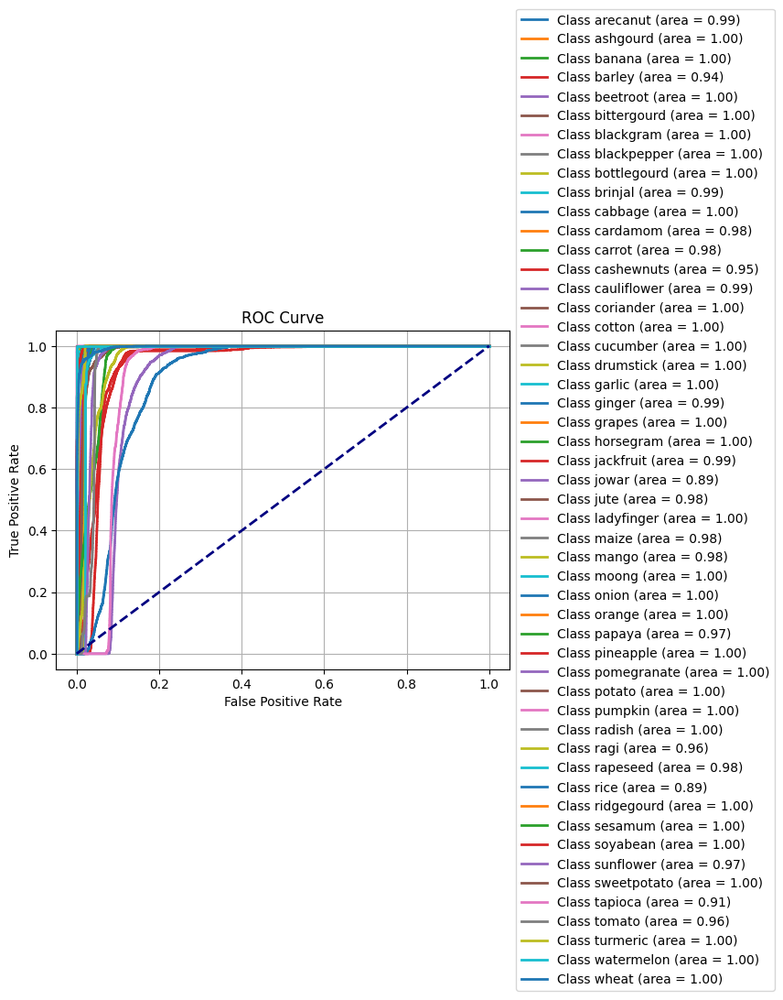

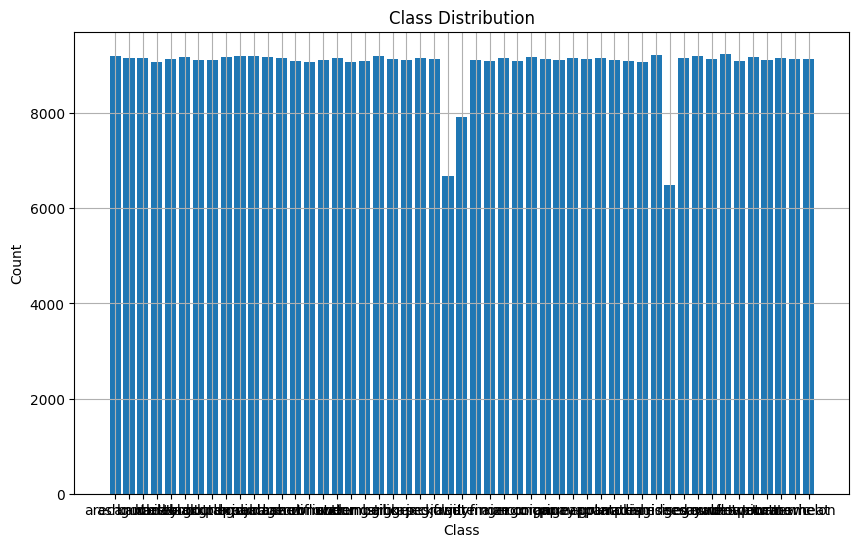

C:\Users\shyam\AppData\Local\Temp\ipykernel_18268\3034830407.py:341: RuntimeWarning: divide by zero encountered in double_scalars
  lift.append(gain / threshold)


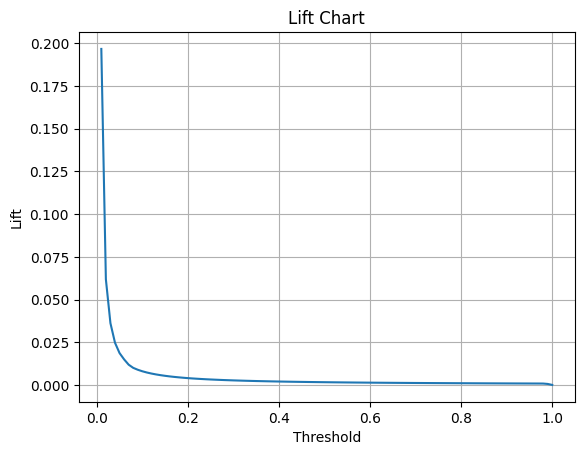

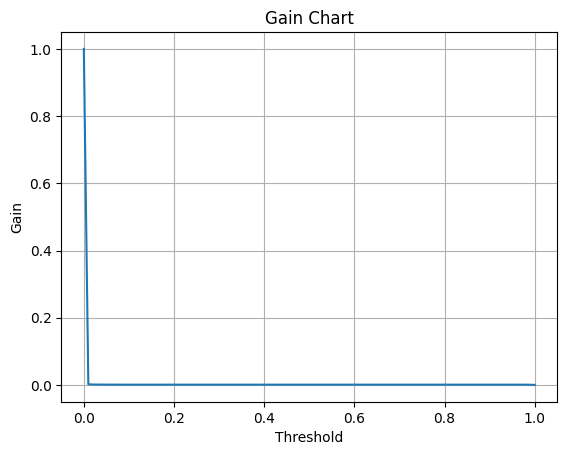

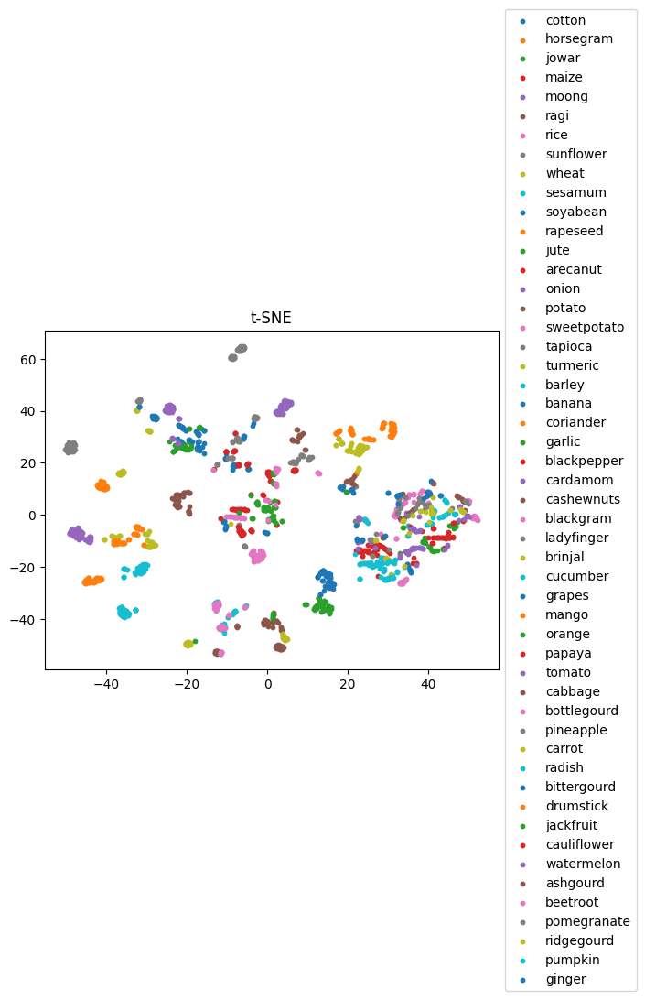

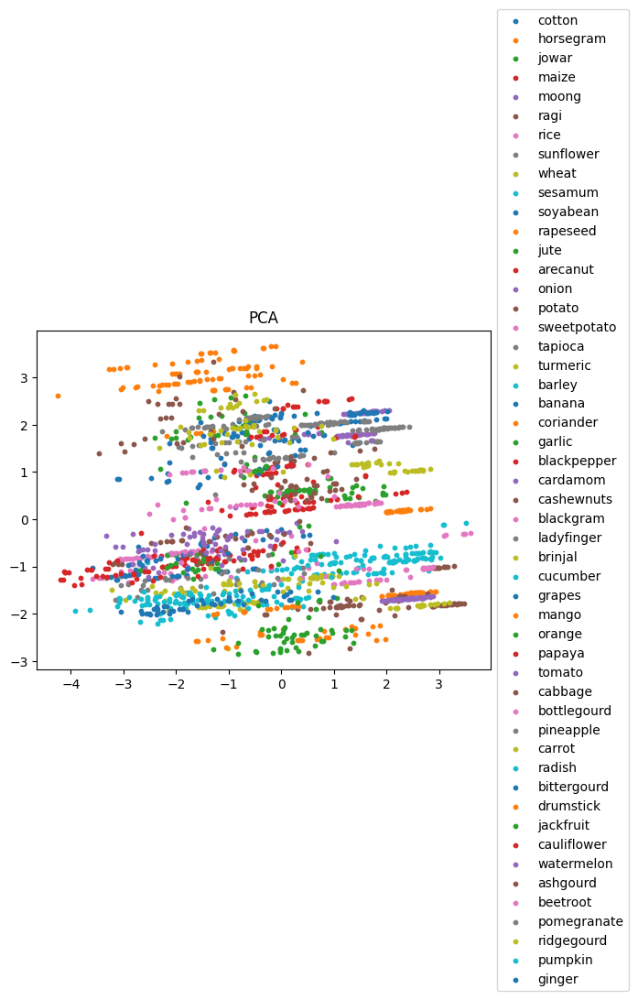

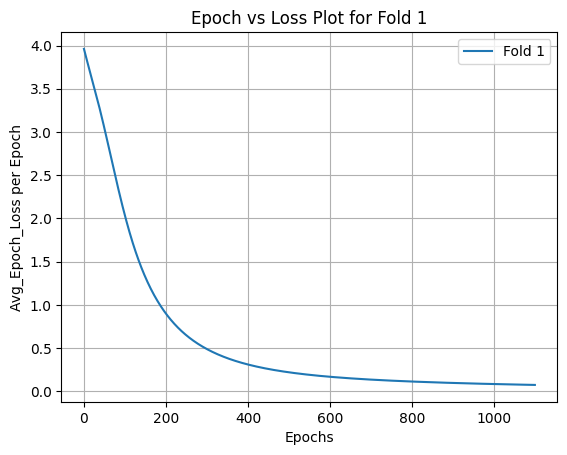

Epoch [1100/1100], Loss: 0.0735
Fold 1, Validation Loss: 0.07393720746040344, Accuracy: 98.66%
Fold 2, Validation Loss: 0.07304897159337997, Accuracy: 98.61%
Fold 3, Validation Loss: 0.07584058493375778, Accuracy: 98.58%
Fold 4, Validation Loss: 0.07804980129003525, Accuracy: 98.07%
Fold 5, Validation Loss: 0.07393863052129745, Accuracy: 98.57%


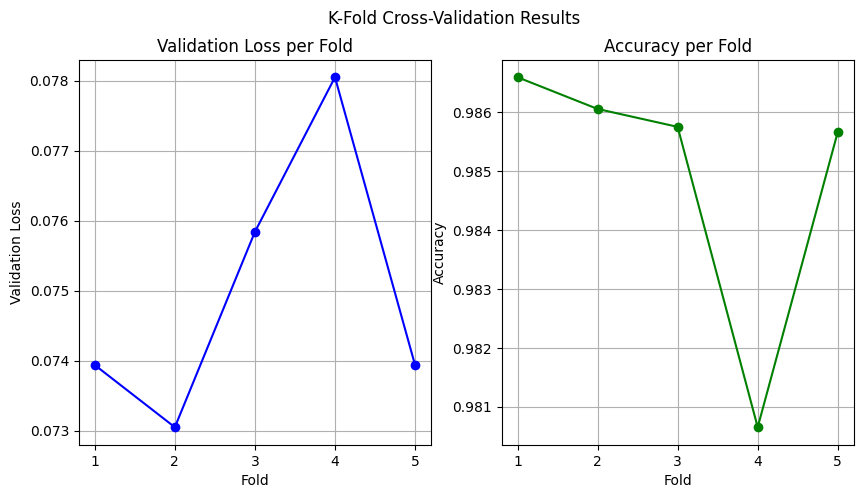

Average Validation Loss: 0.0750, Average Accuracy: 98.49%


In [120]:
features = data.drop(columns=['Crop']).values
target = data['Crop'].values


features = torch.tensor(features, dtype=torch.float32).float().to("cuda")
target = torch.tensor(target, dtype=torch.long).long().to("cuda")

train_features, test_features, train_target, test_target = train_test_split(features, target, test_size=0.2, random_state=42)

train_validation(train_features, test_features, train_target, test_target)
cross_check(features,target,k=5)


features = data.drop(columns=['Crop']).values
target = data['Crop'].values

print("Random OverSampler")
ROSample = RandomOverSampler(sampling_strategy="all")
features,target = ROSample.fit_resample(features,target)


features = torch.tensor(features, dtype=torch.float32).float().to("cuda")
target = torch.tensor(target, dtype=torch.long).long().to("cuda")

train_features, test_features, train_target, test_target = train_test_split(features, target, test_size=0.2, random_state=42)
train_validation(train_features, test_features, train_target, test_target)
cross_check(features,target,k=5)



features = data.drop(columns=['Crop']).values
target = data['Crop'].values

print("Random UnderSampler")
ROSample = RandomUnderSampler(sampling_strategy="all")
features,target = ROSample.fit_resample(features,target)


features = torch.tensor(features, dtype=torch.float32).float().to("cuda")
target = torch.tensor(target, dtype=torch.long).long().to("cuda")

train_features, test_features, train_target, test_target = train_test_split(features, target, test_size=0.2, random_state=42)
train_validation(train_features, test_features, train_target, test_target)
cross_check(features,target,k=5)

features = data.drop(columns=['Crop']).values
target = data['Crop'].values

print("SMOTE")

ROSample = SMOTE()
features,target = ROSample.fit_resample(features,target)


features = torch.tensor(features, dtype=torch.float32).float().to("cuda")
target = torch.tensor(target, dtype=torch.long).long().to("cuda")

train_features, test_features, train_target, test_target = train_test_split(features, target, test_size=0.2, random_state=42)
train_validation(train_features, test_features, train_target, test_target)
cross_check(features,target,k=5)


features = data.drop(columns=['Crop']).values
target = data['Crop'].values

print("SMOTE + Tomek")

ROSample = SMOTETomek()
features,target = ROSample.fit_resample(features,target)



features = torch.tensor(features, dtype=torch.float32).float().to("cuda")
target = torch.tensor(target, dtype=torch.long).long().to("cuda")

train_features, test_features, train_target, test_target = train_test_split(features, target, test_size=0.2, random_state=42)
train_validation(train_features, test_features, train_target, test_target)
cross_check(features,target,k=5)


features = data.drop(columns=['Crop']).values
target = data['Crop'].values

print("SMOTEENN")

ROSample = SMOTEENN()
features,target = ROSample.fit_resample(features,target)



features = torch.tensor(features, dtype=torch.float32).float().to("cuda")
target = torch.tensor(target, dtype=torch.long).long().to("cuda")

train_features, test_features, train_target, test_target = train_test_split(features, target, test_size=0.2, random_state=42)
train_validation(train_features, test_features, train_target, test_target)
cross_check(features,target,k=5)

In [ ]:
class CropRecommendationModel(nn.Module):
    def __init__(self, input_size, hidden_size, num_classes):
        super(CropRecommendationModel, self).__init__()
        self.fc1 = nn.Linear(input_size, 128)
        self.fc2 = nn.Linear(128,64)
        self.fc3 = nn.Linear(64,32)
        self.sigmoid = nn.Sigmoid()
        self.fc4 = nn.Linear(32, num_classes)
    
    def forward(self, x):
        x = self.sigmoid(self.fc1(x))
        x = self.sigmoid(self.fc2(x))
        x = self.sigmoid(self.fc3(x))
        x = self.fc4(x)
        return x

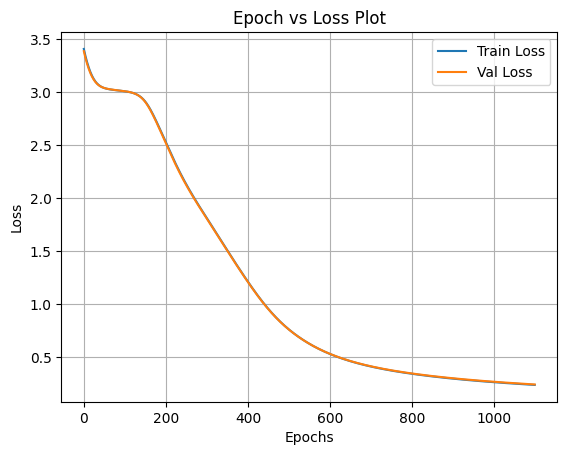

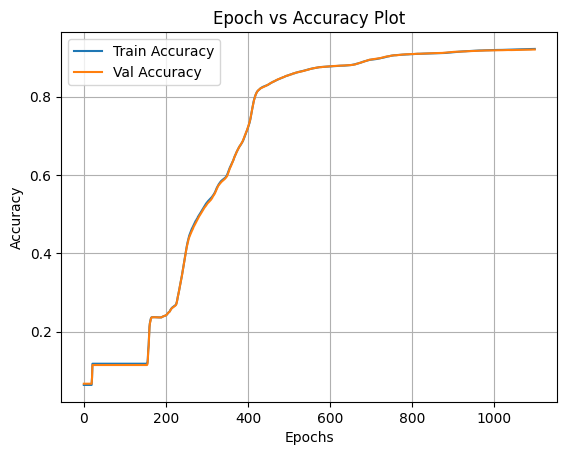

Test Accuracy: 92.03%


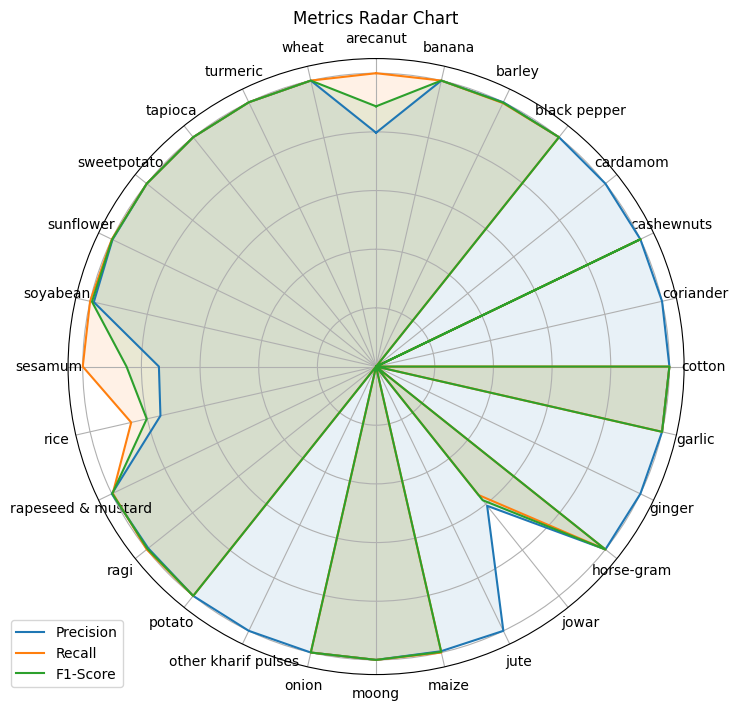

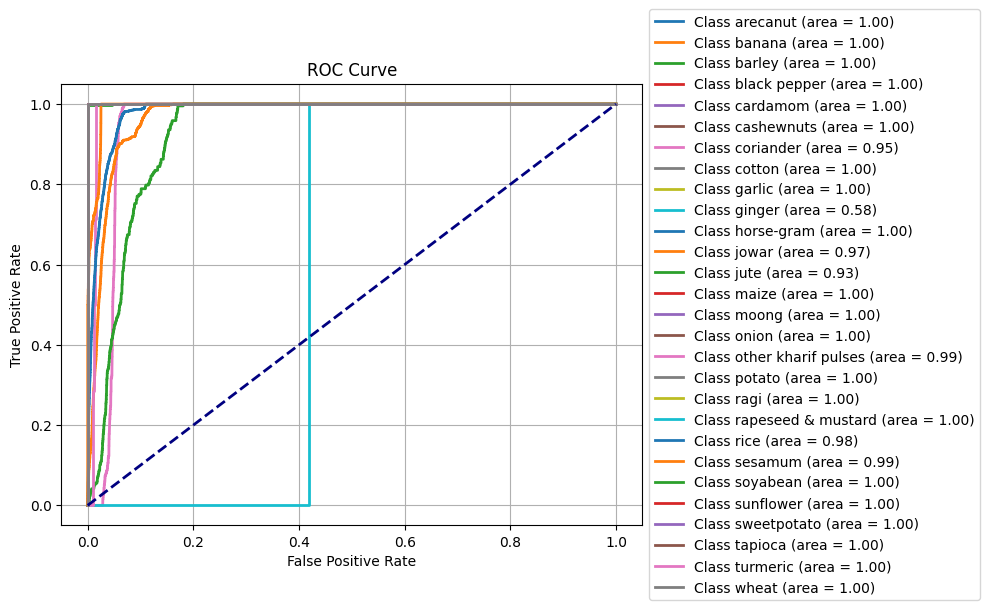

Random OverSampler


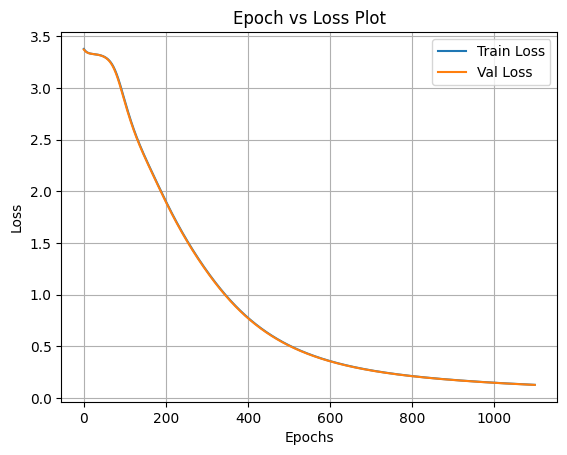

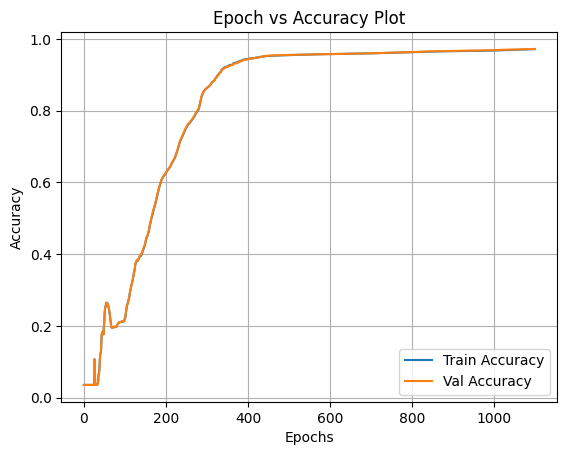

Test Accuracy: 97.20%


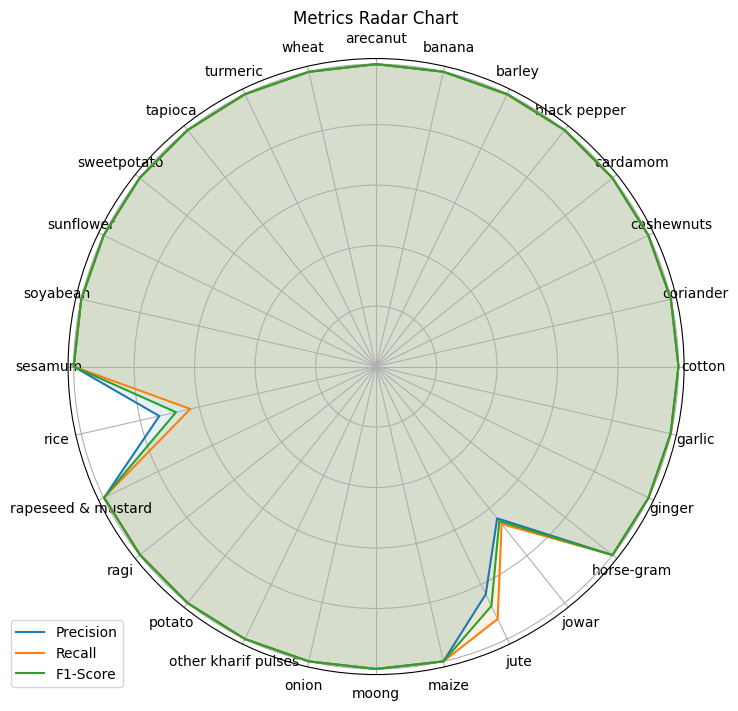

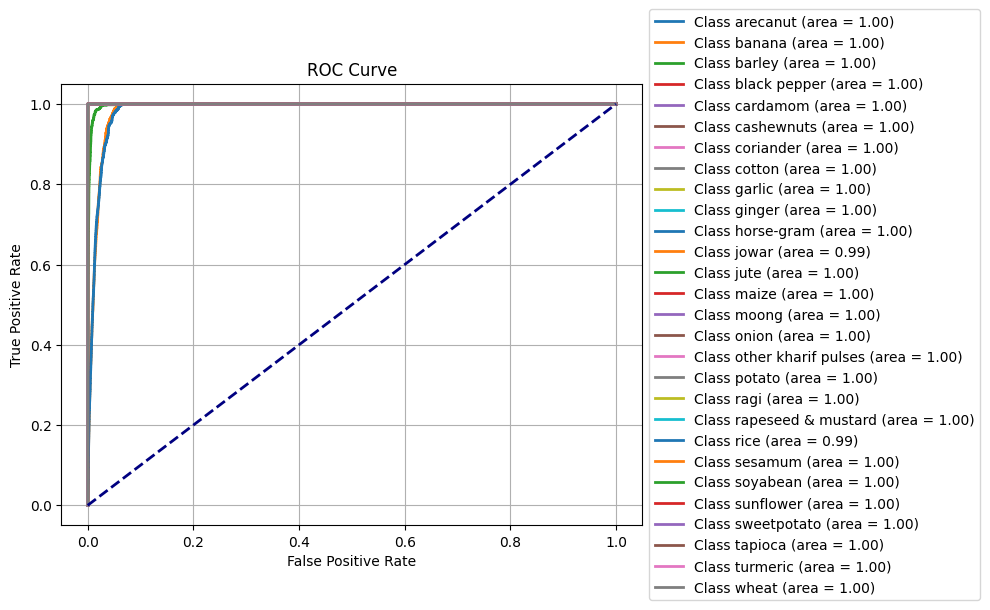

Random UnderSampler


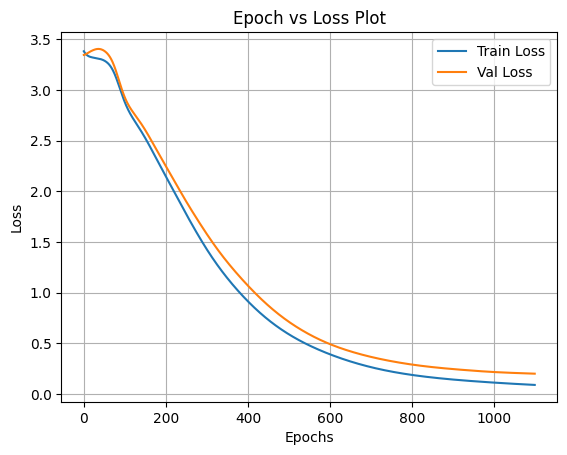

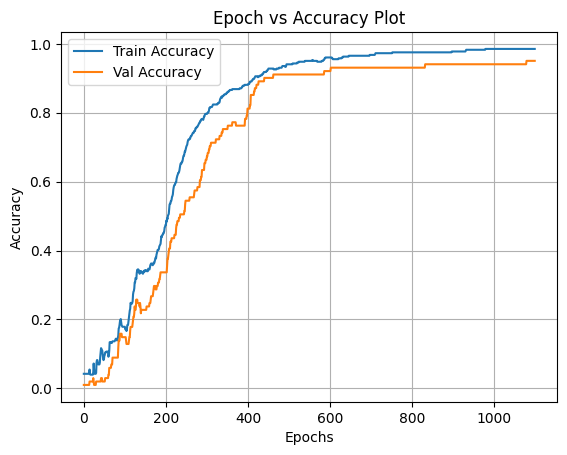

Test Accuracy: 95.05%


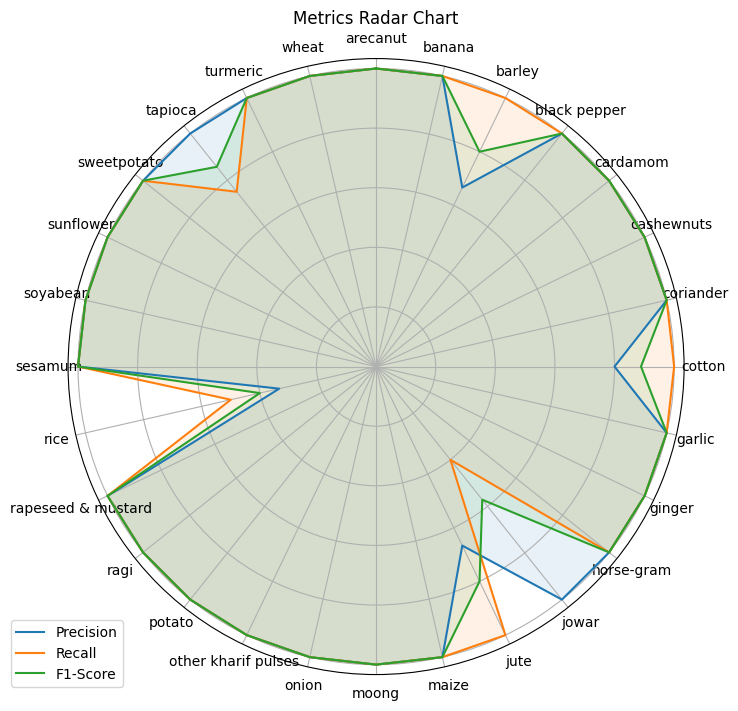

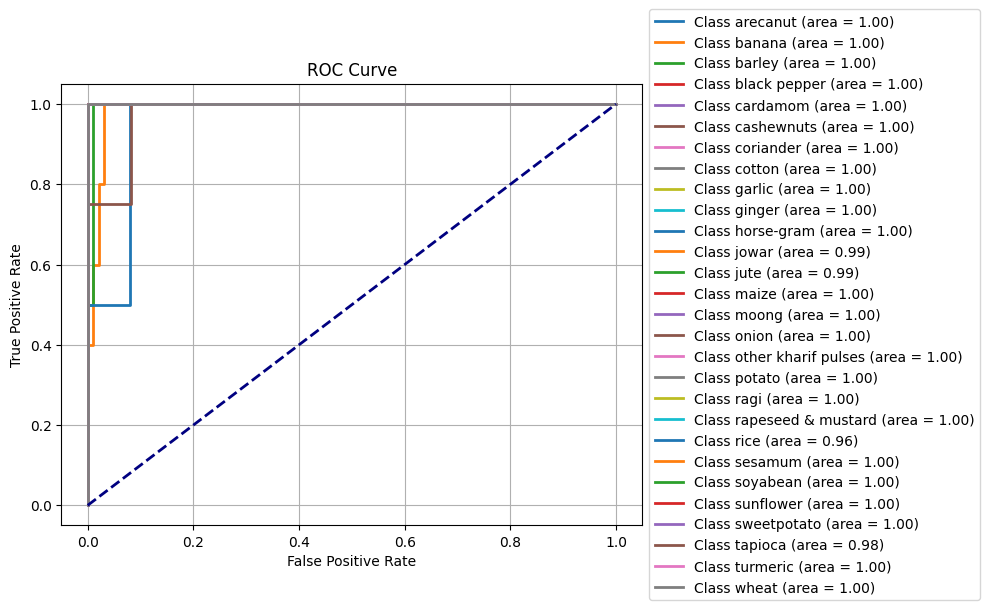

SMOTE


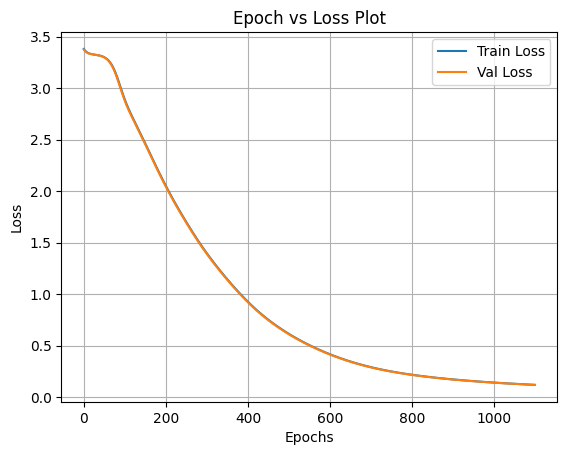

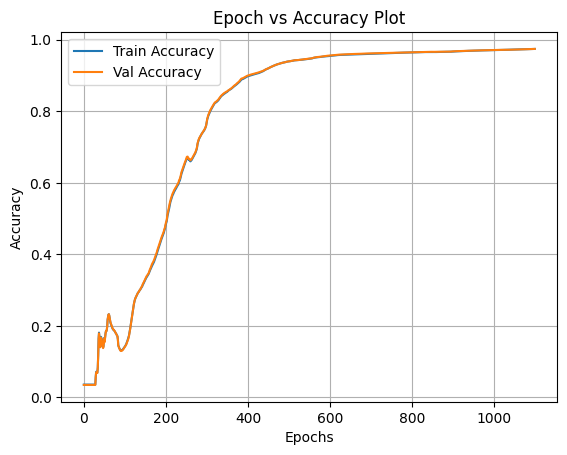

Test Accuracy: 97.44%


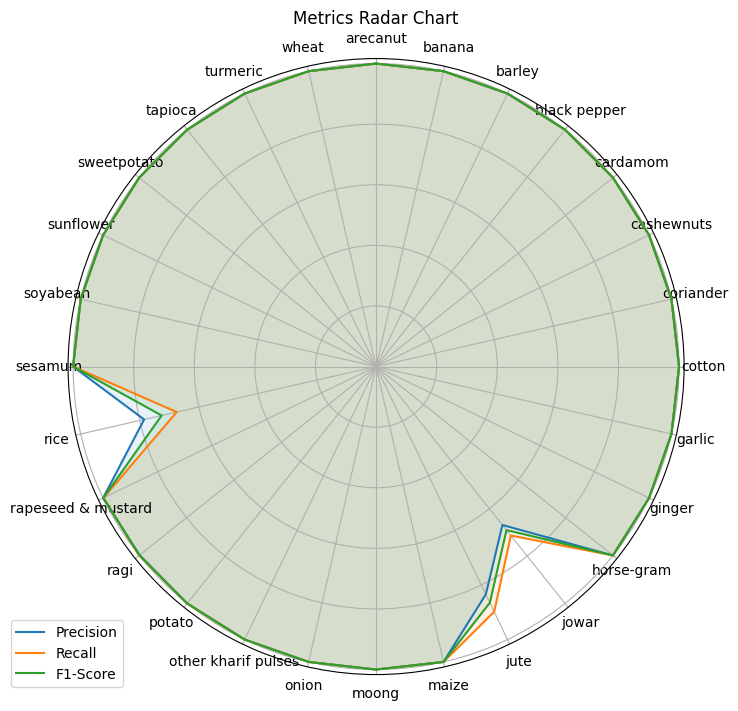

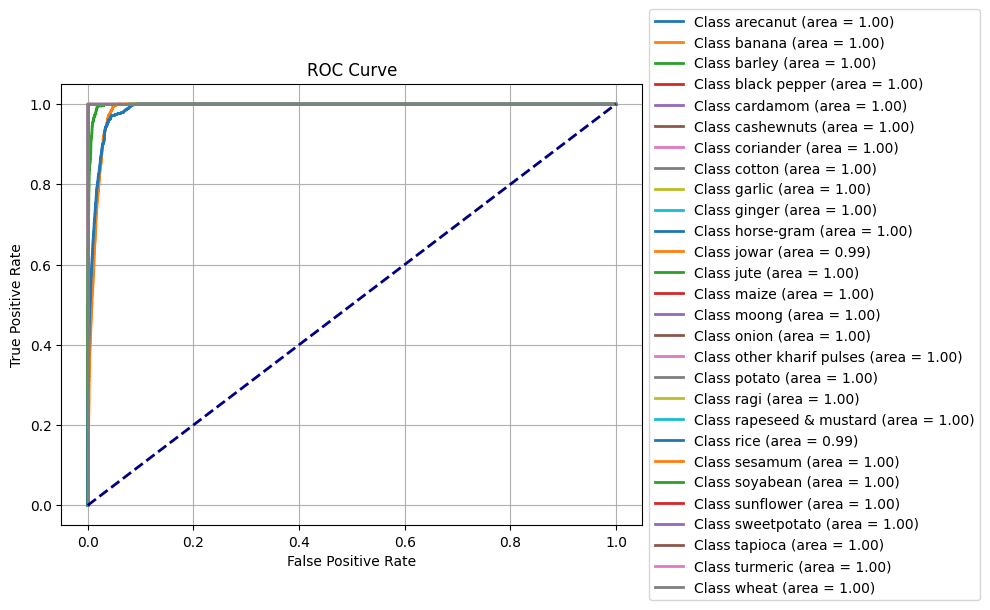

SMOTE + Tomek


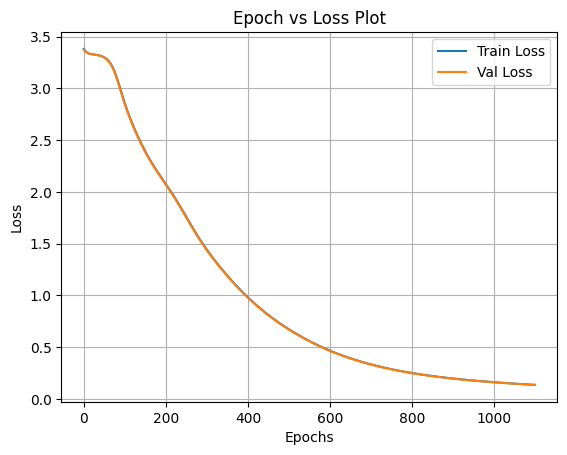

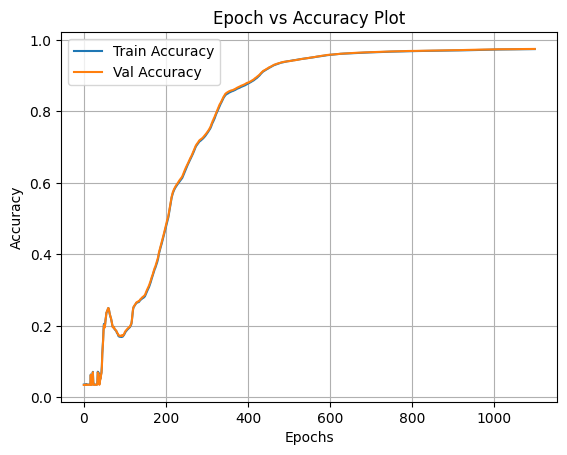

Test Accuracy: 97.47%


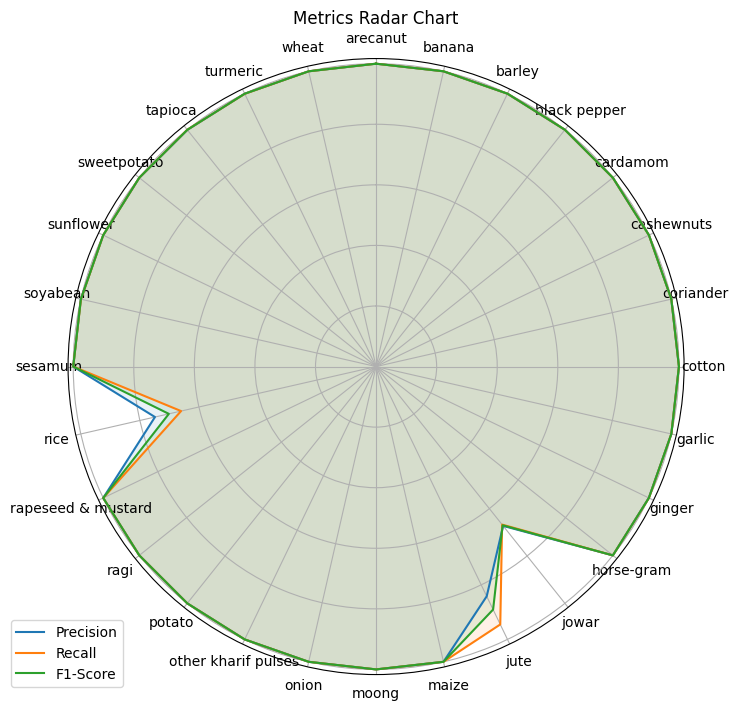

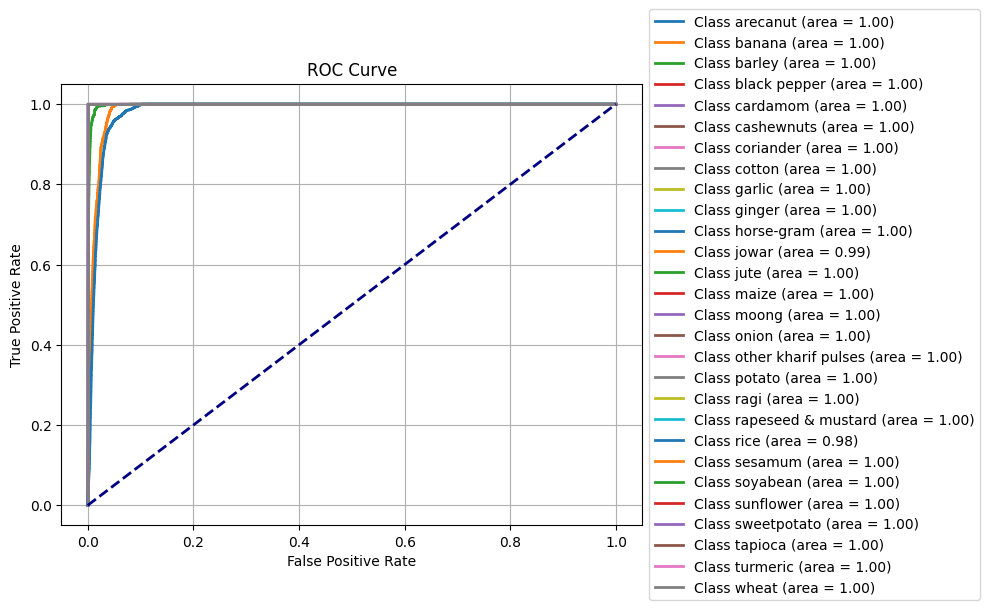

SMOTEENN


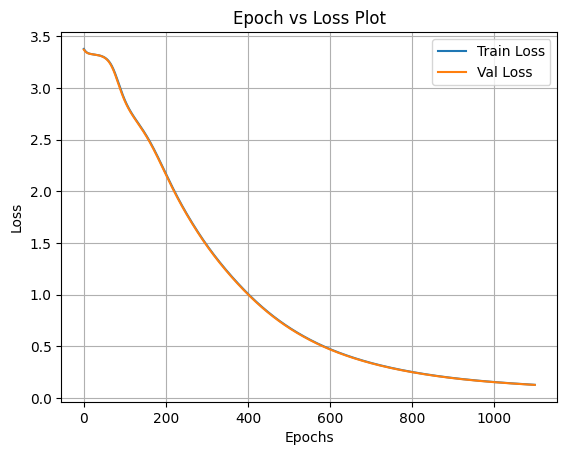

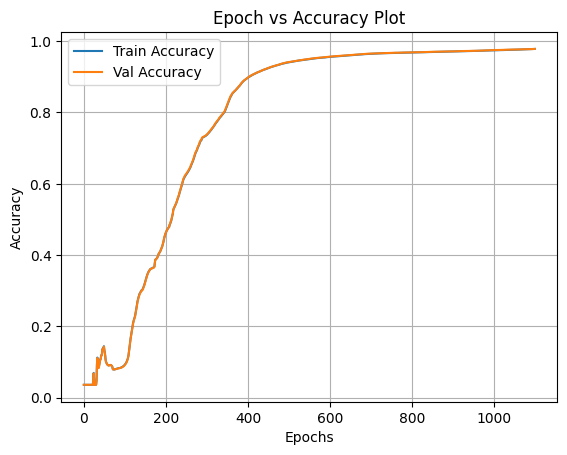

Test Accuracy: 97.83%


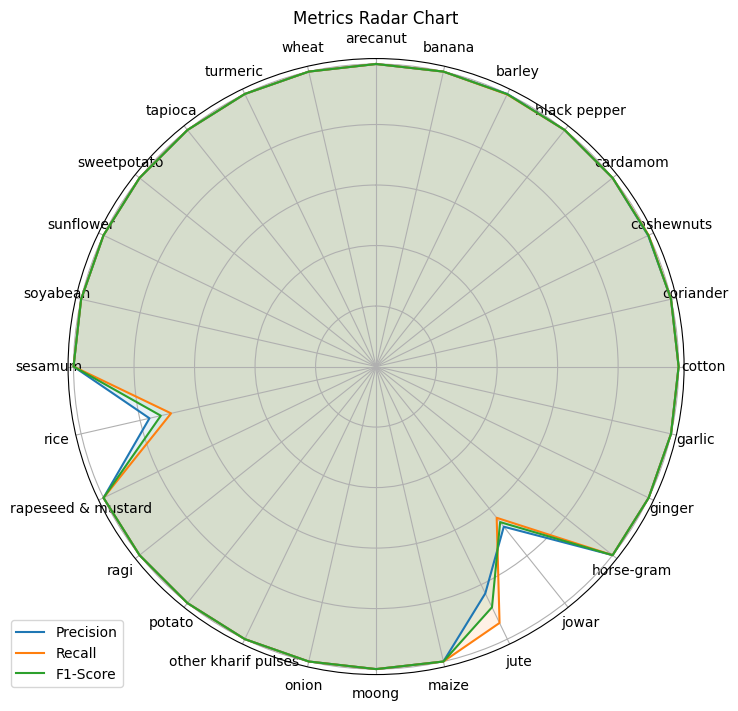

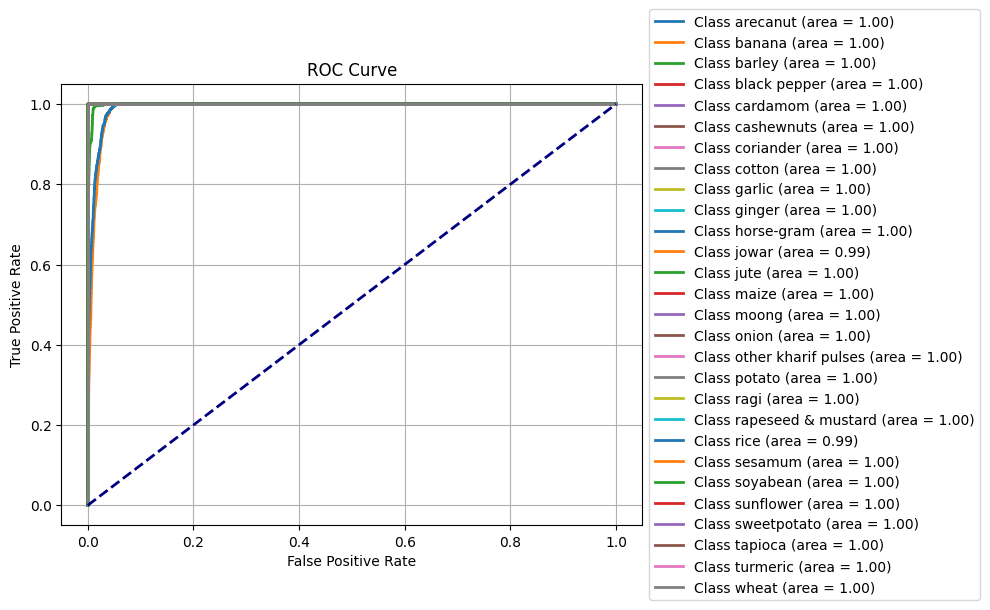

In [ ]:
features = data.drop(columns=['Crop']).values
target = data['Crop'].values


features = torch.tensor(features, dtype=torch.float32).float().to("cuda")
target = torch.tensor(target, dtype=torch.long).long().to("cuda")

train_features, test_features, train_target, test_target = train_test_split(features, target, test_size=0.2, random_state=42)

train_validation(train_features, test_features, train_target, test_target)
#cross_check(features,target,k=5)


features = data.drop(columns=['Crop']).values
target = data['Crop'].values

print("Random OverSampler")
ROSample = RandomOverSampler(sampling_strategy="all")
features,target = ROSample.fit_resample(features,target)


features = torch.tensor(features, dtype=torch.float32).float().to("cuda")
target = torch.tensor(target, dtype=torch.long).long().to("cuda")

train_features, test_features, train_target, test_target = train_test_split(features, target, test_size=0.2, random_state=42)
train_validation(train_features, test_features, train_target, test_target)
#cross_check(features,target,k=5)



features = data.drop(columns=['Crop']).values
target = data['Crop'].values

print("Random UnderSampler")
ROSample = RandomUnderSampler(sampling_strategy="all")
features,target = ROSample.fit_resample(features,target)


features = torch.tensor(features, dtype=torch.float32).float().to("cuda")
target = torch.tensor(target, dtype=torch.long).long().to("cuda")

train_features, test_features, train_target, test_target = train_test_split(features, target, test_size=0.2, random_state=42)
train_validation(train_features, test_features, train_target, test_target)
#cross_check(features,target,k=5)

features = data.drop(columns=['Crop']).values
target = data['Crop'].values

print("SMOTE")

ROSample = SMOTE()
features,target = ROSample.fit_resample(features,target)


features = torch.tensor(features, dtype=torch.float32).float().to("cuda")
target = torch.tensor(target, dtype=torch.long).long().to("cuda")

train_features, test_features, train_target, test_target = train_test_split(features, target, test_size=0.2, random_state=42)
train_validation(train_features, test_features, train_target, test_target)
#cross_check(features,target,k=5)


features = data.drop(columns=['Crop']).values
target = data['Crop'].values

print("SMOTE + Tomek")

ROSample = SMOTETomek()
features,target = ROSample.fit_resample(features,target)



features = torch.tensor(features, dtype=torch.float32).float().to("cuda")
target = torch.tensor(target, dtype=torch.long).long().to("cuda")

train_features, test_features, train_target, test_target = train_test_split(features, target, test_size=0.2, random_state=42)
train_validation(train_features, test_features, train_target, test_target)
#cross_check(features,target,k=5)


features = data.drop(columns=['Crop']).values
target = data['Crop'].values

print("SMOTEENN")

ROSample = SMOTEENN()
features,target = ROSample.fit_resample(features,target)



features = torch.tensor(features, dtype=torch.float32).float().to("cuda")
target = torch.tensor(target, dtype=torch.long).long().to("cuda")

train_features, test_features, train_target, test_target = train_test_split(features, target, test_size=0.2, random_state=42)
train_validation(train_features, test_features, train_target, test_target)
#cross_check(features,target,k=5)

In [ ]:
# def preprocess_input(features, scaler):
#     features = np.array(features)
#     features[np.isnan(features)] = np.nanmean(features, axis=0)
#     features = scaler.transform([features])
#     #features[2:] = scaler.transform(features[2:].reshape(1, -1))
#     return torch.tensor(features, dtype=torch.float32)

# new_data =[1,2,np.nan,np.nan,27,7,400,28,np.nan]  
# preprocessed_data = preprocess_input(new_data, bulk_scaler)
# model.eval()
# with torch.no_grad():
#     output = model(preprocessed_data)
#     _, predicted_crop = torch.max(output.data, 1)
#     print(f'Recommended Crop: {predicted_crop.item()}')
#     print(f'Recommended Crop: {le_D["Crop"].inverse_transform([predicted_crop.item()])}')